In [1]:
import torch
from torch import nn
from torch.nn import functional as F
import matplotlib.pyplot as plt
import numpy as np
from collections import OrderedDict
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [2]:
import japanize_matplotlib

# warning表示off
import warnings
warnings.simplefilter('ignore')

# デフォルトフォントサイズ変更
plt.rcParams['font.size'] = 14

# デフォルトグラフサイズ変更
plt.rcParams['figure.figsize'] = (6,6)

# デフォルトで方眼表示ON
plt.rcParams['axes.grid'] = True

# numpyの表示桁数設定
np.set_printoptions(suppress=True, precision=5)

In [3]:
import os
from ttslearn.env import is_colab
from os.path import exists

# recipeのディレクトリに移動
cwd = os.getcwd()
if cwd.endswith("notebooks"):
    os.chdir("../recipes/HiFiGAN/")
elif is_colab():
    os.chdir("recipes/HiFiGAN/")   

In [4]:
class LayerNorm(nn.LayerNorm):
    def forward(self, x):
        return super().forward(x.float()).type(x.dtype)


class Linear(nn.Linear):
    def forward(self, x):
        return F.linear(
            x,
            self.weight.to(x.dtype),
            None if self.bias is None else self.bias.to(x.dtype),
        )

In [5]:
class MultiHeadAttention(nn.Module):
    def __init__(self, n_state: int, n_head: int):
        super().__init__()
        self.n_head = n_head
        self.query = Linear(n_state, n_state)
        self.key = Linear(n_state, n_state, bias=False)
        self.value = Linear(n_state, n_state)
        self.out = Linear(n_state, n_state)
        self.layer_norm = nn.LayerNorm(n_state)
        self.dropout = nn.Dropout(0.1)

    def forward(
        self,
        x,
        xa = None,
        mask = None
    ):
        residual = x
        q = self.query(x)

        if xa is None:
            # hooks, if installed (i.e. kv_cache is not None), will prepend the cached kv tensors;
            # otherwise, perform key/value projections for self- or cross-attention as usual.
            k = self.key(x if xa is None else xa)
            v = self.value(x if xa is None else xa)
        else:
            k = self.key( xa )
            v = self.value( xa )

        wv, qk, w = self.qkv_attention(q, k, v, mask)
        
        wv_linear = self.out( wv )
        
        output = self.dropout(wv_linear)
        output = self.layer_norm(output + residual)
        
        return wv_linear, qk, w

    def qkv_attention(
        self, q, k, v, mask = None
    ):
        n_batch, n_ctx, n_state = q.shape
        scale = (n_state // self.n_head) ** -0.25
        q = q.view(*q.shape[:2], self.n_head, -1).permute(0, 2, 1, 3) * scale
        k = k.view(*k.shape[:2], self.n_head, -1).permute(0, 2, 3, 1) * scale
        v = v.view(*v.shape[:2], self.n_head, -1).permute(0, 2, 1, 3)

        qk = q @ k
        if mask is not None:
            qk = qk + mask[:n_ctx, :n_ctx]
        qk = qk.float()

        w = F.softmax(qk, dim=-1).to(q.dtype)
        output = (w @ v).permute(0, 2, 1, 3).flatten(start_dim=2)
        qk_detach =  qk.detach()
        
        return output, qk_detach, w

In [ ]:
'''
class ScaledDotProductAttention(nn.Module):
    """ Scaled Dot-Product Attention """

    def __init__(self, temperature):
        super().__init__()
        self.temperature = temperature
        self.softmax = nn.Softmax(dim=2)

    def forward(self, q, k, v, mask=None):

        attn = torch.bmm(q, k.transpose(1, 2))
        attn = attn / self.temperature

        if mask is not None:
            attn = attn.masked_fill(mask, -np.inf)

        attn = self.softmax(attn)
        output = torch.bmm(attn, v)

        return output, attn
'''

In [ ]:
'''
class MultiHeadAttention(nn.Module):
    """ Multi-Head Attention module """

    def __init__(self, n_head, d_model, d_k, d_v, dropout=0.1):
        super().__init__()

        self.n_head = n_head
        self.d_k = d_k
        self.d_v = d_v

        self.w_qs = nn.Linear(d_model, n_head * d_k)
        self.w_ks = nn.Linear(d_model, n_head * d_k)
        self.w_vs = nn.Linear(d_model, n_head * d_v)

        self.attention = ScaledDotProductAttention(temperature=np.power(d_k, 0.5))
        self.layer_norm = nn.LayerNorm(d_model)

        self.fc = nn.Linear(n_head * d_v, d_model)

        self.dropout = nn.Dropout(dropout)

    def forward(self, q, k, v, mask=None):

        d_k, d_v, n_head = self.d_k, self.d_v, self.n_head

        sz_b, len_q, _ = q.size()
        sz_b, len_k, _ = k.size()
        sz_b, len_v, _ = v.size()

        residual = q

        q = self.w_qs(q).view(sz_b, len_q, n_head, d_k)
        k = self.w_ks(k).view(sz_b, len_k, n_head, d_k)
        v = self.w_vs(v).view(sz_b, len_v, n_head, d_v)
        q = q.permute(2, 0, 1, 3).contiguous().view(-1, len_q, d_k)  # (n*b) x lq x dk
        k = k.permute(2, 0, 1, 3).contiguous().view(-1, len_k, d_k)  # (n*b) x lk x dk
        v = v.permute(2, 0, 1, 3).contiguous().view(-1, len_v, d_v)  # (n*b) x lv x dv

        mask = mask.repeat(n_head, 1, 1)  # (n*b) x .. x ..
        output, attn = self.attention(q, k, v, mask=mask)

        output = output.view(n_head, sz_b, len_q, d_v)
        output = (
            output.permute(1, 2, 0, 3).contiguous().view(sz_b, len_q, -1)
        )  # b x lq x (n*dv)

        output = self.dropout(self.fc(output))
        output = self.layer_norm(output + residual)

        return output, attn
'''

In [6]:
tmp_self_attn = MultiHeadAttention( 512, 2 )

input_self_attn = torch.ones( (2,130,512))
input_self_attn_mask = torch.ones( (512,512))

a = tmp_self_attn( input_self_attn, mask = input_self_attn_mask )
print( a )

(tensor([[[ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         ...,
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077]],

        [[ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         ...,
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077],
         [ 0.0561,  0.1903, -0.0397,  ...,  0.0920, -0.3739,  0.0077]]],
       grad_fn=<ViewBackward0>), tensor([[[[0.6330, 0.6330, 0.6330,  ..., 0.6330, 0.6330, 0.6330],
          [0.633

In [7]:
tmp_cross_attn = MultiHeadAttention( 512, 2)

input_corss_attn_a = torch.ones( (2,130,512)) 
input_cross_attn_b = torch.ones( (2,1300,512)) 
input_cross_attn_mask = None

b = tmp_cross_attn( input_corss_attn_a, input_cross_attn_b )

print( b )

(tensor([[[ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         ...,
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372]],

        [[ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         ...,
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372],
         [ 0.5513,  0.3332,  0.8483,  ...,  0.3258, -0.1977, -0.2372]]],
       grad_fn=<ViewBackward0>), tensor([[[[-0.0578, -0.0578, -0.0578,  ..., -0.0578, -0.0578, -0.0578],
          

In [8]:
class PositionwiseFeedForward(nn.Module):
    """ A two-feed-forward-layer module """

    def __init__(self, d_in, d_hid, kernel_size, dropout=0.1):
        super().__init__()

        # Use Conv1D
        # position-wise
        self.w_1 = nn.Conv1d(
            d_in,
            d_hid,
            kernel_size=kernel_size[0],
            padding=(kernel_size[0] - 1) // 2,
        )
        # position-wise
        self.w_2 = nn.Conv1d(
            d_hid,
            d_in,
            kernel_size=kernel_size[1],
            padding=(kernel_size[1] - 1) // 2,
        )

        self.layer_norm = nn.LayerNorm(d_in)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        residual = x
        output = x.transpose(1, 2)
        output = self.w_2(F.relu(self.w_1(output)))
        output = output.transpose(1, 2)
        output = self.dropout(output)
        output = self.layer_norm(output + residual)

        return output

In [9]:

class ResidualAttentionBlock(nn.Module):
    def __init__(self, n_state: int, n_head: int, cross_attention: bool = False, kernel_size = [9,1], n_ffn = 2048):
        super().__init__()

        self.attn = MultiHeadAttention(n_state, n_head)
        self.attn_ln = LayerNorm(n_state)

        self.cross_attn = MultiHeadAttention(n_state, n_head ) if cross_attention else None
        self.cross_attn_ln = LayerNorm(n_state) if cross_attention else None

        self.pos_ffn = PositionwiseFeedForward(n_state, n_ffn, kernel_size = [9,1], dropout = 0.1  )

    def forward(
        self,
        x,
        xa,
        mask = None
    ):
        #x = x + self.attn(self.attn_ln(x), self.attn_ln(x), self.attn_ln(x), attn_mask=mask)[0]
        xx, _, attn1 = self.attn(self.attn_ln(x), mask=mask)
        x = x + xx
        if self.cross_attn:
            xx, _, attn2 = self.cross_attn(self.cross_attn_ln(x), xa, mask = None)
            x = x + xx
        else:
            attn2 = []
        x = self.pos_ffn( x )
        return x, attn1, attn2


In [10]:
encoder_layer = ResidualAttentionBlock( n_state = 512, n_head = 2, cross_attention = False, kernel_size = 3 )

In [11]:
#encoder_layer.eval()

x = torch.ones( (2, 130, 512 ))
mask = torch.ones( ( 130, 130 ))

a = encoder_layer( x, x, mask = None )

print( a )

(tensor([[[-1.4715e+00, -5.0291e-01, -6.5160e-01,  ...,  1.4753e+00,
           1.2158e+00, -1.7929e-01],
         [-2.2678e+00,  2.1005e-01, -5.9266e-01,  ...,  1.1706e+00,
           1.2789e+00,  1.0778e+00],
         [-1.4210e-02,  4.3131e-02, -2.6788e-01,  ...,  1.6438e+00,
           9.5293e-01,  1.0629e-01],
         ...,
         [-1.5399e+00,  6.4028e-01,  6.0457e-01,  ...,  2.2088e+00,
          -8.7034e-02,  2.8961e+00],
         [ 6.1311e-03,  2.1013e-01, -5.3324e-04,  ...,  2.3637e+00,
           1.2367e-01,  2.7562e+00],
         [-1.3570e+00,  1.4032e-01,  1.5048e+00,  ...,  2.5138e+00,
          -2.2000e-01,  2.9236e+00]],

        [[-1.4720e+00, -4.8406e-01, -6.3574e-01,  ...,  1.5338e+00,
           1.9196e-01, -1.5395e-01],
         [-2.2415e+00,  1.8703e-01, -5.9969e-01,  ...,  1.1285e+00,
           1.2346e+00,  1.0375e+00],
         [-2.6770e+00,  1.9369e-01, -3.2220e-03,  ...,  1.6183e+00,
           9.4513e-01,  1.2673e+00],
         ...,
         [-1.5145e+00,  

In [12]:
class Encoder(nn.Module):
    def __init__(
        self,
        num_vocab=59,
        embed_dim=512,
        conv_layers=3,
        conv_channels=512,
        conv_kernel_size=5,
        enc_hidden_dim = 512,
        num_enc_layers = 6,
        num_heads = 4,
        enc_dropout_rate = 0.1,
        conv_dropout_rate = 0.1,
        input_maxlen = 300,
        ffn_dim = 2048,
        enc_kernel_size = 3,
        enc_filter_size = 2048
    ):
        super(Encoder, self).__init__()
        # 文字の埋め込み表現
        self.embed = nn.Embedding(num_vocab, embed_dim, padding_idx=0)
        # position_embedding
        self.pos_emb = nn.Embedding(input_maxlen, embed_dim).to(device)
        # 1 次元畳み込みの重ね合わせ：局所的な時間依存関係のモデル化
        convs = nn.ModuleList()
        for layer in range(conv_layers):
            in_channels = embed_dim if layer == 0 else conv_channels
            out_channels = enc_hidden_dim if layer == conv_layers - 1 else conv_channels
            #print( " in_channels:{}".format( in_channels ))
            #print( " out_channels:{}".format( out_channels ))
            convs += [
                nn.Conv1d(
                    in_channels,
                    out_channels,
                    conv_kernel_size,
                    padding=(conv_kernel_size - 1) // 2,
                    bias=False,  # この bias は不要です
                ),
                nn.BatchNorm1d(out_channels),
                nn.ReLU(),
                nn.Dropout(conv_dropout_rate),
            ]
        self.convs = nn.Sequential(*convs)
        # Attention Block
        self.blocks: Iterable[ResidualAttentionBlock] = nn.ModuleList(
            [ResidualAttentionBlock(embed_dim, num_heads, cross_attention = False, kernel_size = enc_kernel_size, n_ffn = enc_filter_size ) for _ in range(num_enc_layers)]
        )
        self.input_maxlen = input_maxlen
        self.dropout = nn.Dropout(p=enc_dropout_rate)
        
    def forward(self, x, in_lens ):
        emb = self.embed(x)
        # 1 次元畳み込みと embedding では、入力のサイズ が異なるので注意
        out = self.convs(emb.transpose(1, 2)).transpose(1, 2)
        # position embbeding
        maxlen = out.size()[1]
        positions = torch.range(start=0, end=self.input_maxlen - 1, step=1).to(torch.long).to(device)
        positions = self.pos_emb(positions.to(device))[:maxlen,:]
        x = out.to(device) + positions.to(device)
        x = self.dropout( x )
        
        # attention block
        attention_weights = {}
        for i, block in enumerate( self.blocks ):
            x, attn1, attn2 = block(x, x, mask = None)
            attention_weights["{}".format( 2*i + 1 )] = attn1
            attention_weights["{}".format( 2*i + 2 )] = attn2
        
        return x, attention_weights  # (batch_size, input_seq_len, d_model)

In [13]:
tmp_encoder = Encoder(
        num_vocab=52,
        embed_dim=512,
        conv_layers=3,
        conv_channels=512,
        conv_kernel_size=5,
        enc_hidden_dim = 512,
        num_enc_layers = 6,
        num_heads = 4,
        enc_dropout_rate = 0.1,
        conv_dropout_rate = 0.1,
        input_maxlen = 300,
        ffn_dim = 2048,
        enc_kernel_size = 3,
        enc_filter_size = 2048
    ).to(device)

In [14]:
#tmp_encoder.eval()
a = torch.ones( (2, 130), dtype=torch.long)

in_lens = []
for i in a:
    in_lens.append( len(a)) 

in_lens = torch.tensor( in_lens )    

b, _ = tmp_encoder( a.to(device), in_lens.to(device) )
print( " size of b:{}".format( b.size()))
print( b )

 size of b:torch.Size([2, 130, 512])
tensor([[[-1.3179e+00, -1.3912e+00,  9.3257e-01,  ..., -2.7479e-01,
          -1.6772e-01, -1.0175e+00],
         [-7.8114e-01, -1.2789e+00, -8.5338e-02,  ..., -1.1665e+00,
          -1.5718e+00, -5.5712e-01],
         [ 1.1869e+00, -2.0708e-01, -7.2215e-01,  ..., -1.3232e+00,
          -7.0271e-01,  1.3629e-01],
         ...,
         [-2.0047e+00, -9.6889e-01, -3.0897e-01,  ..., -1.2469e+00,
          -1.5664e+00, -8.8025e-01],
         [-1.3970e+00, -8.1403e-01, -1.5086e-01,  ..., -4.7737e-01,
          -1.5904e+00, -6.4217e-01],
         [-1.2817e+00, -8.9855e-01,  3.5456e-04,  ..., -1.1803e+00,
          -1.0860e-01, -1.0024e+00]],

        [[-1.6063e+00, -1.0004e-01, -6.4015e-01,  ..., -7.3217e-01,
           5.2752e-02, -9.8778e-01],
         [-8.2626e-01, -1.2482e+00, -2.2241e-01,  ..., -1.1967e+00,
          -7.3010e-01, -6.5698e-01],
         [ 5.4540e-01, -9.0667e-01, -5.4833e-01,  ..., -1.5591e+00,
          -1.0460e+00, -7.4054e-01],
  

In [15]:
class Prenet(nn.Module):
    def __init__(self, in_dim, dec_hidden_dim, layers=2, hidden_dim=256, dropout=0.5):
        super().__init__()
        self.dropout = dropout
        prenet = nn.ModuleList()
        for layer in range(layers):
            in_dims = in_dim if layer == 0 else hidden_dim
            out_dims = dec_hidden_dim if layer == layers - 1 else hidden_dim
            prenet += [
                nn.Linear(in_dims, out_dims ).to(device),
                nn.ReLU().to(device),
                nn.Dropout(dropout).to(device) # added by Toshio Uchiyama
            ]
        self.prenet = nn.Sequential(*prenet)   
        self.prenet = nn.Sequential(*prenet)

    def forward(self, x):
        for layer in self.prenet:
            x = layer(x.to(device))
        return x

In [16]:
decoder_layer = ResidualAttentionBlock( n_state = 512, n_head = 2, cross_attention = True, kernel_size = 9 , n_ffn = 2048  )

In [17]:
#decoder_layer.eval()

x = torch.ones( (2, 1300, 512 ))
mask = torch.ones( ( 1300, 1300 ))

a = decoder_layer( x, x, mask = mask )

print( a )

(tensor([[[ 0.5211, -1.0126, -0.9235,  ...,  0.5408, -0.6966, -0.6505],
         [ 0.5263, -1.4708,  0.5995,  ...,  0.7112, -0.5630, -0.4047],
         [ 0.2756, -1.1581, -0.8971,  ...,  0.5562, -0.6391, -0.0211],
         ...,
         [ 0.1895, -1.0298,  0.5864,  ...,  0.4493, -0.5259, -0.4640],
         [ 0.2060, -0.8256,  0.4627,  ...,  0.3805, -0.2153, -0.4997],
         [ 0.5633, -0.7373,  0.3980,  ...,  0.4961, -0.3282, -0.4126]],

        [[ 0.5243, -1.0142,  0.0147,  ...,  0.7195, -0.6973, -0.6510],
         [ 0.5344, -1.4738,  0.6081,  ...,  0.7204, -0.5609, -0.4017],
         [ 0.2871, -1.1377, -0.8784,  ...,  0.5660, -0.6219, -0.0078],
         ...,
         [ 0.7877, -1.0586,  0.5873,  ...,  0.4477, -0.5454, -0.2180],
         [ 0.7999, -0.8201,  0.4584,  ...,  0.3768, -0.6479, -0.4967],
         [ 0.5834, -0.7235, -0.8540,  ...,  0.5159, -0.3124, -0.3971]]],
       grad_fn=<NativeLayerNormBackward0>), tensor([[[[0.0008, 0.0008, 0.0008,  ..., 0.0008, 0.0008, 0.0008],
     

In [18]:
class Decoder(nn.Module):
    def __init__(
        self,
        decoder_hidden_dim=512,
        prenet_in_dim = 512,
        out_dim=80,
        layers=6,
        prenet_layers=2,
        prenet_hidden_dim=512,
        prenet_dropout=0.5,
        ffn_dim=2048,
        dropout_rate = 0.1,
        dec_input_maxlen=3000,
        num_heads = 4,
        dec_kernel_size = 3,
        dec_filter_size = 2048
    ):
        super().__init__()
        self.out_dim = out_dim
        self.num_heads = num_heads

        # Prenet
        self.prenet = Prenet(prenet_in_dim, decoder_hidden_dim,  prenet_layers, prenet_hidden_dim, dropout = prenet_dropout).to(device)

        #  Attention  Block
        self.blocks: Iterable[ResidualAttentionBlock] = nn.ModuleList(
            [ResidualAttentionBlock(decoder_hidden_dim, num_heads, cross_attention=True, kernel_size = dec_kernel_size, n_ffn = dec_filter_size  ) for _ in range(layers)]
            #[ResidualAttentionBlock(decoder_hidden_dim, num_heads, cross_attention=False, kernel_size = dec_kernel_size, filter_size = dec_filter_size  ) for _ in range(layers)]
        )
        
        # position embedding
        self.pos_emb = nn.Embedding(dec_input_maxlen, decoder_hidden_dim).to(device)
        
 
        # 出力への projection 層
        proj_in_dim = decoder_hidden_dim
        self.feat_out = nn.Linear(proj_in_dim, out_dim, bias=False)
        
        self.dec_input_maxlen = dec_input_maxlen

    def forward(self, encoder_outs, decoder_targets=None):

        # Pre-Net
        prenet_out = self.prenet(decoder_targets)
        # position embedding
        maxlen = prenet_out.size()[1]
        positions = torch.range(start=0, end=self.dec_input_maxlen - 1, step=1).to(torch.long)
        positions = self.pos_emb(positions.to(device))[:maxlen,:]
        x = prenet_out + positions
        
        #attention block
        attention_weights = {}
        
        for i, block in enumerate( self.blocks ):
            x, attn1, attn2 = block(x, encoder_outs, mask=None)
            #x, attn1, attn2 = block(x, x, mask=None)
            attention_weights["{}".format( 2*i + 1 )] = attn1
            attention_weights["{}".format( 2*i + 2 )] = attn2
        
        # attention の　hidden_dim から mel の　80 へ。
        outs = self.feat_out(x)
        outs = torch.permute(outs, (0, 2, 1))
        
        return outs, attention_weights



In [19]:
tmp_decoder = Decoder(
        decoder_hidden_dim=512,
        prenet_in_dim = 512,
        out_dim=80,
        layers=6,
        prenet_layers=2,
        prenet_hidden_dim=512,
        prenet_dropout=0.5,
        ffn_dim=2048,
        dropout_rate = 0.1,
        dec_input_maxlen=3000,
        num_heads = 4,
        dec_kernel_size = 3,
        dec_filter_size = 2048
)


In [20]:
#tmp_decoder.eval()

a = torch.ones( (2, 130, 512), dtype=torch.float)

in_lens = []
for i in a:
    in_lens.append( len(a)) 

b = torch.ones( (2, 1300, 512 ), dtype=torch.float )

in_lens = torch.tensor( in_lens )

tmp_decoder = tmp_decoder.to(device)

c, e = tmp_decoder( a.to(device), b.to(device) )

print( "size of c:{}".format( c.size()))
print( c )

size of c:torch.Size([2, 80, 1300])
tensor([[[ 0.4365,  0.6555,  0.7578,  ...,  0.8838,  0.4254,  0.9290],
         [ 0.2083,  0.5864,  1.3477,  ...,  0.7809,  1.3326,  0.8464],
         [-0.5765, -0.5119, -0.6026,  ..., -0.8986, -0.7065,  0.0758],
         ...,
         [-0.0658, -0.8783, -0.8037,  ..., -0.1877, -0.7146,  0.1632],
         [ 0.1060, -0.7481, -0.7919,  ..., -0.1631,  0.1856,  0.2168],
         [ 0.6276,  0.5381,  0.4235,  ...,  0.4105,  0.4780, -0.1149]],

        [[ 0.3000,  0.4460,  0.7397,  ...,  0.7842,  0.2702,  0.8735],
         [ 0.2223,  0.8876,  1.2358,  ...,  0.5950,  1.3142,  0.8552],
         [-0.5427, -0.5736, -0.5840,  ..., -0.7786, -0.7848, -0.2258],
         ...,
         [-0.1717, -0.8276, -0.9019,  ..., -0.2579, -0.5517,  0.1874],
         [ 0.0414, -0.5841, -0.9370,  ...,  0.1291,  0.1210,  0.0429],
         [ 0.7607,  0.4929,  0.3964,  ...,  0.1898,  0.5234, -0.2669]]],
       device='cuda:0', grad_fn=<PermuteBackward0>)


In [21]:
class Postnet(nn.Module):
    def __init__(
        self,
        in_dim=80,
        layers=5,
        channels=512,
        kernel_size=5,
        dropout=0.5,
    ):
        super().__init__()
        postnet = nn.ModuleList()
        for layer in range(layers):
            in_channels = in_dim if layer == 0 else channels
            out_channels = in_dim if layer == layers - 1 else channels
            postnet += [
                nn.Conv1d(
                    in_channels,
                    out_channels,
                    kernel_size,
                    stride=1,
                    padding=(kernel_size - 1) // 2,
                    bias=False,
                ),
                nn.BatchNorm1d(out_channels),
            ]
            if layer != layers - 1:
                postnet += [nn.Tanh()]
            postnet += [nn.Dropout(dropout)]
        self.postnet = nn.Sequential(*postnet)

    def forward(self, xs):
        return self.postnet(xs)

In [22]:
def pad_list(xs, pad_value):
    """Perform padding for the list of tensors.

    Args:
        xs (List): List of Tensors [(T_1, `*`), (T_2, `*`), ..., (T_B, `*`)].
        pad_value (float): Value for padding.

    Returns:
        Tensor: Padded tensor (B, Tmax, `*`).

    Examples:
        >>> x = [torch.ones(4), torch.ones(2), torch.ones(1)]
        >>> x
        [tensor([1., 1., 1., 1.]), tensor([1., 1.]), tensor([1.])]
        >>> pad_list(x, 0)
        tensor([[1., 1., 1., 1.],
                [1., 1., 0., 0.],
                [1., 0., 0., 0.]])

    """
    n_batch = len(xs)
    max_len = max(x.size(0) for x in xs)
    pad = xs[0].new(n_batch, max_len, *xs[0].size()[1:]).fill_(pad_value)

    for i in range(n_batch):
        pad[i, : xs[i].size(0)] = xs[i]

    return pad

In [23]:
class LengthRegulator(torch.nn.Module):
    def __init__(self,pad_value = 0.0):
        super().__init__()
        self.pad_value = pad_value
        
    def forward(self, xs, ds ):
        #[print( "shape of x:{}, shape of d:{}".format( torch.tensor(x).size(), torch.tensor( d).size())) for x, d in zip(xs, ds)]
        repeat = [torch.repeat_interleave(x, d, dim=0) for x, d in zip(xs, ds)]
        return pad_list(repeat, self.pad_value)

In [24]:
class Conv(nn.Module):
    """
    Convolution Module
    """

    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=1,
        stride=1,
        padding=0,
        dilation=1,
        bias=True,
        w_init="linear",
    ):
        """
        :param in_channels: dimension of input
        :param out_channels: dimension of output
        :param kernel_size: size of kernel
        :param stride: size of stride
        :param padding: size of padding
        :param dilation: dilation rate
        :param bias: boolean. if True, bias is included.
        :param w_init: str. weight inits with xavier initialization.
        """
        super(Conv, self).__init__()

        self.conv = nn.Conv1d(
            in_channels,
            out_channels,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
            dilation=dilation,
            bias=bias,
        )

    def forward(self, x):
        x = x.contiguous().transpose(1, 2)
        x = self.conv(x)
        x = x.contiguous().transpose(1, 2)

        return x

In [25]:
class DurationPredictor(nn.Module):
    """Duration, Pitch and Energy Predictor"""

    def __init__(self, input_size, filter_size, kernel_size, dp_dropout = 0.5 ):
        super(DurationPredictor, self).__init__()

        self.input_size = input_size
        self.filter_size = filter_size
        self.kernel = kernel_size
        self.conv_output_size = filter_size
        self.dropout = dp_dropout
        self.encoder_max = encoder_max

        self.conv_layer = nn.Sequential(
            OrderedDict(
                [
                    (
                        "conv1d_1",
                        Conv(
                            self.input_size,
                            self.filter_size,
                            kernel_size=self.kernel,
                            padding=(self.kernel - 1) // 2,
                        ),
                    ),
                    ("relu_1", nn.ReLU()),
                    ("layer_norm_1", nn.LayerNorm(self.filter_size)),
                    ("dropout_1", nn.Dropout(self.dropout)),
                    (
                        "conv1d_2",
                        Conv(
                            self.filter_size,
                            self.filter_size,
                            kernel_size=self.kernel,
                            padding=1,
                        ),
                    ),
                    ("relu_2", nn.ReLU()),
                    ("layer_norm_2", nn.LayerNorm(self.filter_size)),
                    ("dropout_2", nn.Dropout(self.dropout)),
                ]
            )
        )

        self.linear_layer1 = nn.Linear( self.conv_output_size, 1 )
        self.offset = 1
        #self.linear_layer2 = nn.Linear( self.encoder_max, 1)

    def forward(self, encoder_output, is_inference = False ):
        out = self.conv_layer(encoder_output)
        out = self.linear_layer1( out )
        out = out.squeeze(-1)
        if is_inference == True:
            #out = torch.clamp(
            #    torch.round(out.exp() - self.offset), min=0
            #    ).long() # avoid negative value
            out = torch.clamp( torch.round( out ), min = 0 ).long()
        
        return out

In [26]:
input_size = 512
filter_size = 512
kernel_size = 3
encoder_max = 300

tmp_duration_prediction = DurationPredictor( input_size, filter_size, kernel_size )

tmp_duration_prediction = tmp_duration_prediction.to(device)

In [27]:
a = torch.ones( (2,31,512))
b = torch.ones( (2,31))
c = []
for bb in b:
    c.append( len( bb ) )
c = torch.tensor( c )


b = tmp_duration_prediction( a.to(device ), is_inference = True )

print( b )

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 1, 1],
        [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


In [28]:
class Transtron(nn.Module):
    def __init__(self,
            num_vocab=59,
            embed_dim=512,
            conv_layers=3,
            conv_channels=512,
            conv_kernel_size=5,
            enc_hidden_dim = 512,
            num_enc_layers = 6,
            enc_num_heads = 4,
            enc_dropout_rate = 0.1,
            conv_dropout_rate = 0.1,
            enc_input_maxlen = 300,
            enc_ffn_dim = 2048,
            enc_kernel_size = 3,
            enc_filter_size = 2048,
            decoder_hidden_dim=512,
            prenet_in_dim = 512,
            out_dim=80,
            num_dec_layers=6,
            prenet_layers=2,
            prenet_hidden_dim=512,
            prenet_dropout=0.5,
            dec_ffn_dim=2048,
            dec_dropout_rate = 0.1,
            dec_input_maxlen=3000,
            dec_num_heads = 4,
            dec_kernel_size = 3,
            dec_filter_size = 2048,
            postnet_in_dim=80,
            postnet_layers=5,
            postnet_channels=512,
            postnet_kernel_size=5,
            postnet_dropout=0.5,
            dp_input_size = 512,
            dp_filter_size = 512,
            dp_kernel_size = 3,
            dp_dropout = 0.4,
        ):
        super().__init__()
        self.encoder = Encoder(
            num_vocab,
            embed_dim,
            conv_layers,
            conv_channels,
            conv_kernel_size,
            enc_hidden_dim,
            num_enc_layers,
            enc_num_heads,
            enc_dropout_rate,
            conv_dropout_rate,
            enc_input_maxlen,
            enc_ffn_dim 
        )
        self.decoder = Decoder(
            decoder_hidden_dim,
            prenet_in_dim,
            out_dim,
            num_dec_layers,
            prenet_layers,
            prenet_hidden_dim,
            prenet_dropout,
            dec_ffn_dim,
            dec_dropout_rate,
            dec_input_maxlen,
            dec_num_heads,
            dec_kernel_size,
            dec_filter_size,
        )
        self.postnet = Postnet(
            postnet_in_dim,
            postnet_layers,
            postnet_channels,
            postnet_kernel_size,
            postnet_dropout
        )
        self.duration_prediction = DurationPredictor(
            dp_input_size, 
            dp_filter_size,
            dp_kernel_size,
            dp_dropout,
        )
        self.length_regulator = LengthRegulator()


    def forward(self, seq, in_lens, decoder_targets, out_lens, dur_feats):
        # エンコーダによるテキストに潜在する表現の獲得
        encoder_outs, att_ws_enc = self.encoder(seq, in_lens)
        
        # 学習時、npy ファイルから与えられた duration を元に、length_regurator で、エンコーダー in_feats の T から デコーダー out_feats の T へ。  
        decoder_targets1 = self.length_regulator( encoder_outs, dur_feats )
        
        # デコーダーの T の微調整。これをしないと、MSELoss の前の mask でエラーになる。
        decoder_targets2 = torch.zeros( decoder_targets.size(0), decoder_targets.size(1), encoder_outs.size(2) )

        if decoder_targets1.size(1) < decoder_targets2.size(1):
            decoder_targets2[:,:decoder_targets1.size(1),:] = decoder_targets1[:,:,:]
        else:
            decoder_targets2[:,:,:] = decoder_targets1[:,:decoder_targets2.size(1),:]
        
        # デコーダによるメルスペクトログラム の予測
        outs, att_ws_dec = self.decoder( encoder_outs, decoder_targets2 )

        att_ws = {}
        att_ws["enc"] = att_ws_enc
        att_ws["dec"] = att_ws_dec
        
        # Post-Net によるメルスペクトログラムの残差の予測
        outs_fine = outs + self.postnet(outs)

        # (B, C, T) -> (B, T, C)
        outs = outs.transpose(2, 1)
        outs_fine = outs_fine.transpose(2, 1)

        # 学習時に duration_prediction の学習のために計算している。
        duration_predict = self.duration_prediction( encoder_outs, is_inference =False )

        return outs, outs_fine, duration_predict, att_ws
    
    @torch.no_grad()
    def inference(self, in_feats ):
    
        """Performs inference over one batch of inputs using greedy decoding."""
        in_feats = torch.unsqueeze( in_feats, axis = 0 )
        in_lens = []
        for feats in ( in_feats):
            in_lens.append( len( feats ))
        # エンコーダによるテキストに潜在する表現の獲得
        encoder_outs, att_ws_enc = self.encoder(in_feats, in_lens)

        # 推論時、duration の予測
        duration_predict = self.duration_prediction( encoder_outs, is_inference = True )        
        
        # エンコーダー in_feats の T から デコーダー out_feats の T へ。
        decoder_targets1 = self.length_regulator( encoder_outs, duration_predict )
    
        # デコーダーによる予測。
        outs, att_ws_dec = self.decoder( encoder_outs, decoder_targets1) 

        # 残差の予測
        outs_fine = outs + self.postnet(outs)

        # (B, C, T) -> (B, T, C)
        outs = outs.transpose(2, 1)
        outs_fine = outs_fine.transpose(2, 1)
    
        att_ws = {}
        att_ws["enc"] = att_ws_enc
        att_ws["dec"] = att_ws_dec
    
        return outs[0], outs_fine[0], att_ws  

In [29]:
model = Transtron(
    num_vocab=59,
    embed_dim=512,
    conv_layers=3,
    conv_channels=512,
    conv_kernel_size=5,
    enc_hidden_dim = 512,
    num_enc_layers = 6,
    enc_num_heads = 4,
    enc_dropout_rate = 0.1,
    conv_dropout_rate = 0.1,
    enc_input_maxlen = 300,
    enc_ffn_dim = 2048,
    enc_kernel_size = 3,
    enc_filter_size = 2048,
    decoder_hidden_dim=512,
    prenet_in_dim = 512,
    out_dim=80,
    num_dec_layers=6,
    prenet_layers=2,
    prenet_hidden_dim=512,
    prenet_dropout=0.5,
    dec_ffn_dim=2048,
    dec_dropout_rate = 0.1,
    dec_input_maxlen=3000,
    dec_num_heads = 4,
    dec_kernel_size = 3,
    dec_filter_size = 2048,
    postnet_in_dim=80,
    postnet_layers=5,
    postnet_channels=512,
    postnet_kernel_size=5,
    postnet_dropout=0.5,
    dp_input_size = 512, 
    dp_filter_size = 512,
    dp_kernel_size = 3,
    dp_dropout = 0.4,
)

In [30]:
a = torch.ones( (2, 41)).long()
b = []
for bb in a:
    b.append( len(a))
    
b = torch.tensor( b, requires_grad = False )
c = torch.ones( (2, 197, 512))

e = []
for cc in c:
    e.append( len(cc))

e = torch.tensor( e, requires_grad = False )    

f = torch.zeros( (2,197) )

g = torch.ones( ( 2,41 )).long()

g = g * 4

print( "size of f:{}".format( f.size()))

model = model.to(device)

d = model( a.to(device), b.to(device), c.to(device), e.to(device), g.to(device) )

print("d", d )

size of f:torch.Size([2, 197])
d (tensor([[[-0.6407, -0.0524,  0.1214,  ..., -0.4741, -0.0436, -0.2348],
         [ 0.3104, -0.5149, -1.3744,  ..., -0.5543, -0.2424,  0.7137],
         [ 0.2242, -0.3610, -0.5506,  ..., -0.0844,  0.8116, -0.7729],
         ...,
         [ 0.1136, -0.0976, -1.6226,  ...,  0.0656, -0.8068,  0.4773],
         [-0.0252,  0.4953,  0.1049,  ..., -0.7258,  0.4573, -0.8645],
         [ 0.1169,  0.2109,  0.0126,  ..., -0.6678,  0.2831, -0.7748]],

        [[-0.3643, -0.2786, -0.2355,  ..., -0.4079, -0.0791, -0.4898],
         [ 0.1705, -0.1535, -1.1124,  ..., -0.4587, -0.0168,  0.2180],
         [-0.0442, -0.4213, -0.8913,  ..., -0.1504,  1.2921, -0.7849],
         ...,
         [ 0.3217, -0.2457, -1.4456,  ...,  0.1438, -0.8378,  0.3329],
         [ 0.0685,  0.3849, -0.0292,  ..., -0.7440,  0.5299, -0.8320],
         [-0.0376,  0.1772, -0.0299,  ..., -0.7267,  0.3932, -0.9018]]],
       device='cuda:0', grad_fn=<TransposeBackward0>), tensor([[[-0.6407, -0.3761,

In [31]:
print( model )

Transtron(
  (encoder): Encoder(
    (embed): Embedding(59, 512, padding_idx=0)
    (pos_emb): Embedding(300, 512)
    (convs): Sequential(
      (0): Conv1d(512, 512, kernel_size=(5,), stride=(1,), padding=(2,), bias=False)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout(p=0.1, inplace=False)
      (4): Conv1d(512, 512, kernel_size=(5,), stride=(1,), padding=(2,), bias=False)
      (5): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU()
      (7): Dropout(p=0.1, inplace=False)
      (8): Conv1d(512, 512, kernel_size=(5,), stride=(1,), padding=(2,), bias=False)
      (9): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU()
      (11): Dropout(p=0.1, inplace=False)
    )
    (blocks): ModuleList(
      (0-5): 6 x ResidualAttentionBlock(
        (attn): MultiHeadAttention(
          (query): Linear(in_features=512

In [32]:
#学習で必要な関数
from ttslearn.util import pad_1d, pad_2d

def collate_fn_duration(batch):
    #print( len( batch ) )
    #print( len( batch[0]))
    #print( len( batch[1]))
    #print( len( batch[2]))
    #xs = [print( "0", len( x[0] )) for x in batch]
    #ys = [print( "1", len( x[1] )) for x in batch]
    #ds = [print( "2", len( x[2] )) for x in batch]
    
    xs = [x[0] for x in batch]
    ys = [x[1] for x in batch]
    ds = [x[2] for x in batch]
    in_lens = [len(x) for x in xs]
    out_lens = [len(y) for y in ys]
    dur_lens = [len(d) for d in ds]
    in_max_len = max(in_lens)
    out_max_len = max(out_lens)
    dur_max_len = max(dur_lens)
    x_batch = torch.stack([torch.from_numpy(pad_1d(x, in_max_len)) for x in xs])
    y_batch = torch.stack([torch.from_numpy(pad_2d(y, out_max_len)) for y in ys])
    d_batch = torch.stack([torch.from_numpy(pad_1d(d, dur_max_len)) for d in ds])
    in_lens = torch.tensor(in_lens, dtype=torch.long)
    out_lens = torch.tensor(out_lens, dtype=torch.long)
    dur_lens = torch.tensor(dur_lens, dtype=torch.long)
    return x_batch, in_lens, y_batch, out_lens, d_batch, dur_lens

In [33]:
#学習で必要なミニバッチデータ
from pathlib import Path
from ttslearn.train_util import Dataset3
from functools import partial

in_paths_dev = sorted(Path("./dump/jsut_sr22050/norm/dev/in_tacotron/").glob("*.npy"))
in_paths = sorted(Path("./dump/jsut_sr22050/norm/train/in_tacotron/").glob("*.npy"))
#in_paths = sorted(Path("./dump/jsut_sr22050/norm/dev/in_tacotron/").glob("*.npy"))
#print( "in_paths:{}".format( in_paths ))
out_paths_dev = sorted(Path("./dump/jsut_sr22050/norm/dev/out_tacotron/").glob("*.npy"))
out_paths = sorted(Path("./dump/jsut_sr22050/norm/train/out_tacotron/").glob("*.npy"))
#out_paths = sorted(Path("./dump/jsut_sr22050/norm/dev/out_tacotron/").glob("*.npy"))
dur_paths_dev = sorted(Path("./dump/jsut_sr22050/norm/dev/out_duration/").glob("*.npy"))
dur_paths = sorted(Path("./dump/jsut_sr22050/norm/train/out_duration/").glob("*.npy"))
#dur_paths = sorted(Path("./dump/jsut_sr22050/norm/dev/out_duration/").glob("*.npy"))


dataset = Dataset3(in_paths, out_paths, dur_paths )
dataset_dev = Dataset3(in_paths_dev, out_paths_dev, dur_paths_dev )
collate_fn = partial(collate_fn_duration)
data_loader = torch.utils.data.DataLoader(dataset, batch_size=32, collate_fn=collate_fn, num_workers=0)
data_loader_dev = torch.utils.data.DataLoader(dataset_dev, batch_size=32, collate_fn=collate_fn, num_workers=0)


in_feats, in_lens, out_feats, out_lens, duration_target, dur_lens = next(iter(data_loader))
print("入力特徴量のサイズ:", tuple(in_feats.shape))
print("出力特徴量のサイズ:", tuple(out_feats.shape))
print("duration_target のサイズ:", tuple(duration_target.shape))

入力特徴量のサイズ: (32, 100)
出力特徴量のサイズ: (32, 569, 80)
duration_target のサイズ: (32, 100)


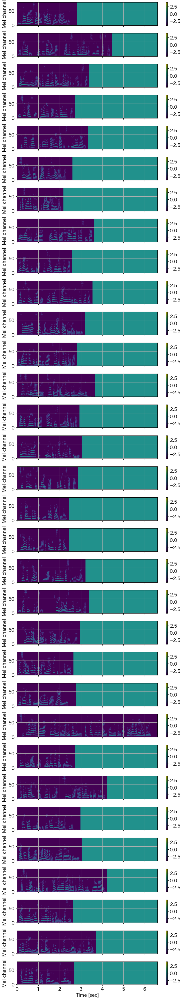

In [34]:
#学習前にミニバチデータの可視化（教師データ,out_feats)

import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from ttslearn.notebook import get_cmap, init_plot_style, savefig
cmap = get_cmap()
init_plot_style()

sr = 22050

fig, ax = plt.subplots(len(out_feats), 1, figsize=(8,40), sharex=True, sharey=True)
for n in range(len(in_feats)):
    x = out_feats[n].data.numpy()
    #hop_length = int(sr * 0.0125)
    hop_length = 256
    mesh = librosa.display.specshow(x.T, sr=sr, x_axis="time", y_axis="frames", hop_length=hop_length, cmap=cmap, ax=ax[n])
    fig.colorbar(mesh, ax=ax[n])
    mesh.set_clim(-4, 4)
    # あとで付け直すので、ここではラベルを削除します
    ax[n].set_xlabel("")
    
ax[-1].set_xlabel("Time [sec]")
for a in ax:
    a.set_ylabel("Mel channel")

plt.tight_layout()
savefig("fig/e2etts_impl_minibatch")

In [35]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = model.to( device )

In [36]:
#学習の前準備

from torch import optim

# lr は学習率を表します
optimizer = optim.Adam(model.parameters(), lr=0.0001 )


# gamma は学習率の減衰係数を表します
lr_scheduler = optim.lr_scheduler.StepLR(optimizer, gamma=0.5, step_size=500000)

In [37]:
import gc 

gc.collect()

for param in model.parameters():
    param.requires_grad = True

In [38]:
from ttslearn.notebook import get_cmap, init_plot_style, savefig

def plot_a_graph( ):

    cmap = get_cmap()
    init_plot_style()
    #fig, ax = plt.subplots(2, 1, figsize=(8,6))
    fig, ax = plt.subplots(2, 1, figsize=(8,6))
    ax[0].set_title("Mel-spectrogram of natural speech")
    ax[1].set_title("Mel-spectrogram of Transtron output")
    #ax[2].set_title("error")

    sr = 22050

    mindb = min(feats.min(), out_feats_fine.min())
    #mindb = feats.min() 
    maxdb = max(feats.max(), out_feats_fine.max())
    #maxdb = feats.max()


    #hop_length = int(sr * 0.0125)
    #hop_length = int(sr * 0.0116100)
    hop_length = 256
    # 比較用に、自然音声から抽出された音響特徴量を読み込みむ
    mesh = librosa.display.specshow(
        feats.T, sr=sr, x_axis="time", y_axis="frames", hop_length=hop_length, cmap=cmap, ax=ax[0])
    mesh.set_clim(mindb, maxdb)
    fig.colorbar(mesh, ax=ax[0])
    mesh = librosa.display.specshow(
        out_feats_fine.T, sr=sr, x_axis="time", y_axis="frames", hop_length=hop_length, cmap=cmap, ax=ax[1])
    mesh.set_clim(mindb, maxdb)
    fig.colorbar(mesh, ax=ax[1])
   
    

    for i, a in enumerate( ax ):
        if i == len( ax ) - 1:
            a.set_xlabel("Time [sec]")
        a.set_ylabel("Mel filter channel")
    fig.tight_layout()

    # 図10-8
    savefig("./fig/e2etts_impl_logmel_comp")


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:   1, train it:    147, decoder_out: 9.57123, postnet_out: 7.93887, duration: 10.52641, loss: 28.03651


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:   1, dev it:      7, decoder_out: 4.40600, postnet_out: 6.39689, duration: 8.01310, loss: 18.81599


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:   2, train it:    294, decoder_out: 3.86303, postnet_out: 3.69747, duration: 7.86373, loss: 15.42423


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:   2, dev it:     14, decoder_out: 4.14642, postnet_out: 7.90623, duration: 4.50102, loss: 16.55368


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:   3, train it:    441, decoder_out: 3.20786, postnet_out: 3.02059, duration: 4.89546, loss: 11.12392


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:   3, dev it:     21, decoder_out: 2.72978, postnet_out: 2.97116, duration: 3.40758, loss: 9.10852


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:   4, train it:    588, decoder_out: 2.42288, postnet_out: 2.40189, duration: 4.47351, loss: 9.29829


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:   4, dev it:     28, decoder_out: 2.32548, postnet_out: 2.77157, duration: 3.16291, loss: 8.25997


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:   5, train it:    735, decoder_out: 2.13707, postnet_out: 2.16138, duration: 4.18466, loss: 8.48311


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:   5, dev it:     35, decoder_out: 2.04262, postnet_out: 2.10076, duration: 2.99537, loss: 7.13876


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:   6, train it:    882, decoder_out: 1.90544, postnet_out: 1.93481, duration: 3.93592, loss: 7.77618


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:   6, dev it:     42, decoder_out: 1.97119, postnet_out: 1.92654, duration: 2.94105, loss: 6.83877


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:   7, train it:   1029, decoder_out: 1.81401, postnet_out: 1.84396, duration: 3.69867, loss: 7.35665


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:   7, dev it:     49, decoder_out: 1.92003, postnet_out: 1.87433, duration: 2.97524, loss: 6.76960


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:   8, train it:   1176, decoder_out: 1.75086, postnet_out: 1.78078, duration: 3.51581, loss: 7.04745


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:   8, dev it:     56, decoder_out: 1.78734, postnet_out: 1.78745, duration: 3.05559, loss: 6.63038


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:   9, train it:   1323, decoder_out: 1.69508, postnet_out: 1.71845, duration: 3.30218, loss: 6.71571


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:   9, dev it:     63, decoder_out: 1.73013, postnet_out: 1.73937, duration: 3.01688, loss: 6.48638


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  10, train it:   1470, decoder_out: 1.63229, postnet_out: 1.65277, duration: 3.14512, loss: 6.43018


<Figure size 600x600 with 0 Axes>

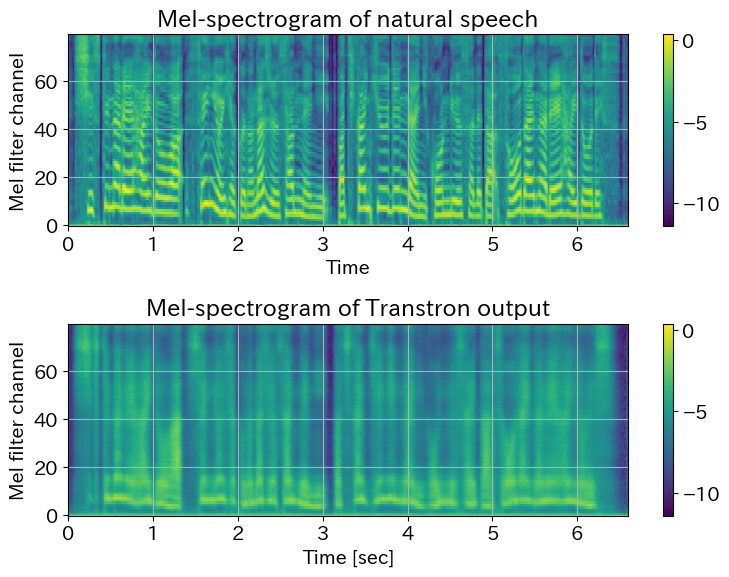

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  10, dev it:     70, decoder_out: 1.71246, postnet_out: 1.72325, duration: 3.27042, loss: 6.70613


<Figure size 600x600 with 0 Axes>

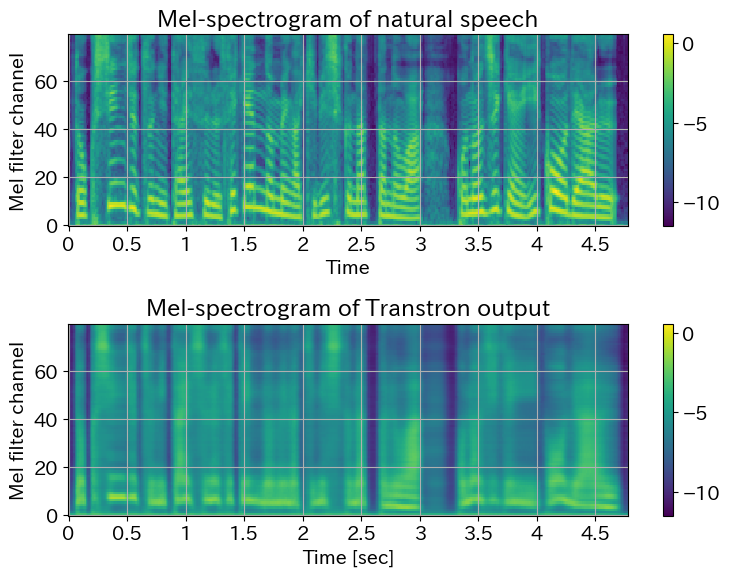

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  11, train it:   1617, decoder_out: 1.57971, postnet_out: 1.60099, duration: 3.03079, loss: 6.21149


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  11, dev it:     77, decoder_out: 1.72763, postnet_out: 1.72562, duration: 3.92245, loss: 7.37571


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  12, train it:   1764, decoder_out: 1.54485, postnet_out: 1.56505, duration: 2.83643, loss: 5.94633


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  12, dev it:     84, decoder_out: 1.71155, postnet_out: 1.73312, duration: 3.33351, loss: 6.77818


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  13, train it:   1911, decoder_out: 1.53109, postnet_out: 1.55320, duration: 2.62308, loss: 5.70738


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  13, dev it:     91, decoder_out: 1.67837, postnet_out: 1.69297, duration: 3.12720, loss: 6.49853


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  14, train it:   2058, decoder_out: 1.50706, postnet_out: 1.52905, duration: 2.54110, loss: 5.57720


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  14, dev it:     98, decoder_out: 1.65828, postnet_out: 1.65023, duration: 3.07643, loss: 6.38494


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  15, train it:   2205, decoder_out: 1.47100, postnet_out: 1.48978, duration: 2.41204, loss: 5.37282


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  15, dev it:    105, decoder_out: 1.63668, postnet_out: 1.63710, duration: 3.28183, loss: 6.55562


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  16, train it:   2352, decoder_out: 1.43229, postnet_out: 1.45013, duration: 2.27594, loss: 5.15836


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  16, dev it:    112, decoder_out: 1.68239, postnet_out: 1.69943, duration: 3.40985, loss: 6.79167


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  17, train it:   2499, decoder_out: 1.42459, postnet_out: 1.44532, duration: 2.14257, loss: 5.01248


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  17, dev it:    119, decoder_out: 1.77848, postnet_out: 1.84419, duration: 4.20364, loss: 7.82631


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  18, train it:   2646, decoder_out: 1.37645, postnet_out: 1.39346, duration: 2.02665, loss: 4.79655


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  18, dev it:    126, decoder_out: 1.78634, postnet_out: 1.79232, duration: 4.44247, loss: 8.02113


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  19, train it:   2793, decoder_out: 1.33828, postnet_out: 1.35333, duration: 1.88883, loss: 4.58043


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  19, dev it:    133, decoder_out: 1.74032, postnet_out: 1.75112, duration: 3.50930, loss: 7.00074


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  20, train it:   2940, decoder_out: 1.31448, postnet_out: 1.32832, duration: 1.72931, loss: 4.37211


<Figure size 600x600 with 0 Axes>

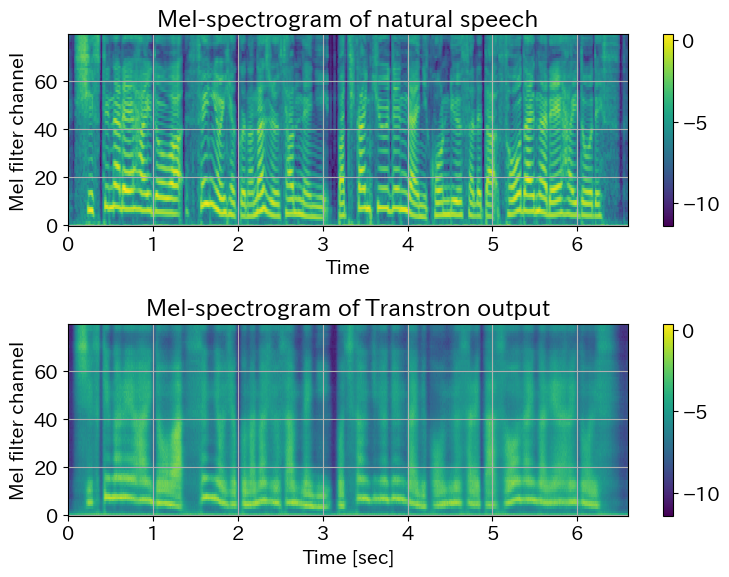

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  20, dev it:    140, decoder_out: 1.73559, postnet_out: 1.73703, duration: 3.26197, loss: 6.73459


<Figure size 600x600 with 0 Axes>

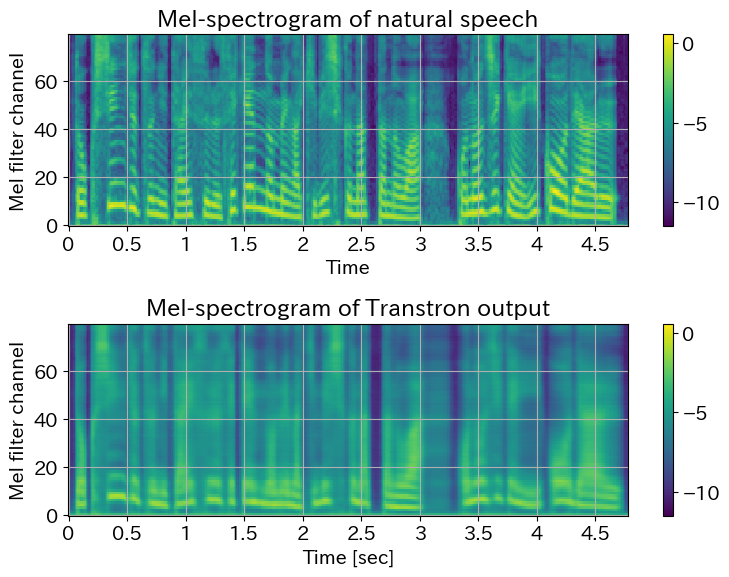

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  21, train it:   3087, decoder_out: 1.30213, postnet_out: 1.31516, duration: 1.63200, loss: 4.24929


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  21, dev it:    147, decoder_out: 1.63898, postnet_out: 1.64368, duration: 3.33651, loss: 6.61917


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  22, train it:   3234, decoder_out: 1.28598, postnet_out: 1.29977, duration: 1.53147, loss: 4.11723


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  22, dev it:    154, decoder_out: 1.71652, postnet_out: 1.81404, duration: 3.61000, loss: 7.14056


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  23, train it:   3381, decoder_out: 1.25560, postnet_out: 1.27117, duration: 1.45532, loss: 3.98210


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  23, dev it:    161, decoder_out: 1.86455, postnet_out: 1.96966, duration: 3.67739, loss: 7.51160


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  24, train it:   3528, decoder_out: 1.21709, postnet_out: 1.23240, duration: 1.36945, loss: 3.81894


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  24, dev it:    168, decoder_out: 1.79756, postnet_out: 1.79883, duration: 3.32823, loss: 6.92462


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  25, train it:   3675, decoder_out: 1.18198, postnet_out: 1.19379, duration: 1.30068, loss: 3.67645


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  25, dev it:    175, decoder_out: 1.60594, postnet_out: 1.60722, duration: 3.36266, loss: 6.57582


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  26, train it:   3822, decoder_out: 1.16190, postnet_out: 1.17372, duration: 1.23820, loss: 3.57382


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  26, dev it:    182, decoder_out: 1.64580, postnet_out: 1.65754, duration: 3.51657, loss: 6.81991


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  27, train it:   3969, decoder_out: 1.14203, postnet_out: 1.15486, duration: 1.18307, loss: 3.47996


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  27, dev it:    189, decoder_out: 1.70214, postnet_out: 2.04669, duration: 3.75807, loss: 7.50689


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  28, train it:   4116, decoder_out: 1.13972, postnet_out: 1.15321, duration: 1.13291, loss: 3.42584


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  28, dev it:    196, decoder_out: 1.80102, postnet_out: 1.88518, duration: 3.69728, loss: 7.38348


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  29, train it:   4263, decoder_out: 1.12472, postnet_out: 1.13705, duration: 1.10950, loss: 3.37127


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  29, dev it:    203, decoder_out: 1.62854, postnet_out: 1.63195, duration: 3.56171, loss: 6.82221


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  30, train it:   4410, decoder_out: 1.10184, postnet_out: 1.11297, duration: 1.06102, loss: 3.27584


<Figure size 600x600 with 0 Axes>

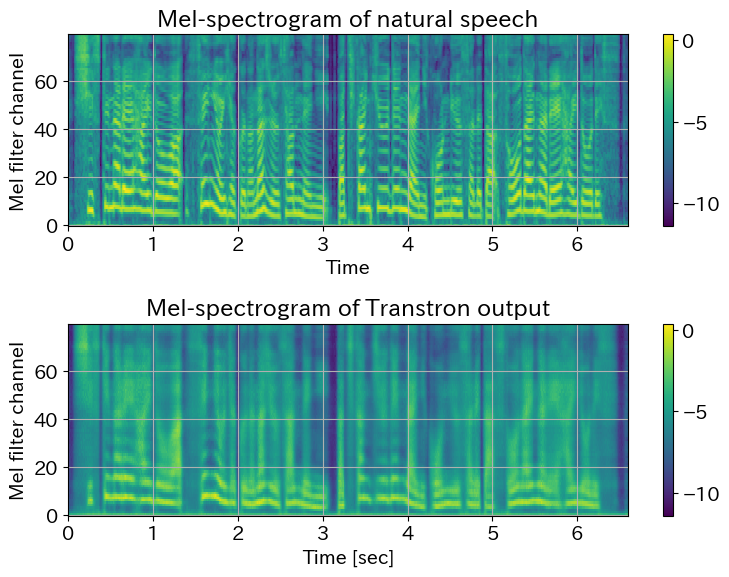

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  30, dev it:    210, decoder_out: 1.60101, postnet_out: 1.60919, duration: 3.51789, loss: 6.72809


<Figure size 600x600 with 0 Axes>

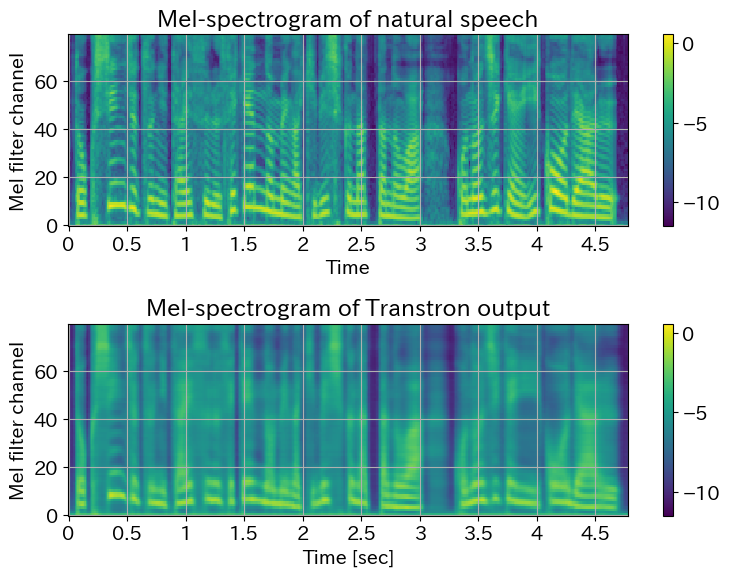

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  31, train it:   4557, decoder_out: 1.07762, postnet_out: 1.08854, duration: 1.04363, loss: 3.20979


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  31, dev it:    217, decoder_out: 1.61450, postnet_out: 1.62038, duration: 3.52856, loss: 6.76344


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  32, train it:   4704, decoder_out: 1.06345, postnet_out: 1.07507, duration: 1.02509, loss: 3.16361


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  32, dev it:    224, decoder_out: 1.62421, postnet_out: 1.62450, duration: 3.86976, loss: 7.11847


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  33, train it:   4851, decoder_out: 1.04906, postnet_out: 1.05914, duration: 1.01345, loss: 3.12165


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  33, dev it:    231, decoder_out: 1.59288, postnet_out: 1.62288, duration: 3.64644, loss: 6.86221


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  34, train it:   4998, decoder_out: 1.02310, postnet_out: 1.03147, duration: 1.03145, loss: 3.08602


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  34, dev it:    238, decoder_out: 1.60856, postnet_out: 1.61483, duration: 3.70481, loss: 6.92819


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  35, train it:   5145, decoder_out: 1.01648, postnet_out: 1.02519, duration: 1.02008, loss: 3.06175


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  35, dev it:    245, decoder_out: 1.60575, postnet_out: 1.61045, duration: 3.61868, loss: 6.83487


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  36, train it:   5292, decoder_out: 1.00778, postnet_out: 1.01630, duration: 1.02739, loss: 3.05147


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  36, dev it:    252, decoder_out: 1.66293, postnet_out: 1.66367, duration: 3.67139, loss: 6.99798


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  37, train it:   5439, decoder_out: 1.00048, postnet_out: 1.00869, duration: 1.00366, loss: 3.01283


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  37, dev it:    259, decoder_out: 1.73929, postnet_out: 1.99723, duration: 3.74495, loss: 7.48147


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  38, train it:   5586, decoder_out: 0.98344, postnet_out: 0.99218, duration: 0.95246, loss: 2.92808


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  38, dev it:    266, decoder_out: 1.68031, postnet_out: 1.71912, duration: 3.72998, loss: 7.12941


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  39, train it:   5733, decoder_out: 0.96418, postnet_out: 0.97198, duration: 0.87363, loss: 2.80979


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  39, dev it:    273, decoder_out: 1.62416, postnet_out: 1.65082, duration: 3.51826, loss: 6.79324


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  40, train it:   5880, decoder_out: 0.94920, postnet_out: 0.95749, duration: 0.83226, loss: 2.73896


<Figure size 600x600 with 0 Axes>

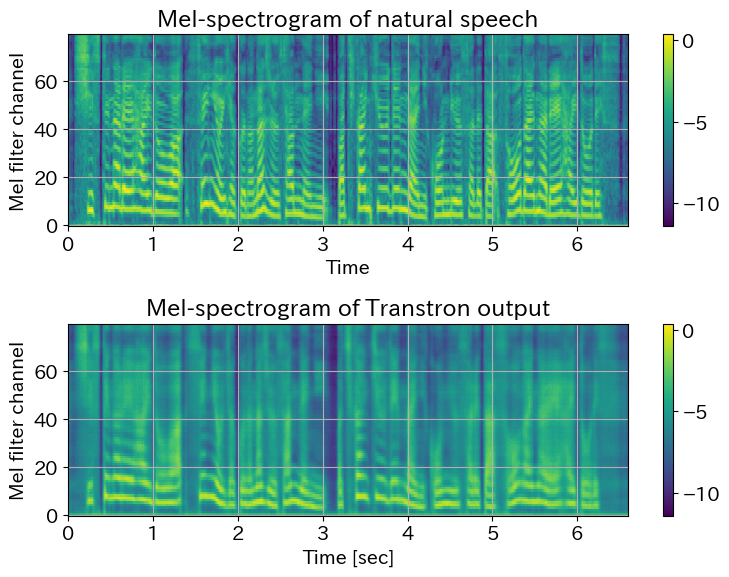

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  40, dev it:    280, decoder_out: 1.61671, postnet_out: 1.61854, duration: 3.53363, loss: 6.76888


<Figure size 600x600 with 0 Axes>

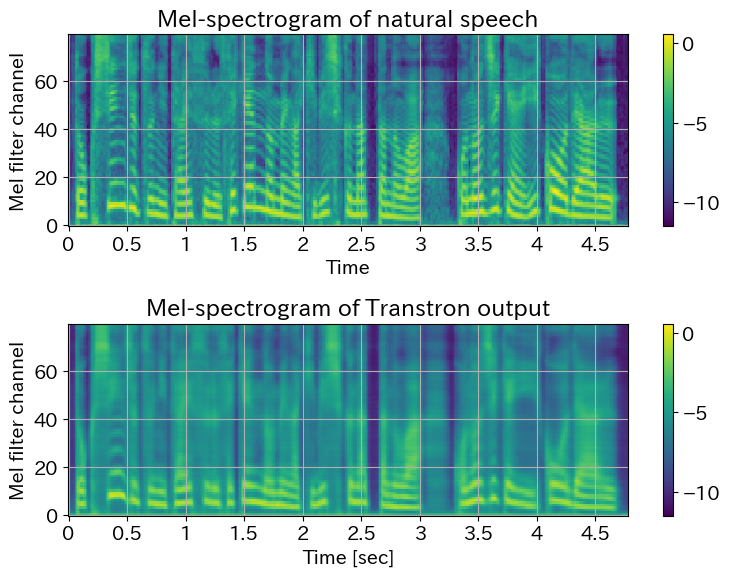

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  41, train it:   6027, decoder_out: 0.93928, postnet_out: 0.94869, duration: 0.78108, loss: 2.66905


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  41, dev it:    287, decoder_out: 1.61968, postnet_out: 1.62384, duration: 3.54307, loss: 6.78660


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  42, train it:   6174, decoder_out: 0.92919, postnet_out: 0.93927, duration: 0.74556, loss: 2.61401


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  42, dev it:    294, decoder_out: 1.63830, postnet_out: 1.64460, duration: 3.95053, loss: 7.23343


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  43, train it:   6321, decoder_out: 0.91700, postnet_out: 0.92642, duration: 0.72921, loss: 2.57262


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  43, dev it:    301, decoder_out: 1.74989, postnet_out: 1.75306, duration: 4.21075, loss: 7.71371


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  44, train it:   6468, decoder_out: 0.91822, postnet_out: 0.92654, duration: 0.71913, loss: 2.56389


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  44, dev it:    308, decoder_out: 1.79448, postnet_out: 1.83703, duration: 3.98360, loss: 7.61512


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  45, train it:   6615, decoder_out: 0.90663, postnet_out: 0.91729, duration: 0.69570, loss: 2.51961


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  45, dev it:    315, decoder_out: 1.89550, postnet_out: 1.89718, duration: 3.99272, loss: 7.78540


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  46, train it:   6762, decoder_out: 0.90517, postnet_out: 0.91983, duration: 0.68698, loss: 2.51198


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  46, dev it:    322, decoder_out: 1.76499, postnet_out: 1.75124, duration: 3.94877, loss: 7.46500


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  47, train it:   6909, decoder_out: 0.87773, postnet_out: 0.88649, duration: 0.68370, loss: 2.44792


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  47, dev it:    329, decoder_out: 1.71314, postnet_out: 1.70504, duration: 4.02309, loss: 7.44127


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  48, train it:   7056, decoder_out: 0.86368, postnet_out: 0.87213, duration: 0.68530, loss: 2.42110


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  48, dev it:    336, decoder_out: 1.72532, postnet_out: 1.74240, duration: 4.02626, loss: 7.49398


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  49, train it:   7203, decoder_out: 0.85375, postnet_out: 0.86250, duration: 0.70604, loss: 2.42229


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  49, dev it:    343, decoder_out: 1.81634, postnet_out: 1.82271, duration: 4.22414, loss: 7.86319


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  50, train it:   7350, decoder_out: 0.83423, postnet_out: 0.84147, duration: 0.74275, loss: 2.41845


<Figure size 600x600 with 0 Axes>

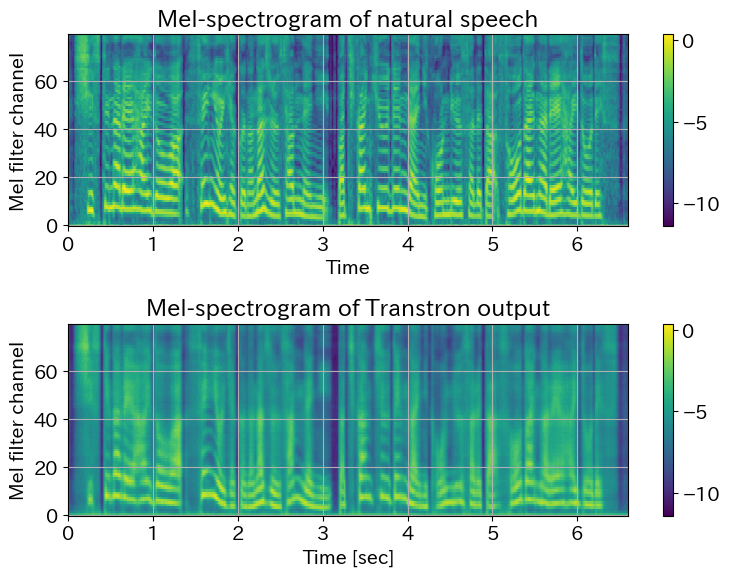

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  50, dev it:    350, decoder_out: 1.74779, postnet_out: 1.73737, duration: 3.74743, loss: 7.23260


<Figure size 600x600 with 0 Axes>

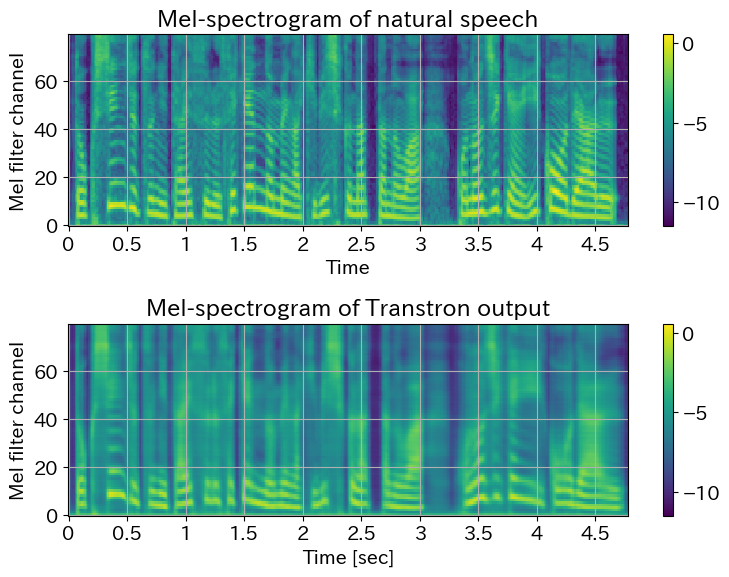

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  51, train it:   7497, decoder_out: 0.81719, postnet_out: 0.82428, duration: 0.79541, loss: 2.43688


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  51, dev it:    357, decoder_out: 1.92080, postnet_out: 1.92182, duration: 3.59741, loss: 7.44003


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  52, train it:   7644, decoder_out: 0.80776, postnet_out: 0.81393, duration: 0.82567, loss: 2.44736


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  52, dev it:    364, decoder_out: 1.89781, postnet_out: 1.90403, duration: 3.46918, loss: 7.27101


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  53, train it:   7791, decoder_out: 0.80426, postnet_out: 0.81153, duration: 0.81155, loss: 2.42734


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  53, dev it:    371, decoder_out: 1.85234, postnet_out: 1.90271, duration: 3.54235, loss: 7.29740


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  54, train it:   7938, decoder_out: 0.80382, postnet_out: 0.81217, duration: 0.75280, loss: 2.36879


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  54, dev it:    378, decoder_out: 1.69834, postnet_out: 1.70497, duration: 3.62742, loss: 7.03072


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  55, train it:   8085, decoder_out: 0.80487, postnet_out: 0.81339, duration: 0.70730, loss: 2.32556


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  55, dev it:    385, decoder_out: 1.75780, postnet_out: 1.75371, duration: 3.66380, loss: 7.17531


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  56, train it:   8232, decoder_out: 0.81086, postnet_out: 0.81872, duration: 0.65945, loss: 2.28903


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  56, dev it:    392, decoder_out: 1.72559, postnet_out: 1.82583, duration: 3.55771, loss: 7.10913


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  57, train it:   8379, decoder_out: 0.78955, postnet_out: 0.79819, duration: 0.64031, loss: 2.22806


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  57, dev it:    399, decoder_out: 1.77731, postnet_out: 1.80882, duration: 3.41477, loss: 7.00089


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  58, train it:   8526, decoder_out: 0.76782, postnet_out: 0.77457, duration: 0.61619, loss: 2.15858


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  58, dev it:    406, decoder_out: 1.73301, postnet_out: 1.74776, duration: 3.52201, loss: 7.00279


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  59, train it:   8673, decoder_out: 0.75558, postnet_out: 0.76074, duration: 0.59103, loss: 2.10736


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  59, dev it:    413, decoder_out: 1.65114, postnet_out: 1.65427, duration: 3.51808, loss: 6.82349


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  60, train it:   8820, decoder_out: 0.73487, postnet_out: 0.73950, duration: 0.59447, loss: 2.06884


<Figure size 600x600 with 0 Axes>

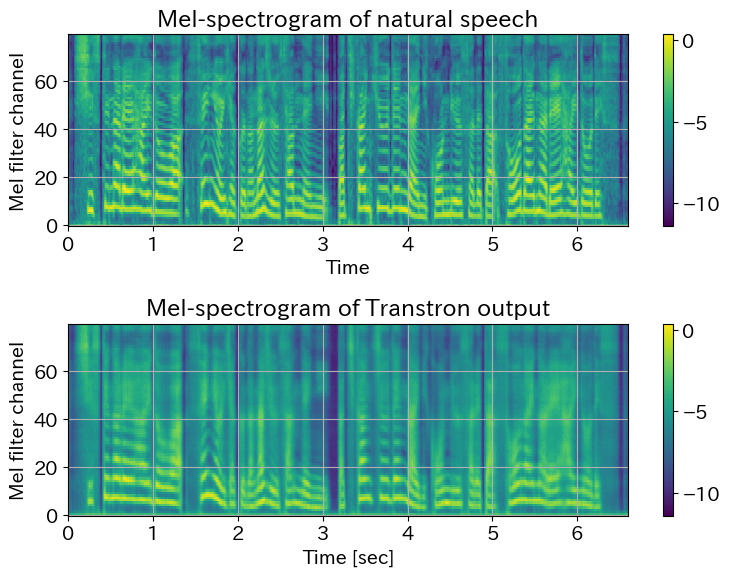

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  60, dev it:    420, decoder_out: 1.69575, postnet_out: 1.69687, duration: 3.65606, loss: 7.04868


<Figure size 600x600 with 0 Axes>

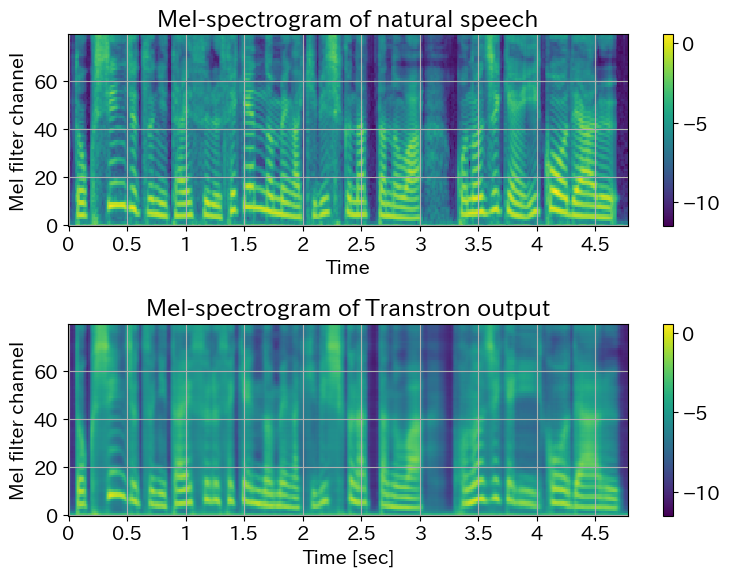

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  61, train it:   8967, decoder_out: 0.71349, postnet_out: 0.71781, duration: 0.60874, loss: 2.04004


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  61, dev it:    427, decoder_out: 1.83052, postnet_out: 1.83018, duration: 3.64889, loss: 7.30960


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  62, train it:   9114, decoder_out: 0.70884, postnet_out: 0.71291, duration: 0.64063, loss: 2.06238


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  62, dev it:    434, decoder_out: 1.98289, postnet_out: 1.98094, duration: 3.49985, loss: 7.46368


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  63, train it:   9261, decoder_out: 0.70301, postnet_out: 0.70690, duration: 0.63953, loss: 2.04944


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  63, dev it:    441, decoder_out: 1.77342, postnet_out: 1.77159, duration: 3.62497, loss: 7.16997


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  64, train it:   9408, decoder_out: 0.70268, postnet_out: 0.70674, duration: 0.62181, loss: 2.03123


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  64, dev it:    448, decoder_out: 1.70546, postnet_out: 1.70786, duration: 3.81591, loss: 7.22924


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  65, train it:   9555, decoder_out: 0.69760, postnet_out: 0.70207, duration: 0.60170, loss: 2.00137


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  65, dev it:    455, decoder_out: 1.73442, postnet_out: 1.71913, duration: 4.11175, loss: 7.56529


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  66, train it:   9702, decoder_out: 0.69564, postnet_out: 0.69985, duration: 0.57468, loss: 1.97018


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  66, dev it:    462, decoder_out: 1.74511, postnet_out: 1.73387, duration: 4.09851, loss: 7.57749


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  67, train it:   9849, decoder_out: 0.68962, postnet_out: 0.69454, duration: 0.54565, loss: 1.92981


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  67, dev it:    469, decoder_out: 1.84592, postnet_out: 1.84050, duration: 3.82237, loss: 7.50880


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  68, train it:   9996, decoder_out: 0.67502, postnet_out: 0.67943, duration: 0.53451, loss: 1.88896


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  68, dev it:    476, decoder_out: 1.75512, postnet_out: 1.75368, duration: 3.80581, loss: 7.31462


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  69, train it:  10143, decoder_out: 0.66819, postnet_out: 0.67306, duration: 0.53061, loss: 1.87186


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  69, dev it:    483, decoder_out: 1.67329, postnet_out: 1.67542, duration: 3.63549, loss: 6.98420


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  70, train it:  10290, decoder_out: 0.67004, postnet_out: 0.67500, duration: 0.52222, loss: 1.86726


<Figure size 600x600 with 0 Axes>

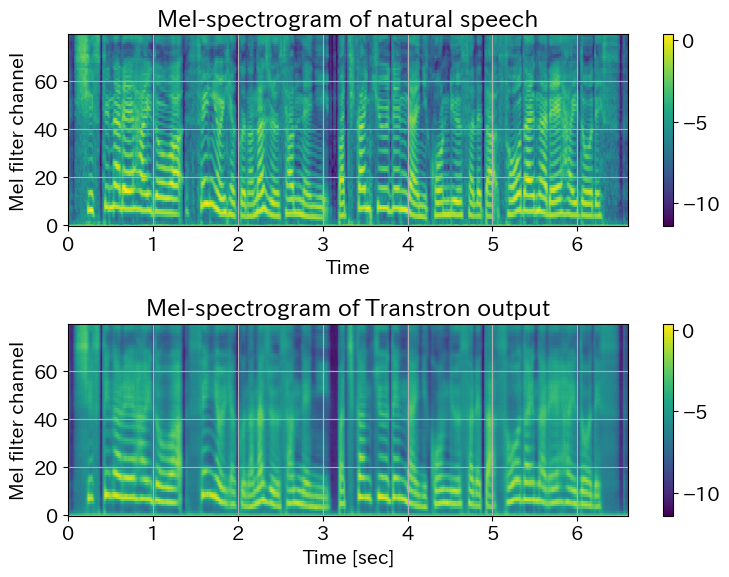

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  70, dev it:    490, decoder_out: 1.68837, postnet_out: 1.70552, duration: 3.52176, loss: 6.91565


<Figure size 600x600 with 0 Axes>

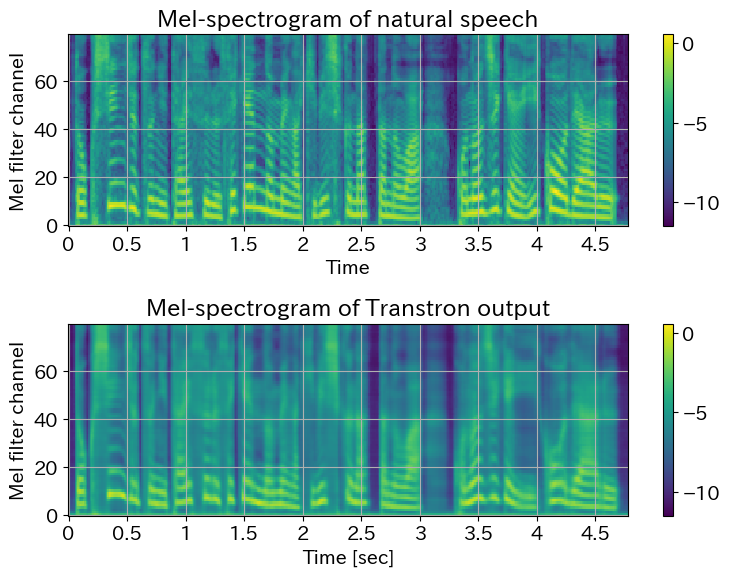

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  71, train it:  10437, decoder_out: 0.66059, postnet_out: 0.66502, duration: 0.52151, loss: 1.84712


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  71, dev it:    497, decoder_out: 1.75243, postnet_out: 1.76216, duration: 3.42503, loss: 6.93962


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  72, train it:  10584, decoder_out: 0.64572, postnet_out: 0.64973, duration: 0.51301, loss: 1.80846


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  72, dev it:    504, decoder_out: 1.79175, postnet_out: 1.79277, duration: 3.46170, loss: 7.04623


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  73, train it:  10731, decoder_out: 0.63515, postnet_out: 0.63858, duration: 0.50542, loss: 1.77916


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  73, dev it:    511, decoder_out: 1.79026, postnet_out: 1.79085, duration: 3.81952, loss: 7.40063


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  74, train it:  10878, decoder_out: 0.63091, postnet_out: 0.63437, duration: 0.49474, loss: 1.76002


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  74, dev it:    518, decoder_out: 1.74629, postnet_out: 1.75132, duration: 3.79927, loss: 7.29688


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  75, train it:  11025, decoder_out: 0.62167, postnet_out: 0.62465, duration: 0.48593, loss: 1.73225


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  75, dev it:    525, decoder_out: 1.79153, postnet_out: 1.78937, duration: 3.57249, loss: 7.15339


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  76, train it:  11172, decoder_out: 0.61654, postnet_out: 0.61931, duration: 0.51727, loss: 1.75312


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  76, dev it:    532, decoder_out: 1.84543, postnet_out: 1.84384, duration: 3.79722, loss: 7.48650


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  77, train it:  11319, decoder_out: 0.60983, postnet_out: 0.61287, duration: 0.49490, loss: 1.71760


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  77, dev it:    539, decoder_out: 1.99849, postnet_out: 2.00490, duration: 3.54977, loss: 7.55315


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  78, train it:  11466, decoder_out: 0.61366, postnet_out: 0.61679, duration: 0.51200, loss: 1.74245


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  78, dev it:    546, decoder_out: 1.94358, postnet_out: 1.93966, duration: 3.57979, loss: 7.46303


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  79, train it:  11613, decoder_out: 0.60897, postnet_out: 0.61198, duration: 0.55142, loss: 1.77237


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  79, dev it:    553, decoder_out: 1.89195, postnet_out: 1.88329, duration: 3.36335, loss: 7.13859


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  80, train it:  11760, decoder_out: 0.60353, postnet_out: 0.60619, duration: 0.58363, loss: 1.79335


<Figure size 600x600 with 0 Axes>

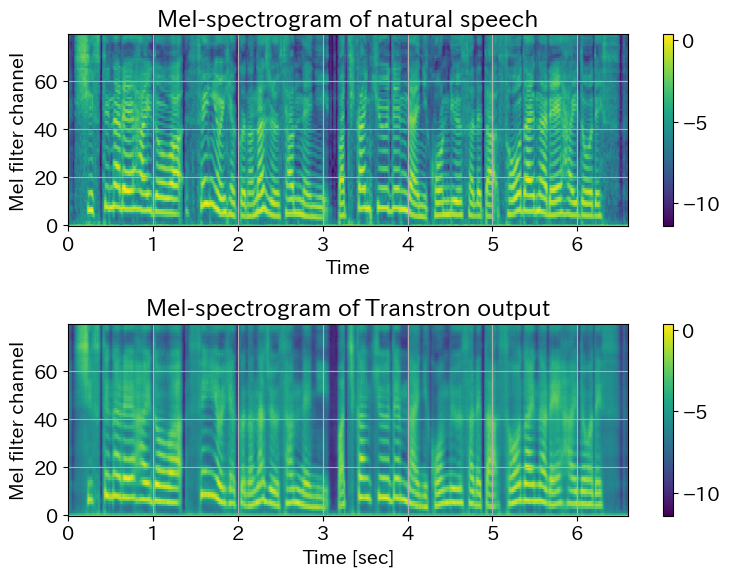

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  80, dev it:    560, decoder_out: 1.84460, postnet_out: 1.85326, duration: 3.98121, loss: 7.67907


<Figure size 600x600 with 0 Axes>

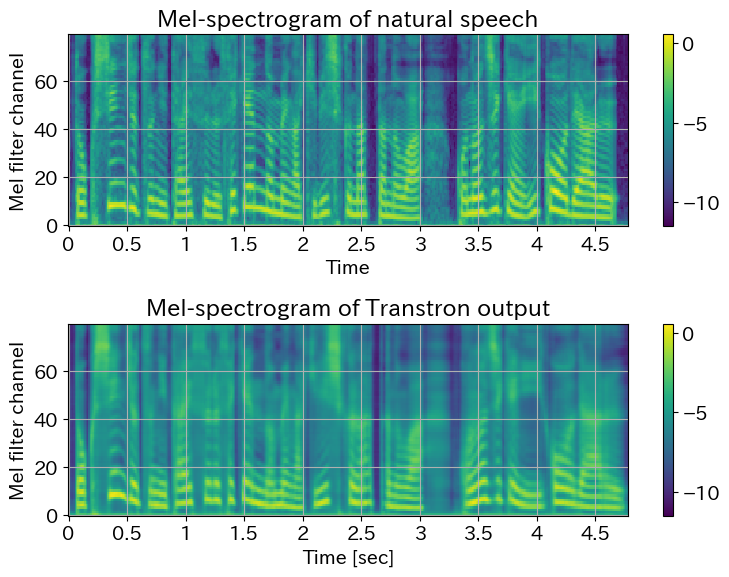

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  81, train it:  11907, decoder_out: 0.59456, postnet_out: 0.59741, duration: 0.56371, loss: 1.75568


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  81, dev it:    567, decoder_out: 1.86976, postnet_out: 1.87122, duration: 5.02025, loss: 8.76123


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  82, train it:  12054, decoder_out: 0.58133, postnet_out: 0.58374, duration: 0.50951, loss: 1.67459


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  82, dev it:    574, decoder_out: 1.81297, postnet_out: 1.81173, duration: 3.88534, loss: 7.51004


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  83, train it:  12201, decoder_out: 0.57068, postnet_out: 0.57277, duration: 0.47380, loss: 1.61725


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  83, dev it:    581, decoder_out: 1.77969, postnet_out: 1.77891, duration: 3.61801, loss: 7.17661


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  84, train it:  12348, decoder_out: 0.56166, postnet_out: 0.56424, duration: 0.44230, loss: 1.56820


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  84, dev it:    588, decoder_out: 1.70240, postnet_out: 1.70265, duration: 3.34405, loss: 6.74911


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  85, train it:  12495, decoder_out: 0.56403, postnet_out: 0.56634, duration: 0.47319, loss: 1.60357


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  85, dev it:    595, decoder_out: 1.75807, postnet_out: 1.75751, duration: 3.38073, loss: 6.89631


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  86, train it:  12642, decoder_out: 0.55499, postnet_out: 0.55708, duration: 0.45363, loss: 1.56571


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  86, dev it:    602, decoder_out: 1.78474, postnet_out: 1.78512, duration: 3.55078, loss: 7.12065


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  87, train it:  12789, decoder_out: 0.54899, postnet_out: 0.55098, duration: 0.42328, loss: 1.52324


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  87, dev it:    609, decoder_out: 1.82906, postnet_out: 1.83238, duration: 3.36441, loss: 7.02585


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  88, train it:  12936, decoder_out: 0.55117, postnet_out: 0.55272, duration: 0.42064, loss: 1.52453


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  88, dev it:    616, decoder_out: 1.77379, postnet_out: 1.77716, duration: 3.42127, loss: 6.97222


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  89, train it:  13083, decoder_out: 0.54507, postnet_out: 0.54660, duration: 0.43637, loss: 1.52804


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  89, dev it:    623, decoder_out: 1.77571, postnet_out: 1.78091, duration: 3.36349, loss: 6.92011


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  90, train it:  13230, decoder_out: 0.54414, postnet_out: 0.54557, duration: 0.46630, loss: 1.55601


<Figure size 600x600 with 0 Axes>

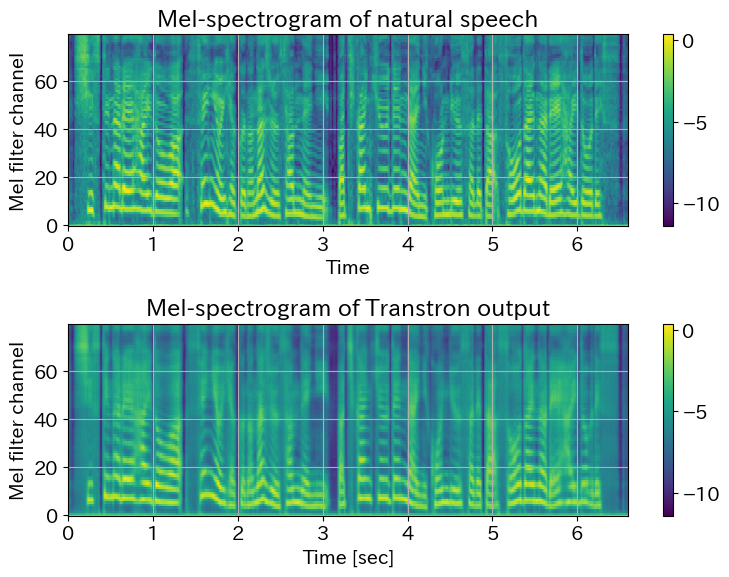

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  90, dev it:    630, decoder_out: 1.78776, postnet_out: 1.78896, duration: 3.69595, loss: 7.27266


<Figure size 600x600 with 0 Axes>

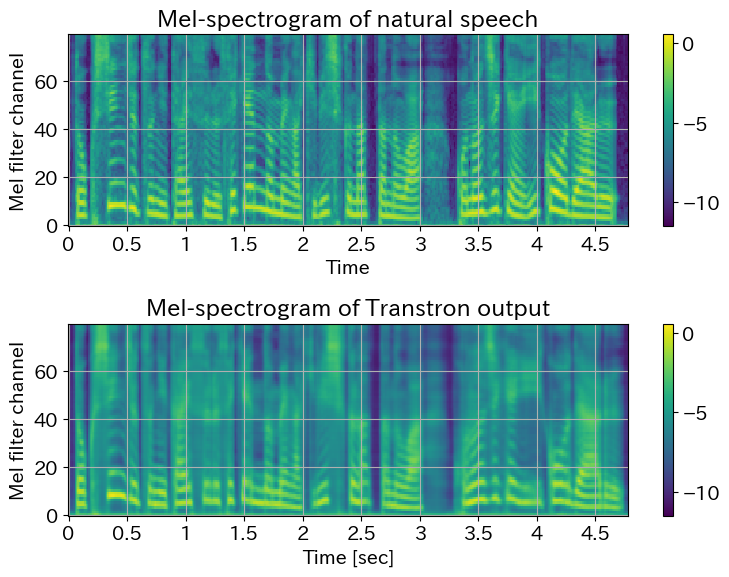

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  91, train it:  13377, decoder_out: 0.53838, postnet_out: 0.53987, duration: 0.47158, loss: 1.54983


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  91, dev it:    637, decoder_out: 1.82815, postnet_out: 1.82241, duration: 3.51936, loss: 7.16993


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  92, train it:  13524, decoder_out: 0.52807, postnet_out: 0.52994, duration: 0.45502, loss: 1.51303


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  92, dev it:    644, decoder_out: 1.98189, postnet_out: 1.98533, duration: 3.64914, loss: 7.61636


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  93, train it:  13671, decoder_out: 0.52410, postnet_out: 0.52628, duration: 0.44685, loss: 1.49723


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  93, dev it:    651, decoder_out: 1.89779, postnet_out: 1.90163, duration: 3.48058, loss: 7.27999


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  94, train it:  13818, decoder_out: 0.51775, postnet_out: 0.52016, duration: 0.44724, loss: 1.48516


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  94, dev it:    658, decoder_out: 1.88280, postnet_out: 1.87943, duration: 3.37683, loss: 7.13906


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  95, train it:  13965, decoder_out: 0.51215, postnet_out: 0.51387, duration: 0.45541, loss: 1.48143


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  95, dev it:    665, decoder_out: 1.90467, postnet_out: 1.90063, duration: 3.60904, loss: 7.41434


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  96, train it:  14112, decoder_out: 0.50871, postnet_out: 0.51024, duration: 0.46681, loss: 1.48576


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  96, dev it:    672, decoder_out: 1.79392, postnet_out: 1.79516, duration: 3.44192, loss: 7.03100


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  97, train it:  14259, decoder_out: 0.50459, postnet_out: 0.50608, duration: 0.49925, loss: 1.50992


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  97, dev it:    679, decoder_out: 1.79964, postnet_out: 1.80260, duration: 3.54231, loss: 7.14455


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  98, train it:  14406, decoder_out: 0.49427, postnet_out: 0.49618, duration: 0.50308, loss: 1.49353


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  98, dev it:    686, decoder_out: 1.80128, postnet_out: 1.79897, duration: 3.60892, loss: 7.20917


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch:  99, train it:  14553, decoder_out: 0.48510, postnet_out: 0.48638, duration: 0.50585, loss: 1.47732


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch:  99, dev it:    693, decoder_out: 1.79041, postnet_out: 1.79061, duration: 3.56040, loss: 7.14142


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 100, train it:  14700, decoder_out: 0.48576, postnet_out: 0.48704, duration: 0.49930, loss: 1.47209


<Figure size 600x600 with 0 Axes>

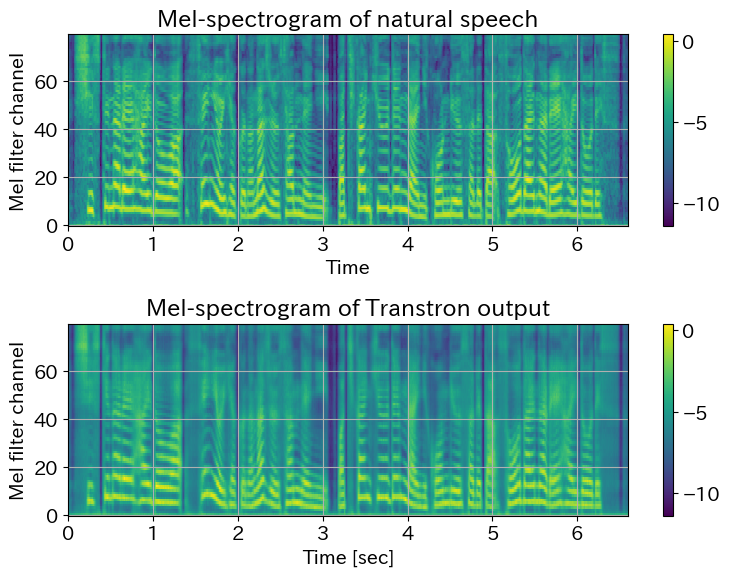

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 100, dev it:    700, decoder_out: 1.74469, postnet_out: 1.74690, duration: 3.53129, loss: 7.02288


<Figure size 600x600 with 0 Axes>

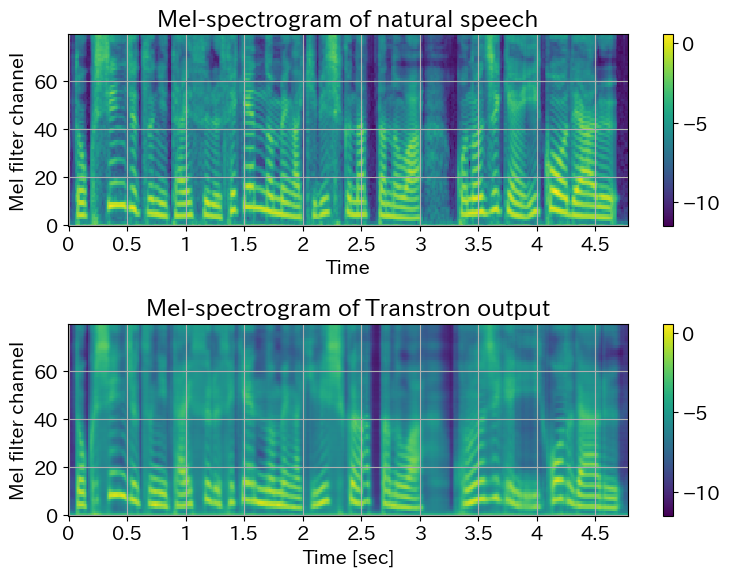

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 101, train it:  14847, decoder_out: 0.47890, postnet_out: 0.47997, duration: 0.46084, loss: 1.41971


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 101, dev it:    707, decoder_out: 1.75791, postnet_out: 1.76412, duration: 4.32320, loss: 7.84522


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 102, train it:  14994, decoder_out: 0.47352, postnet_out: 0.47465, duration: 0.47457, loss: 1.42275


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 102, dev it:    714, decoder_out: 1.81694, postnet_out: 1.81133, duration: 3.84672, loss: 7.47499


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 103, train it:  15141, decoder_out: 0.46816, postnet_out: 0.46939, duration: 0.46763, loss: 1.40519


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 103, dev it:    721, decoder_out: 1.80036, postnet_out: 1.80017, duration: 3.51667, loss: 7.11720


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 104, train it:  15288, decoder_out: 0.46688, postnet_out: 0.46817, duration: 0.44075, loss: 1.37580


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 104, dev it:    728, decoder_out: 1.82418, postnet_out: 1.82371, duration: 3.48826, loss: 7.13615


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 105, train it:  15435, decoder_out: 0.46442, postnet_out: 0.46558, duration: 0.42034, loss: 1.35033


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 105, dev it:    735, decoder_out: 1.81685, postnet_out: 1.82091, duration: 3.48264, loss: 7.12040


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 106, train it:  15582, decoder_out: 0.46044, postnet_out: 0.46152, duration: 0.39514, loss: 1.31710


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 106, dev it:    742, decoder_out: 1.72119, postnet_out: 1.72064, duration: 3.53893, loss: 6.98076


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 107, train it:  15729, decoder_out: 0.45515, postnet_out: 0.45621, duration: 0.37364, loss: 1.28500


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 107, dev it:    749, decoder_out: 1.71805, postnet_out: 1.71906, duration: 3.72962, loss: 7.16673


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 108, train it:  15876, decoder_out: 0.45460, postnet_out: 0.45564, duration: 0.37162, loss: 1.28187


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 108, dev it:    756, decoder_out: 1.77663, postnet_out: 1.77628, duration: 3.86474, loss: 7.41766


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 109, train it:  16023, decoder_out: 0.45395, postnet_out: 0.45467, duration: 0.36911, loss: 1.27773


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 109, dev it:    763, decoder_out: 1.86187, postnet_out: 1.85685, duration: 3.43729, loss: 7.15601


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 110, train it:  16170, decoder_out: 0.45098, postnet_out: 0.45197, duration: 0.35715, loss: 1.26009


<Figure size 600x600 with 0 Axes>

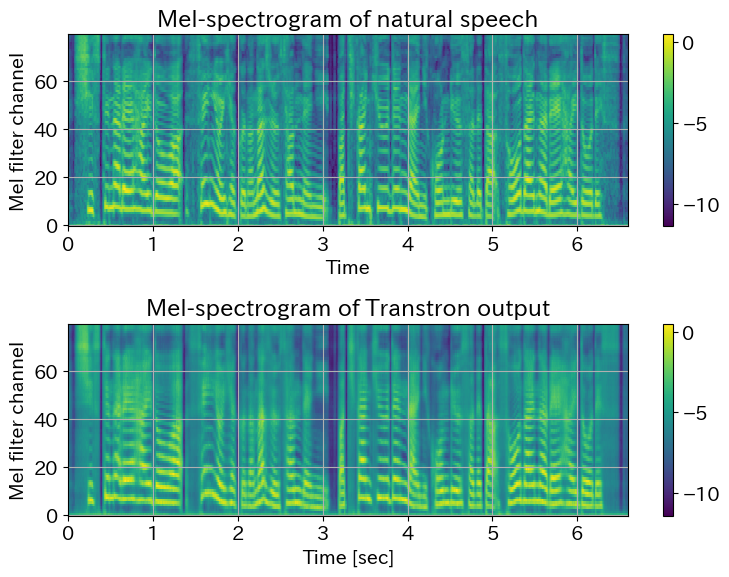

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 110, dev it:    770, decoder_out: 1.92429, postnet_out: 1.92530, duration: 3.37367, loss: 7.22326


<Figure size 600x600 with 0 Axes>

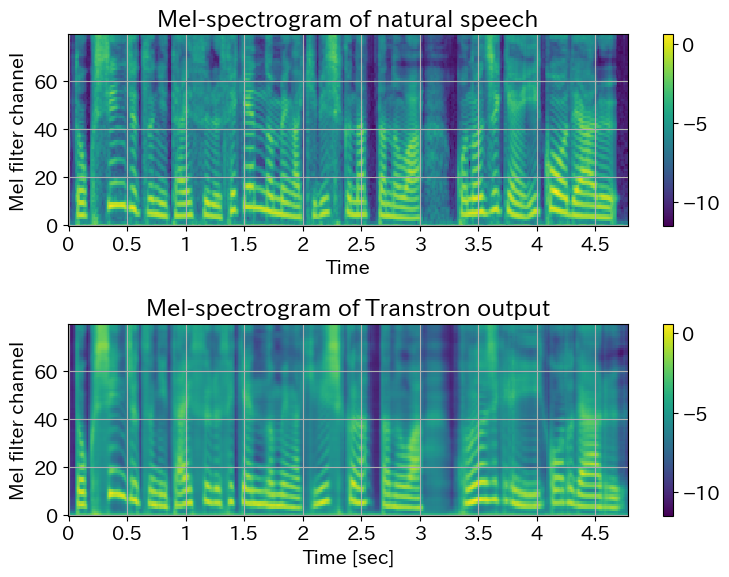

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 111, train it:  16317, decoder_out: 0.45133, postnet_out: 0.45249, duration: 0.33785, loss: 1.24167


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 111, dev it:    777, decoder_out: 1.85276, postnet_out: 1.85250, duration: 3.19031, loss: 6.89557


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 112, train it:  16464, decoder_out: 0.45120, postnet_out: 0.45209, duration: 0.32476, loss: 1.22805


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 112, dev it:    784, decoder_out: 1.75667, postnet_out: 1.75579, duration: 3.24602, loss: 6.75848


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 113, train it:  16611, decoder_out: 0.44453, postnet_out: 0.44563, duration: 0.31748, loss: 1.20764


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 113, dev it:    791, decoder_out: 1.79813, postnet_out: 1.80148, duration: 3.31560, loss: 6.91521


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 114, train it:  16758, decoder_out: 0.42988, postnet_out: 0.43047, duration: 0.30799, loss: 1.16834


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 114, dev it:    798, decoder_out: 1.77742, postnet_out: 1.78323, duration: 3.36606, loss: 6.92672


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 115, train it:  16905, decoder_out: 0.41892, postnet_out: 0.41948, duration: 0.30374, loss: 1.14215


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 115, dev it:    805, decoder_out: 1.72623, postnet_out: 1.72839, duration: 3.46024, loss: 6.91487


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 116, train it:  17052, decoder_out: 0.41359, postnet_out: 0.41413, duration: 0.30322, loss: 1.13094


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 116, dev it:    812, decoder_out: 1.75355, postnet_out: 1.75428, duration: 3.47544, loss: 6.98327


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 117, train it:  17199, decoder_out: 0.41048, postnet_out: 0.41112, duration: 0.30472, loss: 1.12631


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 117, dev it:    819, decoder_out: 1.86427, postnet_out: 1.86775, duration: 3.48950, loss: 7.22152


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 118, train it:  17346, decoder_out: 0.40636, postnet_out: 0.40726, duration: 0.30857, loss: 1.12219


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 118, dev it:    826, decoder_out: 1.92456, postnet_out: 1.92551, duration: 3.81201, loss: 7.66208


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 119, train it:  17493, decoder_out: 0.40718, postnet_out: 0.40783, duration: 0.31933, loss: 1.13434


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 119, dev it:    833, decoder_out: 1.91914, postnet_out: 1.92272, duration: 3.90925, loss: 7.75111


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 120, train it:  17640, decoder_out: 0.40816, postnet_out: 0.40873, duration: 0.33626, loss: 1.15314


<Figure size 600x600 with 0 Axes>

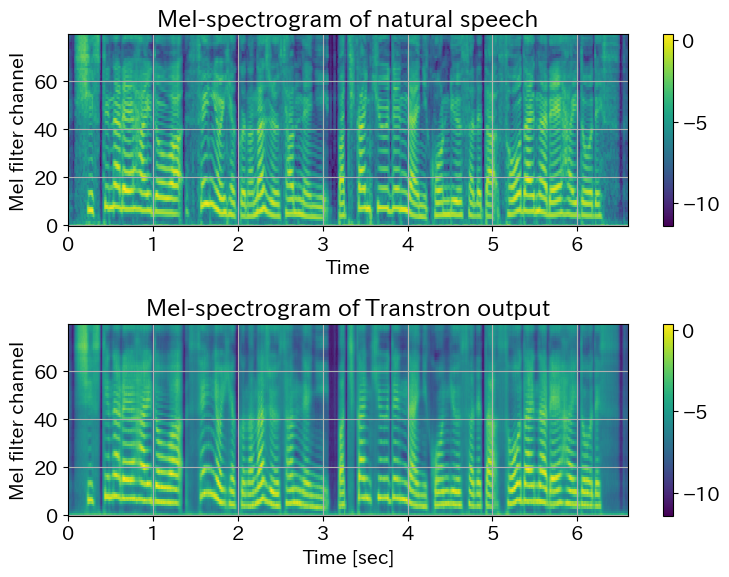

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 120, dev it:    840, decoder_out: 1.86312, postnet_out: 1.86565, duration: 3.49586, loss: 7.22463


<Figure size 600x600 with 0 Axes>

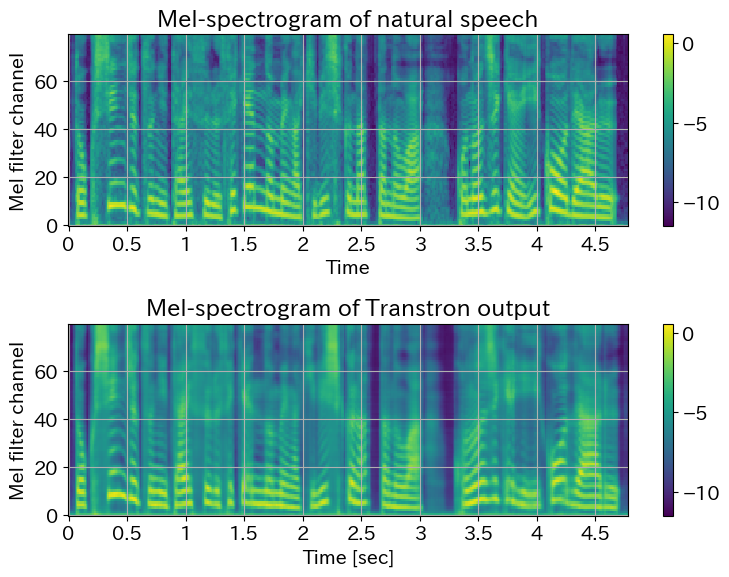

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 121, train it:  17787, decoder_out: 0.40568, postnet_out: 0.40591, duration: 0.34669, loss: 1.15828


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 121, dev it:    847, decoder_out: 1.83748, postnet_out: 1.83933, duration: 3.21086, loss: 6.88767


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 122, train it:  17934, decoder_out: 0.39951, postnet_out: 0.39974, duration: 0.37522, loss: 1.17447


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 122, dev it:    854, decoder_out: 1.80803, postnet_out: 1.81325, duration: 3.35058, loss: 6.97185


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 123, train it:  18081, decoder_out: 0.39689, postnet_out: 0.39736, duration: 0.36455, loss: 1.15880


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 123, dev it:    861, decoder_out: 1.87120, postnet_out: 1.87379, duration: 3.39487, loss: 7.13986


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 124, train it:  18228, decoder_out: 0.39457, postnet_out: 0.39497, duration: 0.32601, loss: 1.11555


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 124, dev it:    868, decoder_out: 1.82513, postnet_out: 1.82615, duration: 3.25408, loss: 6.90537


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 125, train it:  18375, decoder_out: 0.39797, postnet_out: 0.39852, duration: 0.34939, loss: 1.14588


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 125, dev it:    875, decoder_out: 1.82122, postnet_out: 1.82233, duration: 3.27172, loss: 6.91527


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 126, train it:  18522, decoder_out: 0.46613, postnet_out: 0.46629, duration: 0.64096, loss: 1.57338


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 126, dev it:    882, decoder_out: 1.86092, postnet_out: 1.86370, duration: 3.45653, loss: 7.18115


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 127, train it:  18669, decoder_out: 0.44570, postnet_out: 0.44591, duration: 0.48871, loss: 1.38032


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 127, dev it:    889, decoder_out: 1.89717, postnet_out: 1.90156, duration: 3.42839, loss: 7.22713


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 128, train it:  18816, decoder_out: 0.42245, postnet_out: 0.42278, duration: 0.41964, loss: 1.26487


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 128, dev it:    896, decoder_out: 1.86788, postnet_out: 1.86998, duration: 3.49889, loss: 7.23676


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 129, train it:  18963, decoder_out: 0.39293, postnet_out: 0.39319, duration: 0.32325, loss: 1.10936


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 129, dev it:    903, decoder_out: 1.79935, postnet_out: 1.80043, duration: 3.77597, loss: 7.37574


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 130, train it:  19110, decoder_out: 0.37232, postnet_out: 0.37261, duration: 0.28302, loss: 1.02795


<Figure size 600x600 with 0 Axes>

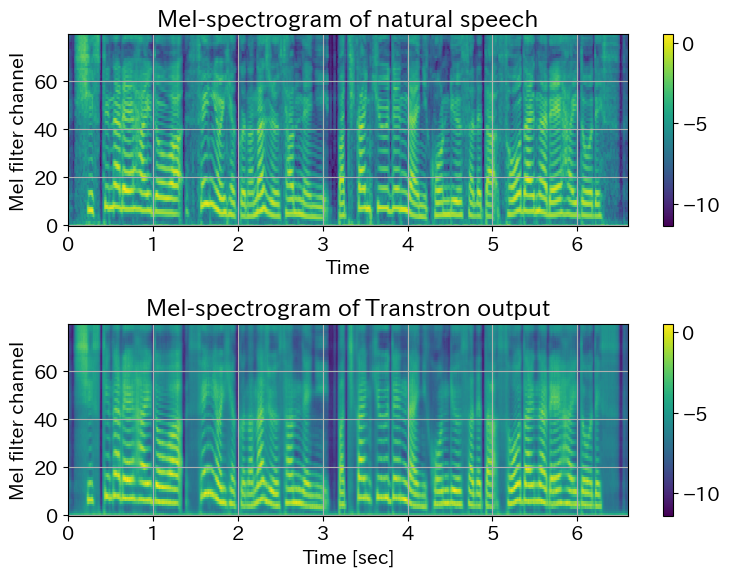

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 130, dev it:    910, decoder_out: 1.80200, postnet_out: 1.80238, duration: 3.60260, loss: 7.20697


<Figure size 600x600 with 0 Axes>

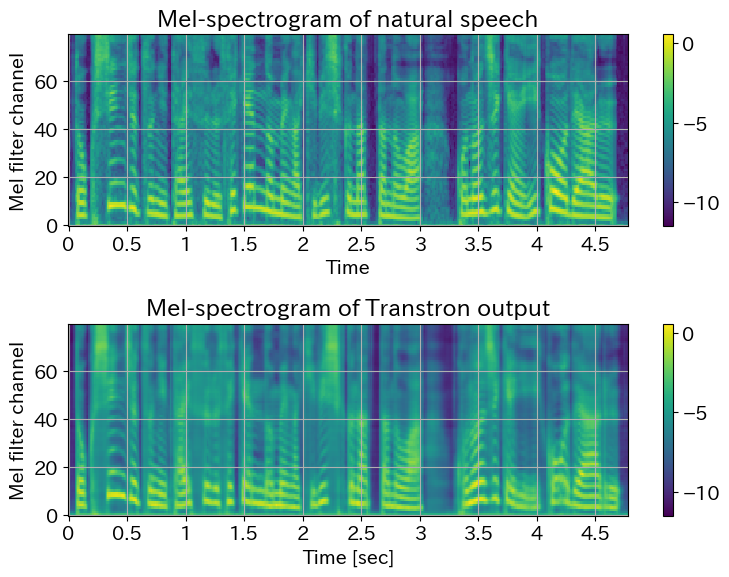

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 131, train it:  19257, decoder_out: 0.35939, postnet_out: 0.35970, duration: 0.26889, loss: 0.98798


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 131, dev it:    917, decoder_out: 1.84720, postnet_out: 1.84828, duration: 3.56663, loss: 7.26211


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 132, train it:  19404, decoder_out: 0.35127, postnet_out: 0.35153, duration: 0.25242, loss: 0.95523


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 132, dev it:    924, decoder_out: 1.90221, postnet_out: 1.90199, duration: 3.50114, loss: 7.30534


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 133, train it:  19551, decoder_out: 0.34813, postnet_out: 0.34836, duration: 0.24998, loss: 0.94648


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 133, dev it:    931, decoder_out: 1.90196, postnet_out: 1.90261, duration: 3.57192, loss: 7.37648


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 134, train it:  19698, decoder_out: 0.34877, postnet_out: 0.34896, duration: 0.25166, loss: 0.94939


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 134, dev it:    938, decoder_out: 1.87264, postnet_out: 1.87420, duration: 3.44678, loss: 7.19362


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 135, train it:  19845, decoder_out: 0.34856, postnet_out: 0.34882, duration: 0.24986, loss: 0.94723


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 135, dev it:    945, decoder_out: 1.85121, postnet_out: 1.85237, duration: 3.50023, loss: 7.20381


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 136, train it:  19992, decoder_out: 0.34985, postnet_out: 0.35006, duration: 0.25260, loss: 0.95251


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 136, dev it:    952, decoder_out: 1.81691, postnet_out: 1.81704, duration: 3.69523, loss: 7.32918


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 137, train it:  20139, decoder_out: 0.35109, postnet_out: 0.35118, duration: 0.26696, loss: 0.96923


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 137, dev it:    959, decoder_out: 1.80873, postnet_out: 1.80957, duration: 4.01465, loss: 7.63295


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 138, train it:  20286, decoder_out: 0.35525, postnet_out: 0.35558, duration: 0.31089, loss: 1.02172


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 138, dev it:    966, decoder_out: 1.82988, postnet_out: 1.82994, duration: 3.58560, loss: 7.24542


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 139, train it:  20433, decoder_out: 0.36263, postnet_out: 0.36294, duration: 0.33877, loss: 1.06434


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 139, dev it:    973, decoder_out: 1.80607, postnet_out: 1.80705, duration: 3.52916, loss: 7.14229


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 140, train it:  20580, decoder_out: 0.36128, postnet_out: 0.36125, duration: 0.29994, loss: 1.02247


<Figure size 600x600 with 0 Axes>

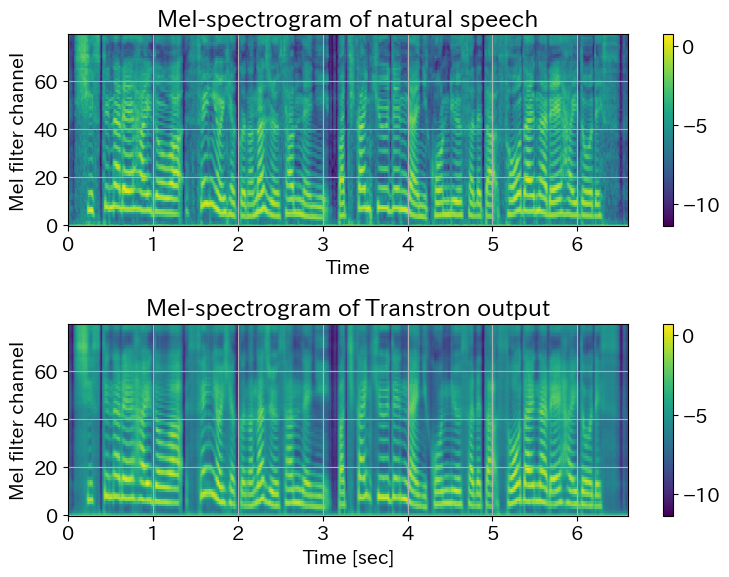

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 140, dev it:    980, decoder_out: 1.81495, postnet_out: 1.81574, duration: 3.42900, loss: 7.05970


<Figure size 600x600 with 0 Axes>

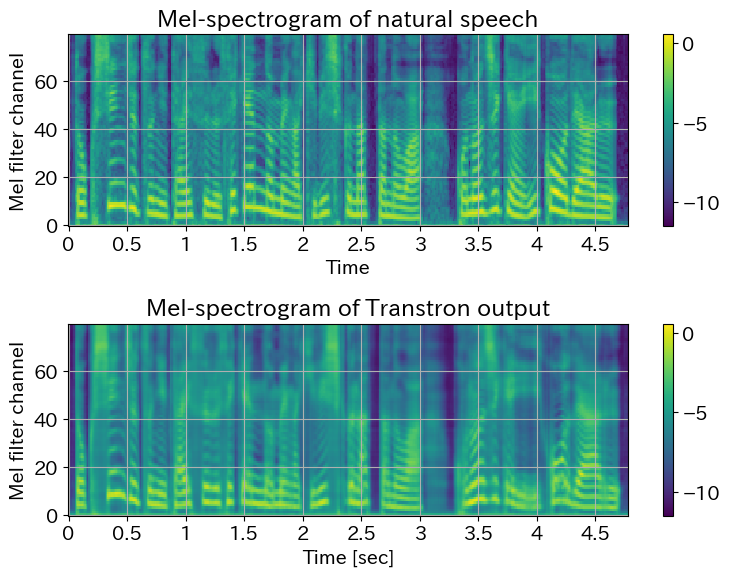

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 141, train it:  20727, decoder_out: 0.35349, postnet_out: 0.35402, duration: 0.29525, loss: 1.00276


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 141, dev it:    987, decoder_out: 1.92990, postnet_out: 1.93451, duration: 3.39126, loss: 7.25567


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 142, train it:  20874, decoder_out: 0.34921, postnet_out: 0.34946, duration: 0.28393, loss: 0.98260


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 142, dev it:    994, decoder_out: 1.87647, postnet_out: 1.87608, duration: 3.38986, loss: 7.14242


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 143, train it:  21021, decoder_out: 0.34245, postnet_out: 0.34259, duration: 0.26651, loss: 0.95155


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 143, dev it:   1001, decoder_out: 1.85731, postnet_out: 1.85748, duration: 3.24058, loss: 6.95538


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 144, train it:  21168, decoder_out: 0.33806, postnet_out: 0.33820, duration: 0.26191, loss: 0.93817


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 144, dev it:   1008, decoder_out: 1.91284, postnet_out: 1.91041, duration: 3.25612, loss: 7.07937


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 145, train it:  21315, decoder_out: 0.33575, postnet_out: 0.33596, duration: 0.25566, loss: 0.92737


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 145, dev it:   1015, decoder_out: 1.88535, postnet_out: 1.88767, duration: 3.24436, loss: 7.01738


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 146, train it:  21462, decoder_out: 0.33692, postnet_out: 0.33705, duration: 0.25492, loss: 0.92889


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 146, dev it:   1022, decoder_out: 1.82556, postnet_out: 1.82588, duration: 3.22200, loss: 6.87343


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 147, train it:  21609, decoder_out: 0.33965, postnet_out: 0.33996, duration: 0.27507, loss: 0.95467


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 147, dev it:   1029, decoder_out: 1.81012, postnet_out: 1.81120, duration: 3.24402, loss: 6.86535


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 148, train it:  21756, decoder_out: 0.33989, postnet_out: 0.33991, duration: 0.31440, loss: 0.99420


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 148, dev it:   1036, decoder_out: 1.85163, postnet_out: 1.85334, duration: 3.27201, loss: 6.97698


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 149, train it:  21903, decoder_out: 0.34078, postnet_out: 0.34083, duration: 0.32551, loss: 1.00711


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 149, dev it:   1043, decoder_out: 1.84138, postnet_out: 1.84173, duration: 3.39977, loss: 7.08287


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 150, train it:  22050, decoder_out: 0.33783, postnet_out: 0.33783, duration: 0.31990, loss: 0.99556


<Figure size 600x600 with 0 Axes>

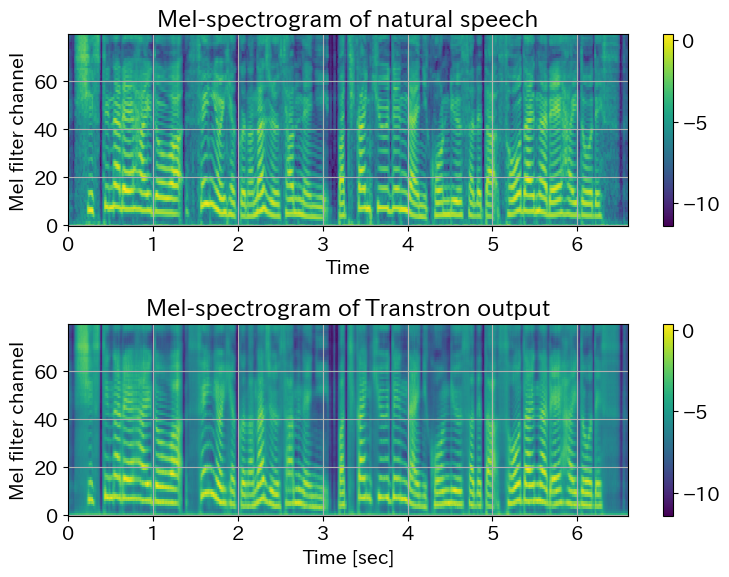

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 150, dev it:   1050, decoder_out: 1.82938, postnet_out: 1.82945, duration: 3.39820, loss: 7.05704


<Figure size 600x600 with 0 Axes>

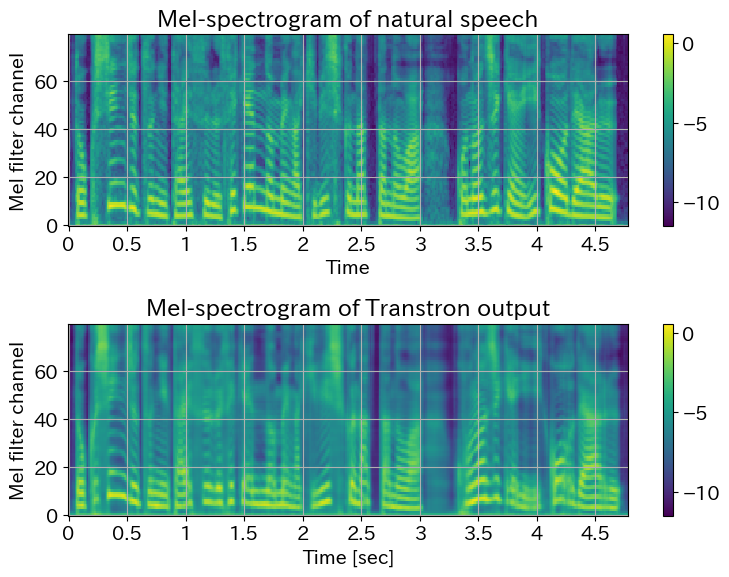

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 151, train it:  22197, decoder_out: 0.33395, postnet_out: 0.33402, duration: 0.31148, loss: 0.97945


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 151, dev it:   1057, decoder_out: 1.84004, postnet_out: 1.84017, duration: 3.85798, loss: 7.53819


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 152, train it:  22344, decoder_out: 0.33589, postnet_out: 0.33608, duration: 0.30769, loss: 0.97966


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 152, dev it:   1064, decoder_out: 1.85222, postnet_out: 1.85334, duration: 3.88522, loss: 7.59078


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 153, train it:  22491, decoder_out: 0.33771, postnet_out: 0.33778, duration: 0.31891, loss: 0.99441


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 153, dev it:   1071, decoder_out: 1.82288, postnet_out: 1.82499, duration: 3.49756, loss: 7.14543


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 154, train it:  22638, decoder_out: 0.33178, postnet_out: 0.33180, duration: 0.29540, loss: 0.95897


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 154, dev it:   1078, decoder_out: 1.80562, postnet_out: 1.80591, duration: 3.86651, loss: 7.47805


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 155, train it:  22785, decoder_out: 0.32289, postnet_out: 0.32292, duration: 0.29935, loss: 0.94516


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 155, dev it:   1085, decoder_out: 1.88664, postnet_out: 1.88753, duration: 3.82909, loss: 7.60326


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 156, train it:  22932, decoder_out: 0.31793, postnet_out: 0.31814, duration: 0.30929, loss: 0.94536


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 156, dev it:   1092, decoder_out: 1.87911, postnet_out: 1.87923, duration: 3.39211, loss: 7.15045


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 157, train it:  23079, decoder_out: 0.32172, postnet_out: 0.32187, duration: 0.36696, loss: 1.01055


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 157, dev it:   1099, decoder_out: 1.79523, postnet_out: 1.79501, duration: 3.25036, loss: 6.84060


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 158, train it:  23226, decoder_out: 0.31810, postnet_out: 0.31802, duration: 0.37407, loss: 1.01019


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 158, dev it:   1106, decoder_out: 1.76644, postnet_out: 1.76667, duration: 3.26954, loss: 6.80265


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 159, train it:  23373, decoder_out: 0.31236, postnet_out: 0.31234, duration: 0.36766, loss: 0.99237


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 159, dev it:   1113, decoder_out: 1.77230, postnet_out: 1.77239, duration: 3.33071, loss: 6.87540


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 160, train it:  23520, decoder_out: 0.30544, postnet_out: 0.30540, duration: 0.32455, loss: 0.93540


<Figure size 600x600 with 0 Axes>

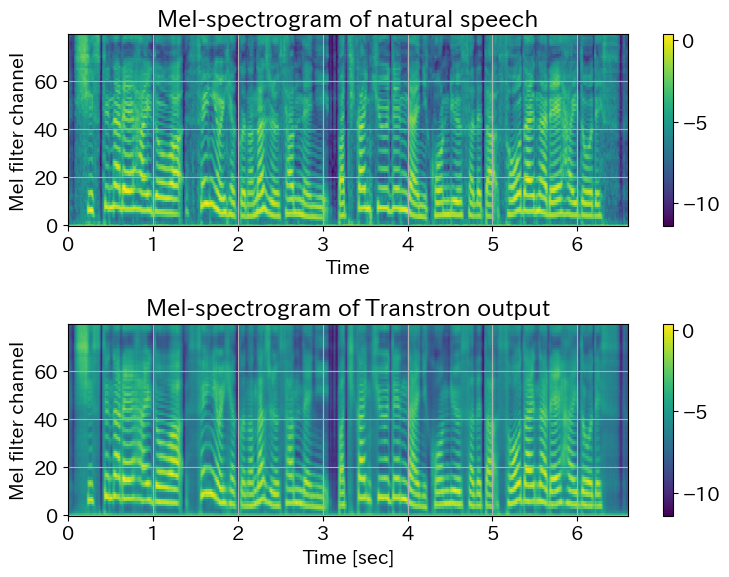

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 160, dev it:   1120, decoder_out: 1.77672, postnet_out: 1.77672, duration: 3.34546, loss: 6.89890


<Figure size 600x600 with 0 Axes>

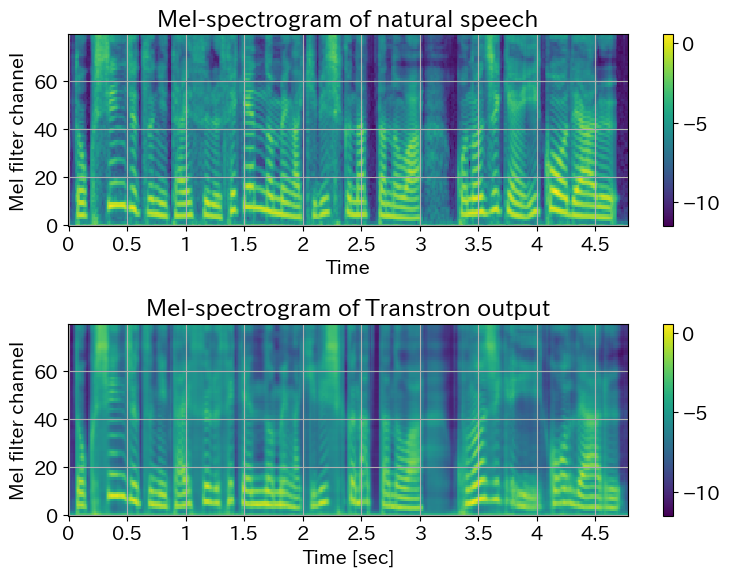

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 161, train it:  23667, decoder_out: 0.30279, postnet_out: 0.30288, duration: 0.26943, loss: 0.87510


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 161, dev it:   1127, decoder_out: 1.82501, postnet_out: 1.82502, duration: 3.38814, loss: 7.03817


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 162, train it:  23814, decoder_out: 0.30540, postnet_out: 0.30565, duration: 0.24375, loss: 0.85481


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 162, dev it:   1134, decoder_out: 1.89949, postnet_out: 1.89863, duration: 3.22518, loss: 7.02329


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 163, train it:  23961, decoder_out: 0.30837, postnet_out: 0.30871, duration: 0.24357, loss: 0.86065


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 163, dev it:   1141, decoder_out: 1.89231, postnet_out: 1.89230, duration: 3.28440, loss: 7.06901


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 164, train it:  24108, decoder_out: 0.31163, postnet_out: 0.31173, duration: 0.25048, loss: 0.87384


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 164, dev it:   1148, decoder_out: 1.88521, postnet_out: 1.88527, duration: 3.47512, loss: 7.24560


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 165, train it:  24255, decoder_out: 0.30979, postnet_out: 0.30970, duration: 0.24450, loss: 0.86400


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 165, dev it:   1155, decoder_out: 1.90765, postnet_out: 1.90499, duration: 3.61064, loss: 7.42328


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 166, train it:  24402, decoder_out: 0.30381, postnet_out: 0.30380, duration: 0.25037, loss: 0.85798


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 166, dev it:   1162, decoder_out: 1.85561, postnet_out: 1.85761, duration: 3.45806, loss: 7.17128


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 167, train it:  24549, decoder_out: 0.29970, postnet_out: 0.29971, duration: 0.25683, loss: 0.85624


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 167, dev it:   1169, decoder_out: 1.87648, postnet_out: 1.87658, duration: 3.29137, loss: 7.04442


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 168, train it:  24696, decoder_out: 0.30302, postnet_out: 0.30311, duration: 0.28029, loss: 0.88642


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 168, dev it:   1176, decoder_out: 1.85122, postnet_out: 1.85101, duration: 3.21926, loss: 6.92149


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 169, train it:  24843, decoder_out: 0.30570, postnet_out: 0.30569, duration: 0.31352, loss: 0.92490


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 169, dev it:   1183, decoder_out: 1.82516, postnet_out: 1.82534, duration: 3.27636, loss: 6.92686


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 170, train it:  24990, decoder_out: 0.30098, postnet_out: 0.30108, duration: 0.28363, loss: 0.88569


<Figure size 600x600 with 0 Axes>

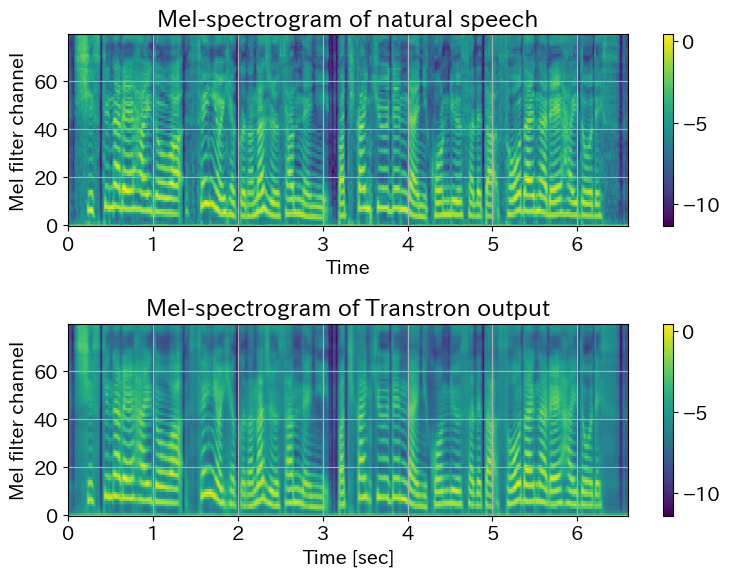

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 170, dev it:   1190, decoder_out: 1.79667, postnet_out: 1.79701, duration: 3.26369, loss: 6.85737


<Figure size 600x600 with 0 Axes>

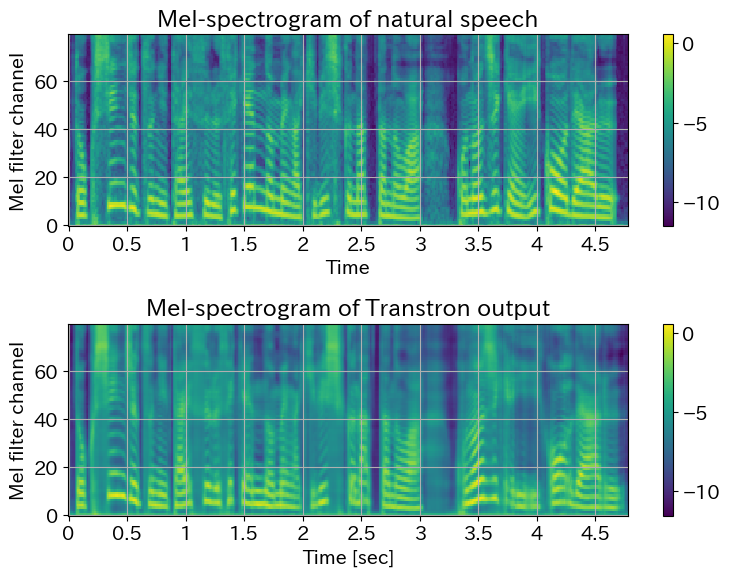

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 171, train it:  25137, decoder_out: 0.29877, postnet_out: 0.29879, duration: 0.26077, loss: 0.85833


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 171, dev it:   1197, decoder_out: 1.82537, postnet_out: 1.82582, duration: 3.17828, loss: 6.82947


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 172, train it:  25284, decoder_out: 0.29875, postnet_out: 0.29881, duration: 0.25022, loss: 0.84778


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 172, dev it:   1204, decoder_out: 1.83912, postnet_out: 1.83935, duration: 3.24537, loss: 6.92384


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 173, train it:  25431, decoder_out: 0.29930, postnet_out: 0.29939, duration: 0.24430, loss: 0.84299


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 173, dev it:   1211, decoder_out: 1.93283, postnet_out: 1.93421, duration: 3.46567, loss: 7.33271


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 174, train it:  25578, decoder_out: 0.29869, postnet_out: 0.29871, duration: 0.24007, loss: 0.83747


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 174, dev it:   1218, decoder_out: 1.91650, postnet_out: 1.91864, duration: 3.34831, loss: 7.18345


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 175, train it:  25725, decoder_out: 0.29719, postnet_out: 0.29707, duration: 0.23482, loss: 0.82909


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 175, dev it:   1225, decoder_out: 1.86038, postnet_out: 1.86269, duration: 3.18351, loss: 6.90658


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 176, train it:  25872, decoder_out: 0.29607, postnet_out: 0.29608, duration: 0.23946, loss: 0.83162


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 176, dev it:   1232, decoder_out: 1.82135, postnet_out: 1.82187, duration: 3.20246, loss: 6.84568


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 177, train it:  26019, decoder_out: 0.29282, postnet_out: 0.29276, duration: 0.25051, loss: 0.83609


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 177, dev it:   1239, decoder_out: 1.80090, postnet_out: 1.80137, duration: 3.36668, loss: 6.96895


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 178, train it:  26166, decoder_out: 0.29080, postnet_out: 0.29072, duration: 0.27267, loss: 0.85420


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 178, dev it:   1246, decoder_out: 1.81049, postnet_out: 1.81135, duration: 3.22990, loss: 6.85174


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 179, train it:  26313, decoder_out: 0.28988, postnet_out: 0.28981, duration: 0.28554, loss: 0.86523


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 179, dev it:   1253, decoder_out: 1.80736, postnet_out: 1.80797, duration: 3.15250, loss: 6.76783


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 180, train it:  26460, decoder_out: 0.28704, postnet_out: 0.28691, duration: 0.28118, loss: 0.85513


<Figure size 600x600 with 0 Axes>

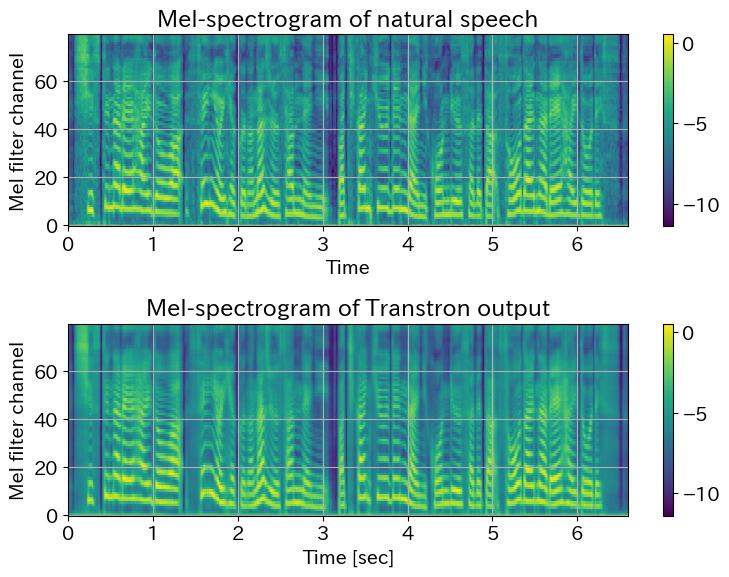

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 180, dev it:   1260, decoder_out: 1.85341, postnet_out: 1.85383, duration: 3.55895, loss: 7.26620


<Figure size 600x600 with 0 Axes>

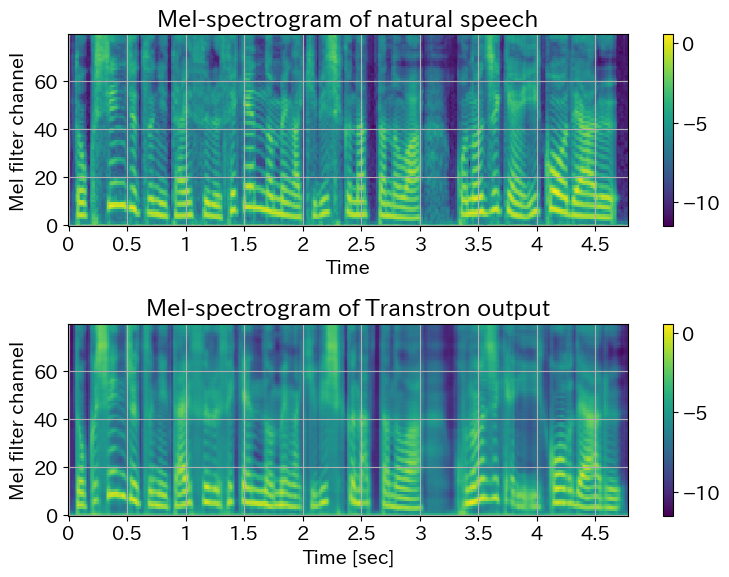

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 181, train it:  26607, decoder_out: 0.28607, postnet_out: 0.28585, duration: 0.27467, loss: 0.84659


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 181, dev it:   1267, decoder_out: 1.88424, postnet_out: 1.88508, duration: 3.48043, loss: 7.24976


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 182, train it:  26754, decoder_out: 0.28288, postnet_out: 0.28263, duration: 0.26183, loss: 0.82735


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 182, dev it:   1274, decoder_out: 1.92289, postnet_out: 1.92326, duration: 3.32114, loss: 7.16729


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 183, train it:  26901, decoder_out: 0.28037, postnet_out: 0.28025, duration: 0.24709, loss: 0.80771


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 183, dev it:   1281, decoder_out: 1.88064, postnet_out: 1.88072, duration: 3.28845, loss: 7.04981


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 184, train it:  27048, decoder_out: 0.27968, postnet_out: 0.27974, duration: 0.23885, loss: 0.79827


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 184, dev it:   1288, decoder_out: 1.86418, postnet_out: 1.86411, duration: 3.37192, loss: 7.10020


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 185, train it:  27195, decoder_out: 0.28094, postnet_out: 0.28083, duration: 0.22555, loss: 0.78732


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 185, dev it:   1295, decoder_out: 1.83521, postnet_out: 1.83411, duration: 3.33776, loss: 7.00708


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 186, train it:  27342, decoder_out: 0.27978, postnet_out: 0.27981, duration: 0.23012, loss: 0.78971


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 186, dev it:   1302, decoder_out: 1.83235, postnet_out: 1.83299, duration: 3.57762, loss: 7.24296


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 187, train it:  27489, decoder_out: 0.27875, postnet_out: 0.27864, duration: 0.23958, loss: 0.79697


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 187, dev it:   1309, decoder_out: 1.83155, postnet_out: 1.83191, duration: 3.45902, loss: 7.12248


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 188, train it:  27636, decoder_out: 0.27629, postnet_out: 0.27622, duration: 0.24409, loss: 0.79660


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 188, dev it:   1316, decoder_out: 1.86514, postnet_out: 1.86558, duration: 3.32132, loss: 7.05204


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 189, train it:  27783, decoder_out: 0.27398, postnet_out: 0.27401, duration: 0.25251, loss: 0.80051


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 189, dev it:   1323, decoder_out: 1.83363, postnet_out: 1.83412, duration: 3.51752, loss: 7.18527


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 190, train it:  27930, decoder_out: 0.27118, postnet_out: 0.27120, duration: 0.25816, loss: 0.80053


<Figure size 600x600 with 0 Axes>

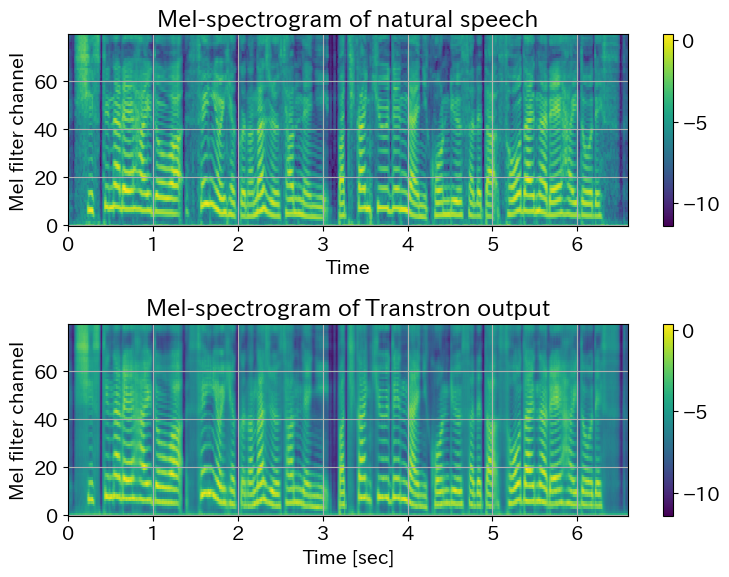

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 190, dev it:   1330, decoder_out: 1.82620, postnet_out: 1.82561, duration: 3.51812, loss: 7.16993


<Figure size 600x600 with 0 Axes>

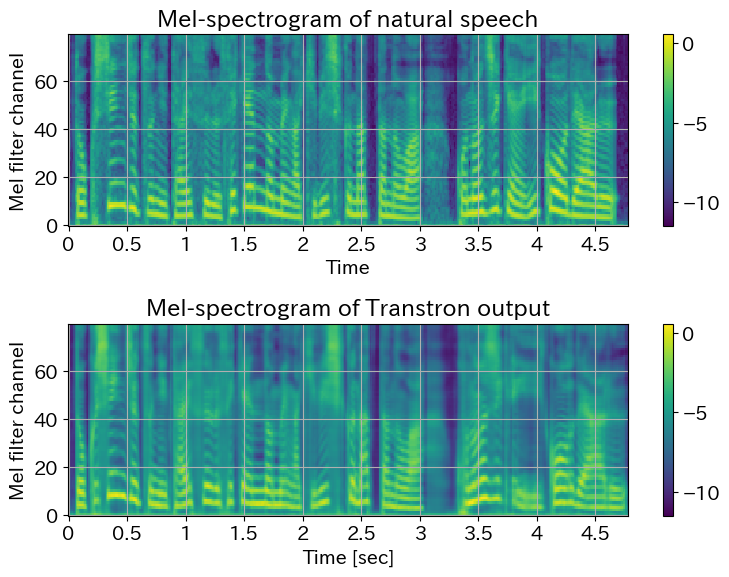

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 191, train it:  28077, decoder_out: 0.26712, postnet_out: 0.26701, duration: 0.24082, loss: 0.77495


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 191, dev it:   1337, decoder_out: 1.91825, postnet_out: 1.91538, duration: 3.32310, loss: 7.15673


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 192, train it:  28224, decoder_out: 0.26600, postnet_out: 0.26599, duration: 0.25873, loss: 0.79073


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 192, dev it:   1344, decoder_out: 1.91118, postnet_out: 1.91041, duration: 3.23655, loss: 7.05815


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 193, train it:  28371, decoder_out: 0.26992, postnet_out: 0.26994, duration: 0.29195, loss: 0.83181


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 193, dev it:   1351, decoder_out: 1.84777, postnet_out: 1.84906, duration: 3.27941, loss: 6.97624


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 194, train it:  28518, decoder_out: 0.26785, postnet_out: 0.26765, duration: 0.29087, loss: 0.82637


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 194, dev it:   1358, decoder_out: 1.82740, postnet_out: 1.83283, duration: 3.24884, loss: 6.90908


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 195, train it:  28665, decoder_out: 0.26700, postnet_out: 0.26687, duration: 0.29731, loss: 0.83118


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 195, dev it:   1365, decoder_out: 1.81412, postnet_out: 1.81482, duration: 3.34283, loss: 6.97178


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 196, train it:  28812, decoder_out: 0.26491, postnet_out: 0.26499, duration: 0.28765, loss: 0.81754


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 196, dev it:   1372, decoder_out: 1.84794, postnet_out: 1.84804, duration: 3.33753, loss: 7.03350


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 197, train it:  28959, decoder_out: 0.26304, postnet_out: 0.26304, duration: 0.26681, loss: 0.79289


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 197, dev it:   1379, decoder_out: 1.85500, postnet_out: 1.85541, duration: 3.14909, loss: 6.85950


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 198, train it:  29106, decoder_out: 0.26444, postnet_out: 0.26431, duration: 0.24792, loss: 0.77667


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 198, dev it:   1386, decoder_out: 1.84099, postnet_out: 1.84096, duration: 3.18871, loss: 6.87066


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 199, train it:  29253, decoder_out: 0.26531, postnet_out: 0.26519, duration: 0.23777, loss: 0.76828


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 199, dev it:   1393, decoder_out: 1.79697, postnet_out: 1.79782, duration: 3.23826, loss: 6.83305


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 200, train it:  29400, decoder_out: 0.26333, postnet_out: 0.26331, duration: 0.21311, loss: 0.73975


<Figure size 600x600 with 0 Axes>

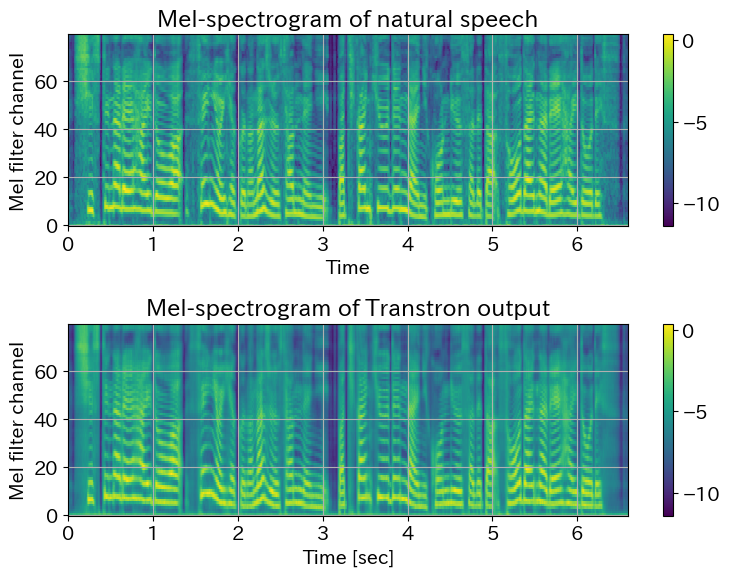

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 200, dev it:   1400, decoder_out: 1.80560, postnet_out: 1.80576, duration: 3.32537, loss: 6.93673


<Figure size 600x600 with 0 Axes>

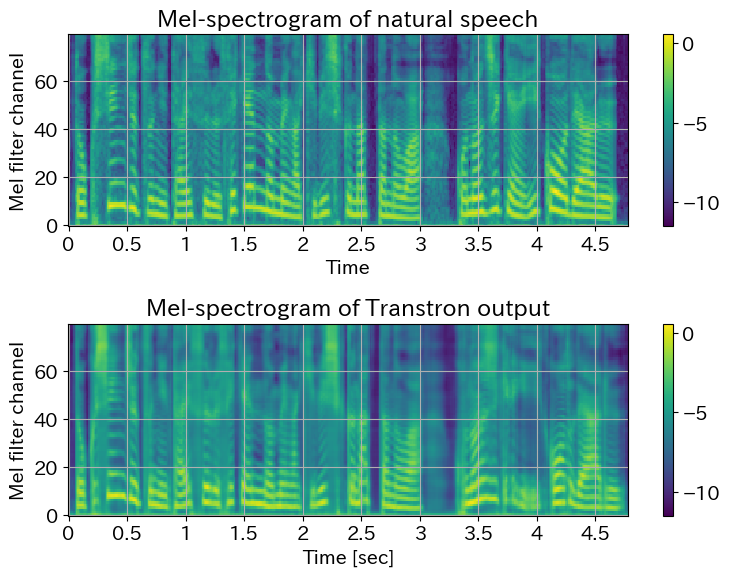

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 201, train it:  29547, decoder_out: 0.26021, postnet_out: 0.26013, duration: 0.20013, loss: 0.72047


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 201, dev it:   1407, decoder_out: 1.86351, postnet_out: 1.86364, duration: 3.41939, loss: 7.14654


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 202, train it:  29694, decoder_out: 0.25818, postnet_out: 0.25810, duration: 0.19359, loss: 0.70987


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 202, dev it:   1414, decoder_out: 1.91050, postnet_out: 1.91003, duration: 3.39544, loss: 7.21596


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 203, train it:  29841, decoder_out: 0.25757, postnet_out: 0.25754, duration: 0.19466, loss: 0.70977


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 203, dev it:   1421, decoder_out: 1.89561, postnet_out: 1.89587, duration: 3.33384, loss: 7.12531


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 204, train it:  29988, decoder_out: 0.25689, postnet_out: 0.25685, duration: 0.19672, loss: 0.71046


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 204, dev it:   1428, decoder_out: 1.85137, postnet_out: 1.85183, duration: 3.22176, loss: 6.92495


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 205, train it:  30135, decoder_out: 0.25644, postnet_out: 0.25640, duration: 0.18730, loss: 0.70015


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 205, dev it:   1435, decoder_out: 1.81905, postnet_out: 1.82106, duration: 3.14526, loss: 6.78537


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 206, train it:  30282, decoder_out: 0.25890, postnet_out: 0.25877, duration: 0.19293, loss: 0.71060


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 206, dev it:   1442, decoder_out: 1.82061, postnet_out: 1.82146, duration: 3.13394, loss: 6.77601


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 207, train it:  30429, decoder_out: 0.26001, postnet_out: 0.25996, duration: 0.19257, loss: 0.71253


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 207, dev it:   1449, decoder_out: 1.86480, postnet_out: 1.86489, duration: 3.16718, loss: 6.89686


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 208, train it:  30576, decoder_out: 0.25851, postnet_out: 0.25850, duration: 0.19316, loss: 0.71017


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 208, dev it:   1456, decoder_out: 1.84834, postnet_out: 1.84998, duration: 3.17980, loss: 6.87811


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 209, train it:  30723, decoder_out: 0.25649, postnet_out: 0.25659, duration: 0.20103, loss: 0.71411


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 209, dev it:   1463, decoder_out: 1.86117, postnet_out: 1.86148, duration: 3.13327, loss: 6.85593


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 210, train it:  30870, decoder_out: 0.25495, postnet_out: 0.25493, duration: 0.20862, loss: 0.71851


<Figure size 600x600 with 0 Axes>

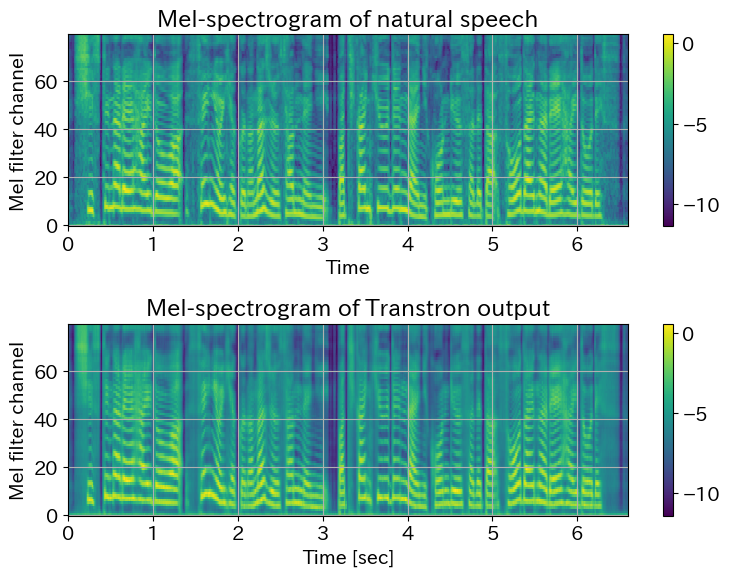

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 210, dev it:   1470, decoder_out: 1.87248, postnet_out: 1.87282, duration: 3.19154, loss: 6.93684


<Figure size 600x600 with 0 Axes>

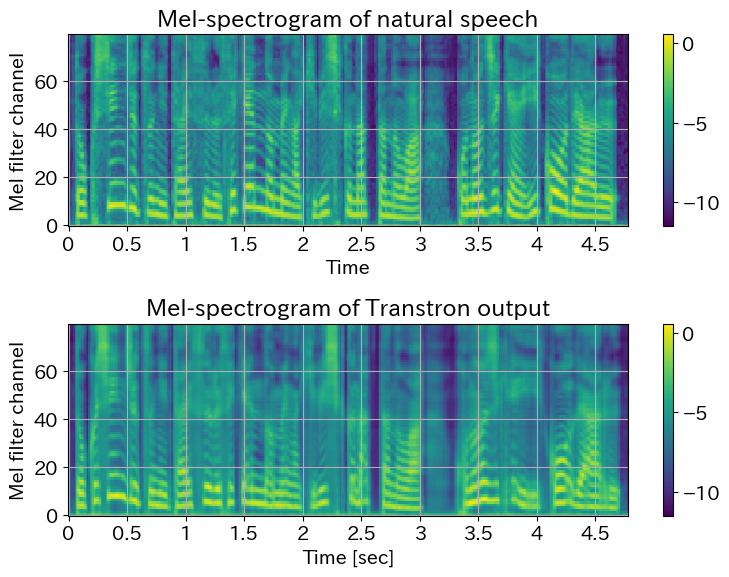

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 211, train it:  31017, decoder_out: 0.25367, postnet_out: 0.25349, duration: 0.20712, loss: 0.71428


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 211, dev it:   1477, decoder_out: 1.86369, postnet_out: 1.86411, duration: 3.22532, loss: 6.95312


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 212, train it:  31164, decoder_out: 0.25076, postnet_out: 0.25073, duration: 0.20785, loss: 0.70934


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 212, dev it:   1484, decoder_out: 1.89466, postnet_out: 1.89530, duration: 3.23449, loss: 7.02445


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 213, train it:  31311, decoder_out: 0.25489, postnet_out: 0.25475, duration: 0.23363, loss: 0.74326


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 213, dev it:   1491, decoder_out: 1.86247, postnet_out: 1.86267, duration: 3.26649, loss: 6.99164


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 214, train it:  31458, decoder_out: 0.24909, postnet_out: 0.24898, duration: 0.21113, loss: 0.70919


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 214, dev it:   1498, decoder_out: 1.84366, postnet_out: 1.84402, duration: 3.15363, loss: 6.84132


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 215, train it:  31605, decoder_out: 0.24269, postnet_out: 0.24262, duration: 0.19689, loss: 0.68221


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 215, dev it:   1505, decoder_out: 1.80740, postnet_out: 1.80755, duration: 3.11780, loss: 6.73275


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 216, train it:  31752, decoder_out: 0.23921, postnet_out: 0.23921, duration: 0.18443, loss: 0.66285


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 216, dev it:   1512, decoder_out: 1.80024, postnet_out: 1.80058, duration: 3.07825, loss: 6.67906


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 217, train it:  31899, decoder_out: 0.23712, postnet_out: 0.23712, duration: 0.18144, loss: 0.65567


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 217, dev it:   1519, decoder_out: 1.83401, postnet_out: 1.83451, duration: 3.13660, loss: 6.80513


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 218, train it:  32046, decoder_out: 0.23685, postnet_out: 0.23687, duration: 0.19421, loss: 0.66793


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 218, dev it:   1526, decoder_out: 1.85232, postnet_out: 1.85277, duration: 3.16164, loss: 6.86673


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 219, train it:  32193, decoder_out: 0.23806, postnet_out: 0.23804, duration: 0.18255, loss: 0.65864


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 219, dev it:   1533, decoder_out: 1.83411, postnet_out: 1.83412, duration: 3.06971, loss: 6.73794


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 220, train it:  32340, decoder_out: 0.23881, postnet_out: 0.23874, duration: 0.18629, loss: 0.66384


<Figure size 600x600 with 0 Axes>

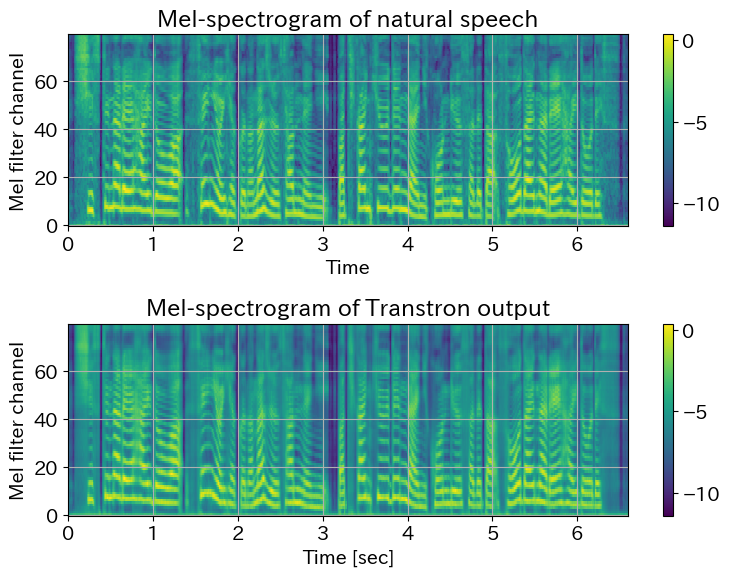

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 220, dev it:   1540, decoder_out: 1.82610, postnet_out: 1.82585, duration: 3.03596, loss: 6.68791


<Figure size 600x600 with 0 Axes>

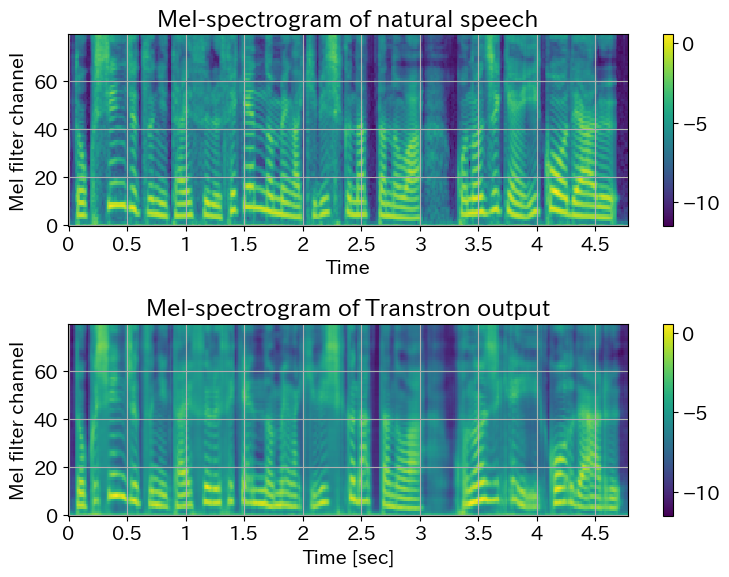

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 221, train it:  32487, decoder_out: 0.24094, postnet_out: 0.24090, duration: 0.19176, loss: 0.67360


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 221, dev it:   1547, decoder_out: 1.85857, postnet_out: 1.85863, duration: 3.12793, loss: 6.84513


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 222, train it:  32634, decoder_out: 0.24179, postnet_out: 0.24162, duration: 0.20603, loss: 0.68944


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 222, dev it:   1554, decoder_out: 1.86848, postnet_out: 1.86904, duration: 3.26867, loss: 7.00618


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 223, train it:  32781, decoder_out: 0.24041, postnet_out: 0.24031, duration: 0.22888, loss: 0.70960


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 223, dev it:   1561, decoder_out: 1.83301, postnet_out: 1.83302, duration: 3.26811, loss: 6.93414


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 224, train it:  32928, decoder_out: 0.23812, postnet_out: 0.23799, duration: 0.22015, loss: 0.69626


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 224, dev it:   1568, decoder_out: 1.83221, postnet_out: 1.83227, duration: 3.22270, loss: 6.88718


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 225, train it:  33075, decoder_out: 0.23475, postnet_out: 0.23460, duration: 0.21227, loss: 0.68163


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 225, dev it:   1575, decoder_out: 1.83116, postnet_out: 1.83178, duration: 3.18489, loss: 6.84782


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 226, train it:  33222, decoder_out: 0.23371, postnet_out: 0.23368, duration: 0.20815, loss: 0.67554


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 226, dev it:   1582, decoder_out: 1.81716, postnet_out: 1.81788, duration: 3.28617, loss: 6.92122


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 227, train it:  33369, decoder_out: 0.23365, postnet_out: 0.23365, duration: 0.20679, loss: 0.67409


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 227, dev it:   1589, decoder_out: 1.83135, postnet_out: 1.83169, duration: 3.51070, loss: 7.17375


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 228, train it:  33516, decoder_out: 0.23406, postnet_out: 0.23407, duration: 0.22911, loss: 0.69724


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 228, dev it:   1596, decoder_out: 1.85955, postnet_out: 1.85975, duration: 4.24399, loss: 7.96329


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 229, train it:  33663, decoder_out: 0.25028, postnet_out: 0.25028, duration: 0.26115, loss: 0.76171


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 229, dev it:   1603, decoder_out: 1.87001, postnet_out: 1.87032, duration: 3.22084, loss: 6.96117


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 230, train it:  33810, decoder_out: 0.24400, postnet_out: 0.24395, duration: 0.22693, loss: 0.71487


<Figure size 600x600 with 0 Axes>

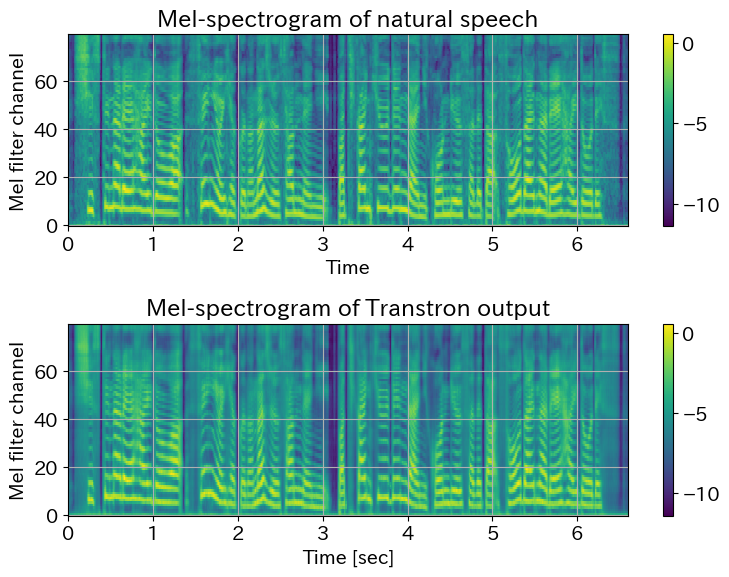

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 230, dev it:   1610, decoder_out: 1.86070, postnet_out: 1.86118, duration: 3.29067, loss: 7.01255


<Figure size 600x600 with 0 Axes>

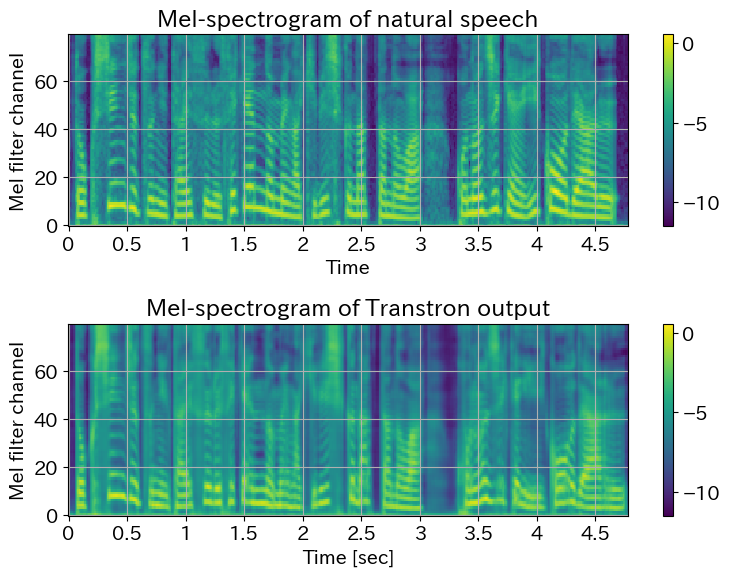

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 231, train it:  33957, decoder_out: 0.23712, postnet_out: 0.23698, duration: 0.21323, loss: 0.68733


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 231, dev it:   1617, decoder_out: 1.84944, postnet_out: 1.84962, duration: 3.49221, loss: 7.19128


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 232, train it:  34104, decoder_out: 0.23130, postnet_out: 0.23125, duration: 0.20516, loss: 0.66771


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 232, dev it:   1624, decoder_out: 1.82578, postnet_out: 1.82601, duration: 3.32828, loss: 6.98008


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 233, train it:  34251, decoder_out: 0.23075, postnet_out: 0.23076, duration: 0.19817, loss: 0.65968


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 233, dev it:   1631, decoder_out: 1.79974, postnet_out: 1.79977, duration: 3.21375, loss: 6.81325


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 234, train it:  34398, decoder_out: 0.22935, postnet_out: 0.22931, duration: 0.18176, loss: 0.64043


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 234, dev it:   1638, decoder_out: 1.79098, postnet_out: 1.79102, duration: 3.13263, loss: 6.71462


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 235, train it:  34545, decoder_out: 0.22737, postnet_out: 0.22731, duration: 0.17933, loss: 0.63401


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 235, dev it:   1645, decoder_out: 1.81492, postnet_out: 1.81503, duration: 3.12132, loss: 6.75127


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 236, train it:  34692, decoder_out: 0.22599, postnet_out: 0.22602, duration: 0.17631, loss: 0.62832


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 236, dev it:   1652, decoder_out: 1.86949, postnet_out: 1.86957, duration: 3.13813, loss: 6.87718


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 237, train it:  34839, decoder_out: 0.22534, postnet_out: 0.22535, duration: 0.17326, loss: 0.62396


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 237, dev it:   1659, decoder_out: 1.90321, postnet_out: 1.90324, duration: 3.20190, loss: 7.00835


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 238, train it:  34986, decoder_out: 0.22657, postnet_out: 0.22651, duration: 0.18084, loss: 0.63392


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 238, dev it:   1666, decoder_out: 1.90582, postnet_out: 1.90625, duration: 3.27900, loss: 7.09108


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 239, train it:  35133, decoder_out: 0.23007, postnet_out: 0.22998, duration: 0.18570, loss: 0.64575


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 239, dev it:   1673, decoder_out: 1.88901, postnet_out: 1.88872, duration: 3.31694, loss: 7.09468


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 240, train it:  35280, decoder_out: 0.23190, postnet_out: 0.23179, duration: 0.19471, loss: 0.65840


<Figure size 600x600 with 0 Axes>

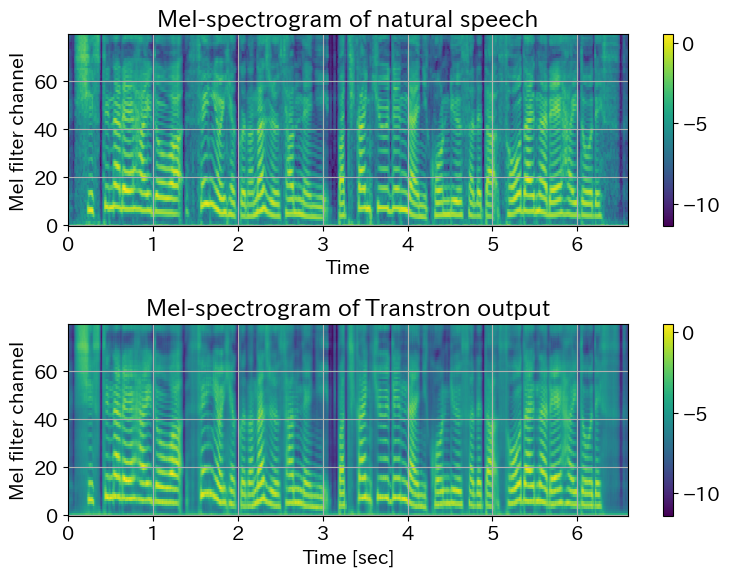

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 240, dev it:   1680, decoder_out: 1.89854, postnet_out: 1.89906, duration: 3.28000, loss: 7.07761


<Figure size 600x600 with 0 Axes>

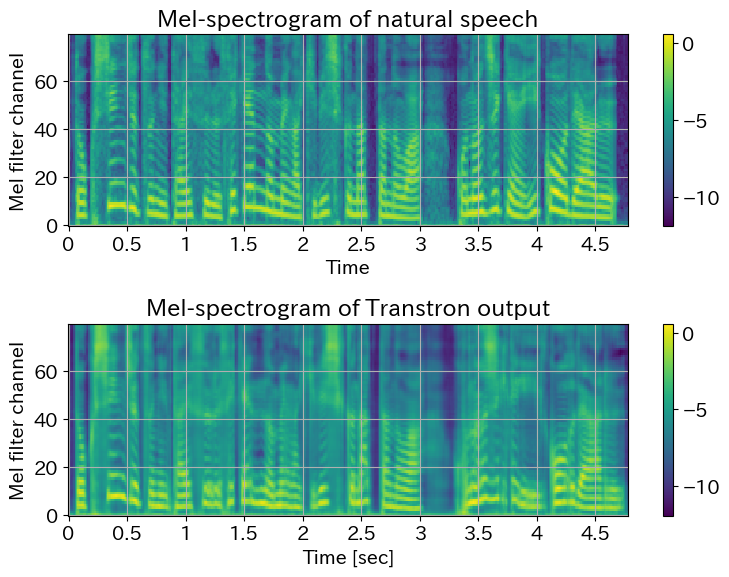

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 241, train it:  35427, decoder_out: 0.23455, postnet_out: 0.23463, duration: 0.18278, loss: 0.65196


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 241, dev it:   1687, decoder_out: 1.87881, postnet_out: 1.87907, duration: 3.28780, loss: 7.04568


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 242, train it:  35574, decoder_out: 0.23337, postnet_out: 0.23322, duration: 0.17523, loss: 0.64182


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 242, dev it:   1694, decoder_out: 1.88558, postnet_out: 1.88592, duration: 3.44235, loss: 7.21385


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 243, train it:  35721, decoder_out: 0.22905, postnet_out: 0.22884, duration: 0.17318, loss: 0.63107


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 243, dev it:   1701, decoder_out: 1.90017, postnet_out: 1.90160, duration: 3.29969, loss: 7.10146


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 244, train it:  35868, decoder_out: 0.22359, postnet_out: 0.22351, duration: 0.17633, loss: 0.62343


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 244, dev it:   1708, decoder_out: 1.85113, postnet_out: 1.85149, duration: 3.13236, loss: 6.83498


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 245, train it:  36015, decoder_out: 0.22099, postnet_out: 0.22090, duration: 0.17848, loss: 0.62037


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 245, dev it:   1715, decoder_out: 1.89047, postnet_out: 1.89132, duration: 3.14654, loss: 6.92833


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 246, train it:  36162, decoder_out: 0.21984, postnet_out: 0.21978, duration: 0.17677, loss: 0.61638


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 246, dev it:   1722, decoder_out: 1.88180, postnet_out: 1.88257, duration: 3.13059, loss: 6.89496


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 247, train it:  36309, decoder_out: 0.22042, postnet_out: 0.22026, duration: 0.17725, loss: 0.61793


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 247, dev it:   1729, decoder_out: 1.86697, postnet_out: 1.86725, duration: 3.10110, loss: 6.83532


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 248, train it:  36456, decoder_out: 0.21982, postnet_out: 0.21961, duration: 0.17714, loss: 0.61656


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 248, dev it:   1736, decoder_out: 1.88261, postnet_out: 1.88289, duration: 3.16689, loss: 6.93239


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 249, train it:  36603, decoder_out: 0.21881, postnet_out: 0.21877, duration: 0.17347, loss: 0.61104


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 249, dev it:   1743, decoder_out: 1.91154, postnet_out: 1.91171, duration: 3.34414, loss: 7.16739


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 250, train it:  36750, decoder_out: 0.21791, postnet_out: 0.21786, duration: 0.17976, loss: 0.61553


<Figure size 600x600 with 0 Axes>

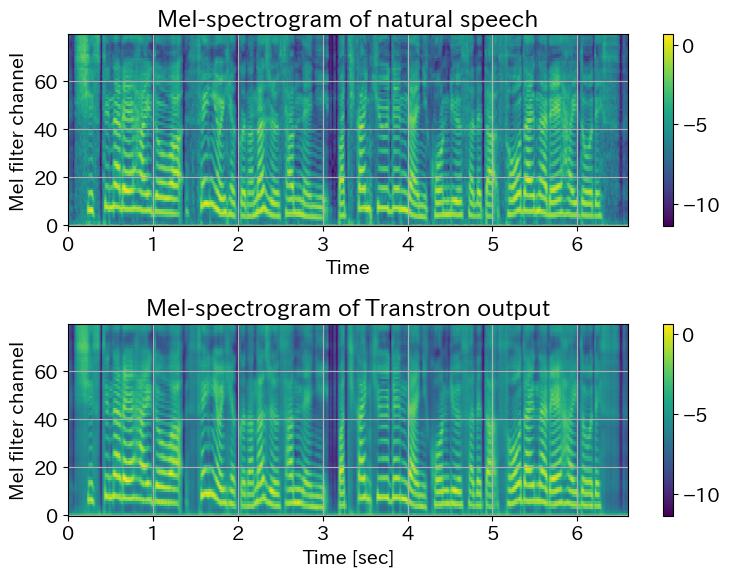

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 250, dev it:   1750, decoder_out: 1.85948, postnet_out: 1.85953, duration: 3.32762, loss: 7.04663


<Figure size 600x600 with 0 Axes>

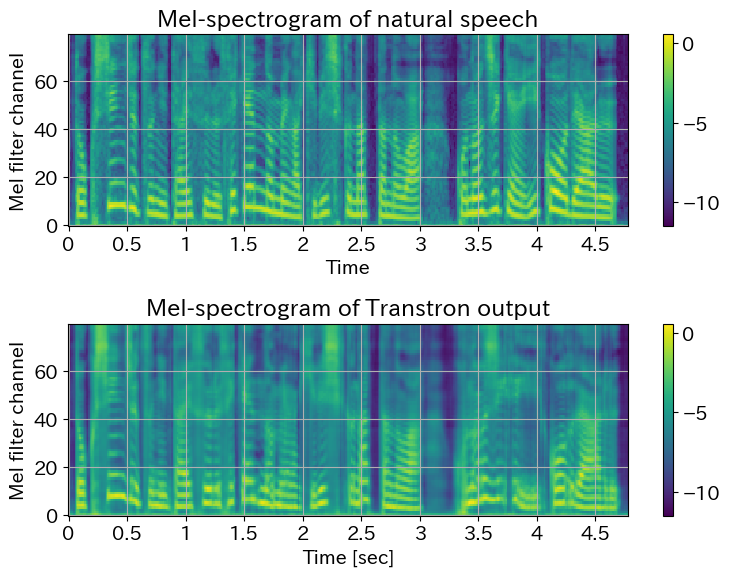

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 251, train it:  36897, decoder_out: 0.21919, postnet_out: 0.21914, duration: 0.18124, loss: 0.61957


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 251, dev it:   1757, decoder_out: 1.87156, postnet_out: 1.87028, duration: 3.34234, loss: 7.08418


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 252, train it:  37044, decoder_out: 0.22096, postnet_out: 0.22088, duration: 0.18381, loss: 0.62564


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 252, dev it:   1764, decoder_out: 1.83596, postnet_out: 1.83630, duration: 3.21116, loss: 6.88342


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 253, train it:  37191, decoder_out: 0.22207, postnet_out: 0.22197, duration: 0.20194, loss: 0.64597


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 253, dev it:   1771, decoder_out: 1.82309, postnet_out: 1.82285, duration: 3.17459, loss: 6.82053


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 254, train it:  37338, decoder_out: 0.22318, postnet_out: 0.22307, duration: 0.19927, loss: 0.64551


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 254, dev it:   1778, decoder_out: 1.87039, postnet_out: 1.87105, duration: 3.14525, loss: 6.88669


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 255, train it:  37485, decoder_out: 0.22242, postnet_out: 0.22230, duration: 0.21643, loss: 0.66115


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 255, dev it:   1785, decoder_out: 1.91755, postnet_out: 1.91790, duration: 3.32042, loss: 7.15587


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 256, train it:  37632, decoder_out: 0.22203, postnet_out: 0.22197, duration: 0.22157, loss: 0.66557


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 256, dev it:   1792, decoder_out: 1.87217, postnet_out: 1.87274, duration: 3.33557, loss: 7.08048


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 257, train it:  37779, decoder_out: 0.22393, postnet_out: 0.22386, duration: 0.21591, loss: 0.66371


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 257, dev it:   1799, decoder_out: 1.84629, postnet_out: 1.84698, duration: 3.33673, loss: 7.02999


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 258, train it:  37926, decoder_out: 0.22545, postnet_out: 0.22540, duration: 0.20914, loss: 0.65998


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 258, dev it:   1806, decoder_out: 1.84445, postnet_out: 1.84477, duration: 3.29035, loss: 6.97956


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 259, train it:  38073, decoder_out: 0.22348, postnet_out: 0.22327, duration: 0.21335, loss: 0.66010


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 259, dev it:   1813, decoder_out: 1.86847, postnet_out: 1.86860, duration: 3.20958, loss: 6.94665


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 260, train it:  38220, decoder_out: 0.22369, postnet_out: 0.22352, duration: 0.21486, loss: 0.66208


<Figure size 600x600 with 0 Axes>

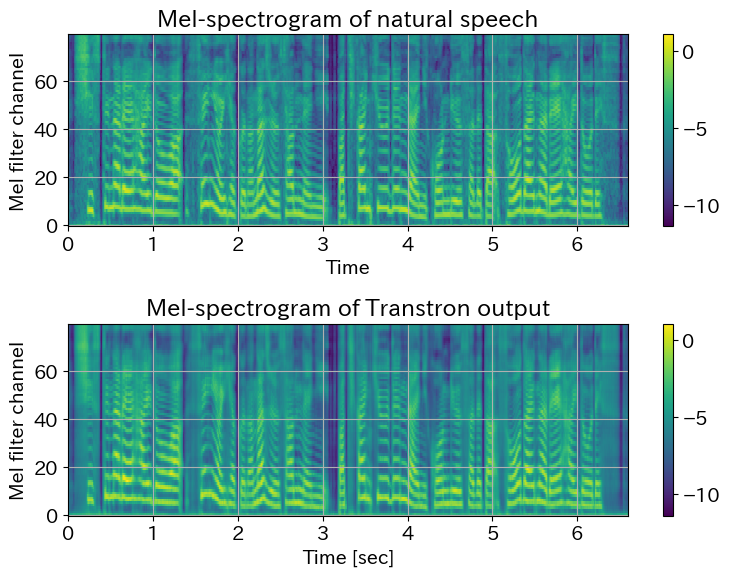

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 260, dev it:   1820, decoder_out: 1.85588, postnet_out: 1.85555, duration: 3.98574, loss: 7.69718


<Figure size 600x600 with 0 Axes>

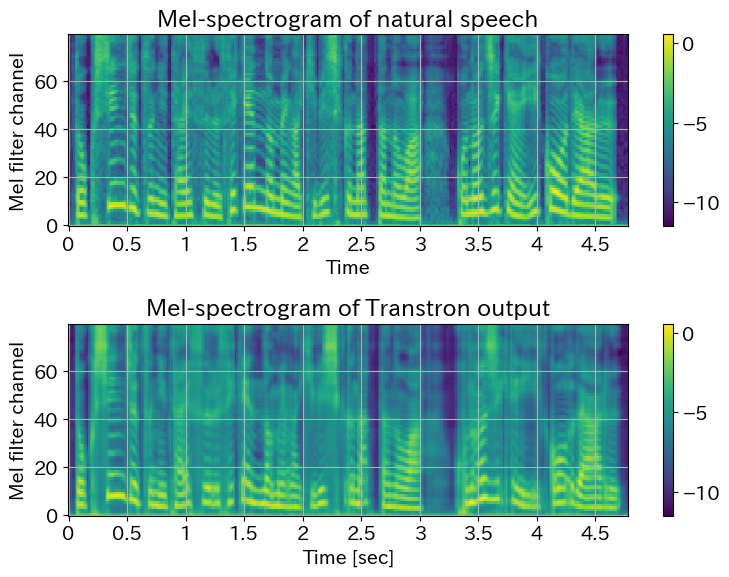

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 261, train it:  38367, decoder_out: 0.23422, postnet_out: 0.23418, duration: 0.23996, loss: 0.70836


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 261, dev it:   1827, decoder_out: 1.89826, postnet_out: 1.89863, duration: 3.36409, loss: 7.16099


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 262, train it:  38514, decoder_out: 0.24863, postnet_out: 0.24863, duration: 0.28512, loss: 0.78238


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 262, dev it:   1834, decoder_out: 1.89413, postnet_out: 1.89427, duration: 3.27650, loss: 7.06490


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 263, train it:  38661, decoder_out: 0.23813, postnet_out: 0.23808, duration: 0.21684, loss: 0.69306


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 263, dev it:   1841, decoder_out: 1.94141, postnet_out: 1.94141, duration: 3.29845, loss: 7.18127


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 264, train it:  38808, decoder_out: 0.22532, postnet_out: 0.22525, duration: 0.18402, loss: 0.63459


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 264, dev it:   1848, decoder_out: 1.91594, postnet_out: 1.91622, duration: 3.31893, loss: 7.15109


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 265, train it:  38955, decoder_out: 0.21695, postnet_out: 0.21685, duration: 0.16221, loss: 0.59601


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 265, dev it:   1855, decoder_out: 1.91841, postnet_out: 1.91786, duration: 3.31063, loss: 7.14690


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 266, train it:  39102, decoder_out: 0.21444, postnet_out: 0.21425, duration: 0.15692, loss: 0.58561


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 266, dev it:   1862, decoder_out: 1.92294, postnet_out: 1.92236, duration: 3.27114, loss: 7.11644


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 267, train it:  39249, decoder_out: 0.21261, postnet_out: 0.21266, duration: 0.15069, loss: 0.57596


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 267, dev it:   1869, decoder_out: 1.86219, postnet_out: 1.86219, duration: 3.25223, loss: 6.97661


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 268, train it:  39396, decoder_out: 0.21335, postnet_out: 0.21321, duration: 0.14604, loss: 0.57261


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 268, dev it:   1876, decoder_out: 1.82901, postnet_out: 1.82965, duration: 3.22983, loss: 6.88849


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 269, train it:  39543, decoder_out: 0.21371, postnet_out: 0.21360, duration: 0.14554, loss: 0.57285


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 269, dev it:   1883, decoder_out: 1.88793, postnet_out: 1.88945, duration: 3.22450, loss: 7.00189


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 270, train it:  39690, decoder_out: 0.21343, postnet_out: 0.21328, duration: 0.14341, loss: 0.57012


<Figure size 600x600 with 0 Axes>

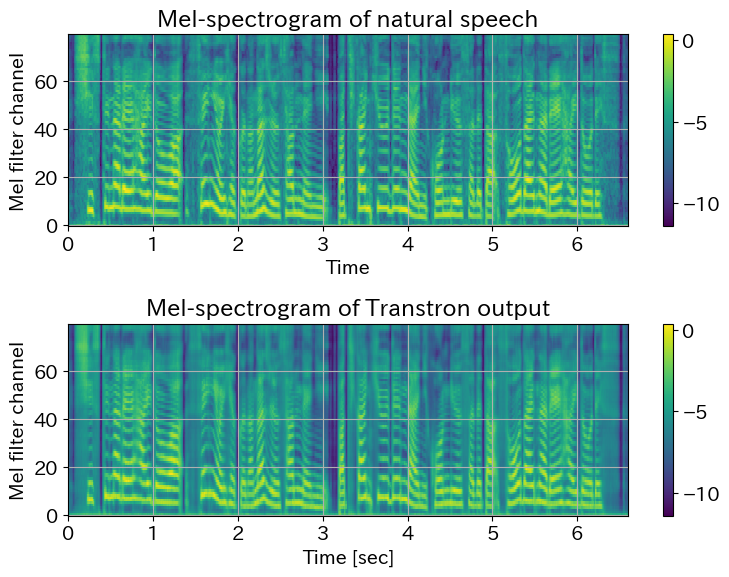

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 270, dev it:   1890, decoder_out: 1.88395, postnet_out: 1.88424, duration: 3.18883, loss: 6.95702


<Figure size 600x600 with 0 Axes>

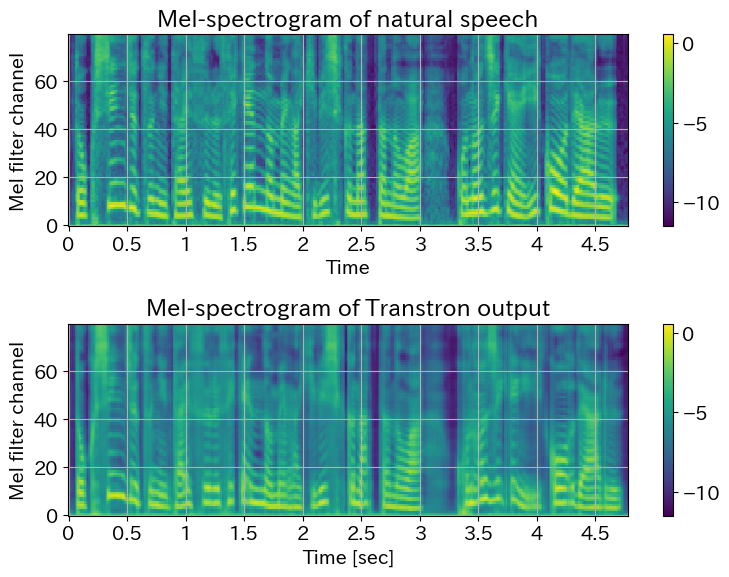

train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 271, train it:  39837, decoder_out: 0.21180, postnet_out: 0.21175, duration: 0.14720, loss: 0.57075


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 271, dev it:   1897, decoder_out: 1.86373, postnet_out: 1.86419, duration: 3.23235, loss: 6.96027


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 272, train it:  39984, decoder_out: 0.21382, postnet_out: 0.21381, duration: 0.14854, loss: 0.57618


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 272, dev it:   1904, decoder_out: 1.87202, postnet_out: 1.87250, duration: 3.24241, loss: 6.98693


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 273, train it:  40131, decoder_out: 0.21386, postnet_out: 0.21362, duration: 0.14790, loss: 0.57538


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 273, dev it:   1911, decoder_out: 1.85695, postnet_out: 1.85713, duration: 3.30135, loss: 7.01543


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 274, train it:  40278, decoder_out: 0.21263, postnet_out: 0.21237, duration: 0.15269, loss: 0.57769


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 274, dev it:   1918, decoder_out: 1.85767, postnet_out: 1.85811, duration: 3.38711, loss: 7.10289


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 275, train it:  40425, decoder_out: 0.21215, postnet_out: 0.21178, duration: 0.15656, loss: 0.58049


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 275, dev it:   1925, decoder_out: 1.86091, postnet_out: 1.86182, duration: 3.52816, loss: 7.25089


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 276, train it:  40572, decoder_out: 0.21131, postnet_out: 0.21136, duration: 0.16946, loss: 0.59212


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 276, dev it:   1932, decoder_out: 1.86457, postnet_out: 1.86494, duration: 3.57133, loss: 7.30085


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 277, train it:  40719, decoder_out: 0.21066, postnet_out: 0.21055, duration: 0.18580, loss: 0.60701


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 277, dev it:   1939, decoder_out: 1.86391, postnet_out: 1.86461, duration: 3.45037, loss: 7.17889


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 278, train it:  40866, decoder_out: 0.20858, postnet_out: 0.20827, duration: 0.19262, loss: 0.60947


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 278, dev it:   1946, decoder_out: 1.86501, postnet_out: 1.86562, duration: 3.45079, loss: 7.18142


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 279, train it:  41013, decoder_out: 0.20436, postnet_out: 0.20425, duration: 0.19655, loss: 0.60516


dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 279, dev it:   1953, decoder_out: 1.87627, postnet_out: 1.87639, duration: 3.34991, loss: 7.10257


train:   0%|          | 0/147 [00:00<?, ?it/s]

epoch: 280, train it:  41160, decoder_out: 0.20131, postnet_out: 0.20128, duration: 0.20014, loss: 0.60273


<Figure size 600x600 with 0 Axes>

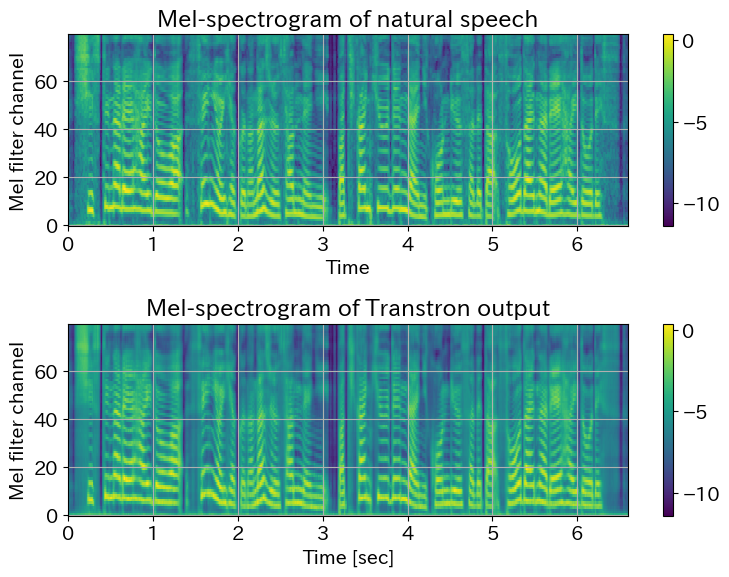

dev:   0%|          | 0/7 [00:00<?, ?it/s]

epoch: 280, dev it:   1960, decoder_out: 1.88070, postnet_out: 1.88088, duration: 3.30526, loss: 7.06685


<Figure size 600x600 with 0 Axes>

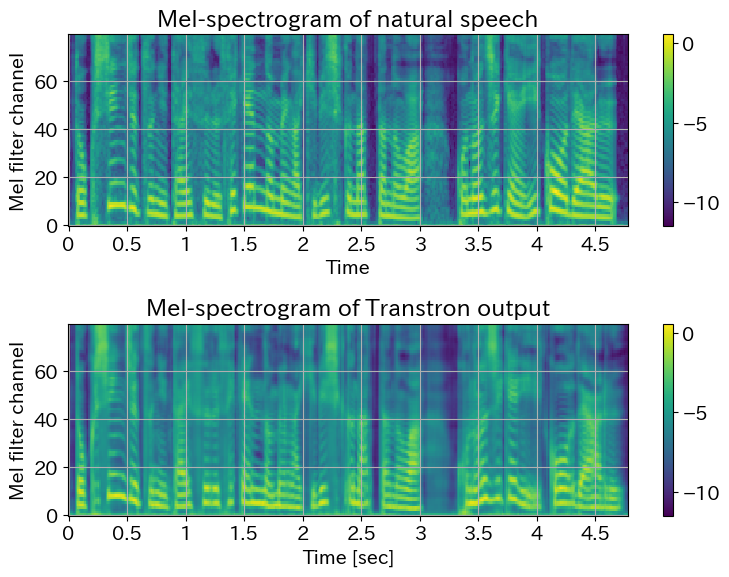

train:   0%|          | 0/147 [00:00<?, ?it/s]

In [ ]:
#学習
from ttslearn.util import make_non_pad_mask
from ttslearn.tacotron import Tacotron2TTS
from tqdm.notebook import tqdm
from IPython.display import Audio
import pandas as pd
from ttslearn.notebook import get_cmap, init_plot_style, savefig
from drawnow import drawnow, figure

history = np.zeros((0, 7))
history_dev = np.zeros((0, 6))
cmap = get_cmap()
init_plot_style()

num_epochs = 10000
it_train = 0
it_dev = 0

for epoch in range( num_epochs ):
    
    model.train()
    total_decoder_out_loss = 0
    total_postnet_out_loss = 0
    total_dur_loss = 0
    total_loss = 0
    count = 0
    # DataLoader を用いたミニバッチの作成: ミニバッチ毎に処理する
    phar = tqdm( range( len(data_loader) ), desc='train' )
    Iter_train = iter(data_loader)
    
    for i in phar:
        in_feats, in_lens, out_feats, out_lens, dur_feats, dur_lens = next(Iter_train)
        in_feats = in_feats.to(device)
        in_lens = in_lens.to(device)
        out_feats = out_feats.to(device)
        out_lens = out_lens.to(device)
        dur_feats1 = torch.round( dur_feats ).long().to(device)
        dur_feats2 = dur_feats.to(device)
        dur_lens = dur_lens.to(device)
        in_lens, indices = torch.sort(in_lens, dim=0, descending=True)
        in_feats, out_feats, out_lens = in_feats[indices], out_feats[indices], out_lens[indices]
        dur_feats1, dur_feats2, dur_lens = dur_feats1[indices], dur_feats2[indices], dur_lens[indices]
    
        #count += len( in_feats )
        count += 1
        
        #print("in_feats:", in_feats )
        #print("out_feats:", out_feats )
        #print( "dur_feats:", dur_feats )
    
        # 順伝搬の計算
        outs, outs_fine, duration, _  = model(in_feats, in_lens, out_feats, out_lens, dur_feats1)
        duration = duration.to(device)
        
        # ゼロパディグした部分を損失関数のの計算から除外するためにマスクを適用します
        # Mask (B x T x 1)
        mask = make_non_pad_mask(out_lens).unsqueeze(-1).to(device)
        mask2 = make_non_pad_mask(in_lens).unsqueeze(-1).to(device)
        out_feats = out_feats.masked_select(mask)
        outs = outs.masked_select(mask)
        outs_fine = outs_fine.masked_select(mask)
        dur_feats2 = dur_feats2.masked_select(mask2.squeeze(-1))
        duration = duration.masked_select(mask2.squeeze(-1))

        
        # 損失の計算
        decoder_out_loss = nn.MSELoss()(outs, out_feats)
        postnet_out_loss = nn.MSELoss()(outs_fine, out_feats) 
        dur_loss = nn.MSELoss()(duration, dur_feats2 )
        #print( "decoder_out_loss:", decoder_out_loss )
        #print( "postnet_out_loss:", postnet_out_loss )
        #print( "dur_loss:", dur_loss )
        
        # 損失の合計
        loss = decoder_out_loss + postnet_out_loss + dur_loss
        
        total_loss += loss.item()
        total_decoder_out_loss += decoder_out_loss.item()
        total_postnet_out_loss += postnet_out_loss.item()
        total_dur_loss += dur_loss.item()
        
        # 損失の値を出力
        it_train += 1
        # optimizer に蓄積された勾配をリセット
        optimizer.zero_grad()
        # 誤差の逆伝播
        loss.backward()
        # パラメータの更新
        optimizer.step()
        # 学習率スケジューラの更新
        current_lr = optimizer.param_groups[0]["lr"]
        lr_scheduler.step()
        
        avg_loss = total_loss / count
        
        #プログラスバーに cer 表示
        phar.set_postfix( loss = avg_loss )   
        
    avg_loss = total_loss / count
    avg_decoder_out_loss = total_decoder_out_loss / count
    avg_postnet_out_loss = total_postnet_out_loss / count
    avg_dur_loss = total_dur_loss / count
    
    print(f"epoch: {epoch+1:3d}, train it: {it_train:6d}, decoder_out: {avg_decoder_out_loss :.5f}, postnet_out: {avg_postnet_out_loss :.5f}, duration: {avg_dur_loss :.5f}, loss: {avg_loss :.5f}")
    item = np.array([epoch+1, it_train, avg_decoder_out_loss , avg_postnet_out_loss , avg_dur_loss , avg_loss ,  current_lr ])
    history = np.vstack((history, item))
    
    if ( epoch + 1 ) % 10 == 0:
        Iter_train2 = iter(data_loader)
        in_feats, in_lens, out_feats, out_lens, dur_feats, dur_lens = next(Iter_train2)
        in_feats = in_feats.to(device)
        in_lens = in_lens.to(device)
        out_feats = out_feats.to(device)
        out_lens = out_lens.to(device)
        dur_feats1 = torch.round( dur_feats ).long().to(device)
        #dur_feats2 = dur_feats.to(device)
        dur_lens = dur_lens.to(device)
        in_lens, indices = torch.sort(in_lens, dim=0, descending=True)
        in_feats, out_feats, out_lens = in_feats[indices], out_feats[indices], out_lens[indices]
        dur_feats1, dur_lens = dur_feats1[indices], dur_lens[indices]
        with torch.no_grad():
            outs, outs_fine, duration, _   = model(in_feats, in_lens, out_feats, out_lens, dur_feats1)
        feats = out_feats[0].cpu().detach().numpy()
        out_feats_fine = outs_fine[0].cpu().detach().numpy() 
    
        drawnow( plot_a_graph )
    
    model.eval()
    total_dev_decoder_out_loss = 0
    total_dev_postnet_out_loss = 0
    total_dev_dur_loss = 0
    total_dev_loss = 0
    count = 0

    
    # DataLoader を用いたミニバッチの作成: ミニバッチ毎に処理する
    phar = tqdm( range( len(data_loader_dev) ), desc='dev' )
    Iter_dev = iter(data_loader_dev)
    
    for i in phar:
        in_feats, in_lens, out_feats, out_lens, dur_feats, dur_lens = next(Iter_dev)
        in_feats = in_feats.to(device)
        in_lens = in_lens.to(device)
        out_feats = out_feats.to(device)
        out_lens = out_lens.to(device)
        dur_feats1 = torch.round( dur_feats ).long().to(device)
        dur_feats2 = dur_feats.to(device)
        dur_lens = dur_lens.to(device)
        in_lens, indices = torch.sort(in_lens, dim=0, descending=True)
        in_feats, out_feats, out_lens = in_feats[indices], out_feats[indices], out_lens[indices]
        dur_feats1, dur_feats2, dur_lens = dur_feats1[indices], dur_feats2[indices], dur_lens[indices]
        
        count += 1
   
        with torch.no_grad():
            outs, outs_fine,  duration, _ = model(in_feats, in_lens, out_feats, out_lens, dur_feats1)
        duration = duration.to(device)
            
        # ゼロパディグした部分を損失関数のの計算から除外するためにマスクを適用します
        # Mask (B x T x 1)
        mask = make_non_pad_mask(out_lens).unsqueeze(-1).to(device)
        mask2 = make_non_pad_mask(in_lens).unsqueeze(-1).to(device)
        out_feats = out_feats.masked_select(mask)
        outs = outs.masked_select(mask)
        outs_fine = outs_fine.masked_select(mask)
        dur_feats2 = dur_feats2.masked_select(mask2.squeeze(-1))
        duration = duration.masked_select(mask2.squeeze(-1))

        
        # 損失の計算
        dev_decoder_out_loss = nn.MSELoss()(outs, out_feats)
        dev_postnet_out_loss = nn.MSELoss()(outs_fine, out_feats) 
        #print( "duration:{}".format( duration ))
        #print( "out_lens.float()/3000:{}".format( out_lens.float() / target_max ))
        dev_dur_loss = nn.MSELoss()(duration, dur_feats2 )

        
        # 損失の合計
        dev_loss = dev_decoder_out_loss + dev_postnet_out_loss + dev_dur_loss
        
        total_dev_loss += dev_loss.item()
        total_dev_decoder_out_loss += dev_decoder_out_loss.item()
        total_dev_postnet_out_loss += dev_postnet_out_loss.item()
        total_dev_dur_loss += dev_dur_loss.item()
        
        avg_dev_loss = total_dev_loss / count
        
        #プログラスバーに cer 表示
        phar.set_postfix( dev_loss = avg_dev_loss ) 

        # 損失の値を出力
        it_dev += 1
        
    avg_dev_loss = total_dev_loss / count
    avg_dev_decoder_out_loss = total_dev_decoder_out_loss / count
    avg_dev_postnet_out_loss = total_dev_postnet_out_loss / count
    avg_dev_dur_loss = total_dev_dur_loss / count    
    
    print(f"epoch: {epoch+1:3d}, dev it: {it_dev:6d}, decoder_out: {avg_dev_decoder_out_loss:.5f}, postnet_out: {avg_dev_postnet_out_loss:.5f}, duration: {avg_dev_dur_loss:.5f}, loss: {avg_dev_loss:.5f}")
    item = np.array([epoch+1, it_dev, avg_dev_decoder_out_loss , avg_dev_postnet_out_loss , avg_dev_dur_loss , avg_dev_loss ])
    history_dev = np.vstack((history_dev, item))

    if ( epoch + 1 ) % 10 == 0:
        Iter_dev2 = iter(data_loader_dev)
        in_feats, in_lens, out_feats, out_lens, dur_feats, dur_lens = next(Iter_dev2)
        in_feats = in_feats.to(device)
        in_lens = in_lens.to(device)
        out_feats = out_feats.to(device)
        out_lens = out_lens.to(device)
        dur_feats1 = torch.round( dur_feats ).long().to(device)
        #dur_feats2 = dur_feats.to(device)
        dur_lens = dur_lens.to(device)
        in_lens, indices = torch.sort(in_lens, dim=0, descending=True)
        in_feats, out_feats, out_lens = in_feats[indices], out_feats[indices], out_lens[indices]
        dur_feats1, dur_lens = dur_feats1[indices], dur_lens[indices]
        with torch.no_grad():
            outs, outs_fine, duration, _  = model(in_feats, in_lens, out_feats, out_lens, dur_feats1)
        feats = out_feats[0].cpu().detach().numpy()
        out_feats_fine = outs_fine[0].cpu().detach().numpy() 
    
        drawnow( plot_a_graph )    
    
    if ( epoch + 1 ) == num_epochs:
        epoch_str = "last_" + format(epoch+1,"04d")
    
        hist_df = pd.DataFrame(history)
        filename_his = "./ch142/history_ch142_" + epoch_str + ".csv"
        hist_df.to_csv(filename_his, header=False, index=False)
        hist_dev_df = pd.DataFrame(history_dev)
        filename_his_dev = "./ch142/history_dev_ch142_" + epoch_str + ".csv"
        hist_dev_df.to_csv(filename_his_dev, header=False, index=False)    
    
        save_path = "./ch142/transtron_weight_training_ch142_" + epoch_str + ".pt"
        torch.save({'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': avg_loss,
            'dev_loss': avg_dev_loss,},
           save_path)
    elif (epoch + 1) % 100 == 0:
        epoch_str = format(epoch+1,"04d")
    
        hist_df = pd.DataFrame(history)
        filename_his = "./ch142/history_ch142_" + epoch_str + ".csv"
        hist_df.to_csv(filename_his, header=False, index=False)
        hist_dev_df = pd.DataFrame(history_dev)
        filename_his_dev = "./ch142/history_dev_ch142_" + epoch_str + ".csv"
        hist_dev_df.to_csv(filename_his_dev, header=False, index=False)    
    
        save_path = "./ch142/transtron_weight_training_ch142_" + epoch_str + ".pt"
        torch.save({'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': avg_loss,
            'dev_loss': avg_dev_loss,},
           save_path)      

In [98]:
#モデルのロード　inference 用

import torch
import pandas as pd

model = Transtron(
    num_vocab=59,
    embed_dim=512,
    conv_layers=3,
    conv_channels=512,
    conv_kernel_size=5,
    enc_hidden_dim = 512,
    num_enc_layers = 6,
    enc_num_heads = 4,
    enc_dropout_rate = 0.1,
    conv_dropout_rate = 0.1,
    enc_input_maxlen = 300,
    enc_ffn_dim = 2048,
    enc_kernel_size = 3,
    enc_filter_size = 2048,
    decoder_hidden_dim=512,
    prenet_in_dim = 512,
    out_dim=80,
    num_dec_layers=6,
    prenet_layers=2,
    prenet_hidden_dim=512,
    prenet_dropout=0.5,
    dec_ffn_dim=2048,
    dec_dropout_rate = 0.1,
    dec_input_maxlen=3000,
    dec_num_heads = 4,
    dec_kernel_size = 3,
    dec_filter_size = 2048,
    postnet_in_dim=80,
    postnet_layers=5,
    postnet_channels=512,
    postnet_kernel_size=5,
    postnet_dropout=0.5,
    dp_input_size = 512, 
    dp_filter_size = 512,
    dp_kernel_size = 3,
    dp_dropout = 0.4,
)

device =  torch.device("cpu")
optimizer = optim.Adam(model.parameters(), lr=0.0001)

model = model.to(device)

model.eval()

save_path2 = "./ch142/transtron_weight_training_ch142_0100.pt"
checkpoint = torch.load(save_path2, map_location=torch.device('cpu'))
model.load_state_dict(checkpoint['model_state_dict'])

#optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#for state in optimizer.state.values():
#    for k, v in state.items():
#        if isinstance(v, torch.Tensor):
#            state[k] = v.to('cuda')

<All keys matched successfully>

In [99]:
# デフォルトフォントサイズ変更
plt.rcParams['font.size'] = 10

import numpy as np
history = np.loadtxt("./ch142/history_ch142_0100.csv", delimiter=",", dtype = "unicode")
history = [[ float(s) for s in s1 ] for s1 in history]
history = np.array( history )
print( history )
history_dev = np.loadtxt("./ch142/history_dev_ch142_0100.csv", delimiter=",", dtype = "unicode")
history_dev = [[ float(s) for s in s1 ] for s1 in history_dev]
history_dev = np.array( history_dev )
print( history_dev )

[[     1.         147.           3.8172  ...      6.67565     14.89513
       0.0001 ]
 [     2.         294.           2.23594 ...      4.89857      9.43594
       0.0001 ]
 [     3.         441.           2.02413 ...      4.57886      8.67024
       0.0001 ]
 ...
 [   898.      132006.           0.21752 ...      0.15714      0.59031
       0.0001 ]
 [   899.      132153.           0.20406 ...      0.1407       0.54702
       0.0001 ]
 [   900.      132300.           0.19738 ...      0.12969      0.52267
       0.0001 ]]
[[   1.         7.         2.61688    2.6945     4.03725    9.34862]
 [   2.        14.         2.21223    2.23661    3.45938    7.90822]
 [   3.        21.         1.99374    1.96912    3.29976    7.26261]
 ...
 [ 898.      6286.         1.91008    1.90927    3.57127    7.39061]
 [ 899.      6293.         1.91611    1.91514    3.5774     7.40864]
 [ 900.      6300.         1.92108    1.91913    3.56401    7.40421]]


decoder_out_loss: 3.81720, postnet_out_loss: 4.40228, dur_loss: 6.67565, loss: 14.89513, lr: 0.00010
decoder_out_loss: 0.19738, postnet_out_loss: 0.19561, dur_loss: 0.12969, loss: 0.52267, lr: 0.00010
900.0


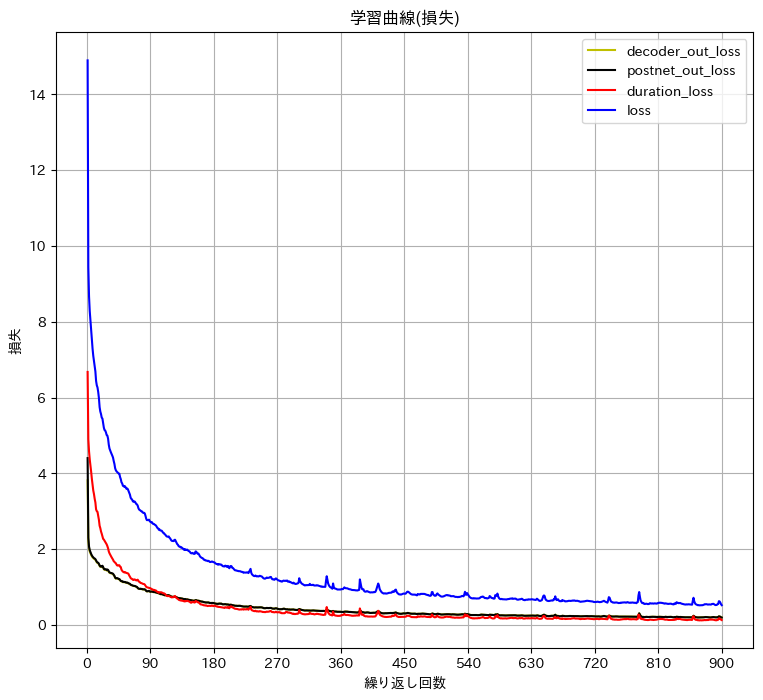

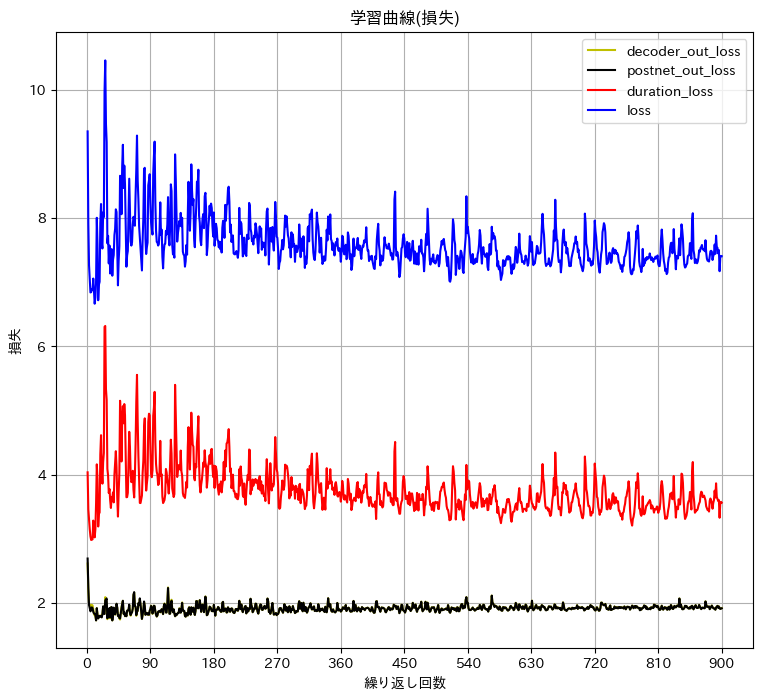

900.0


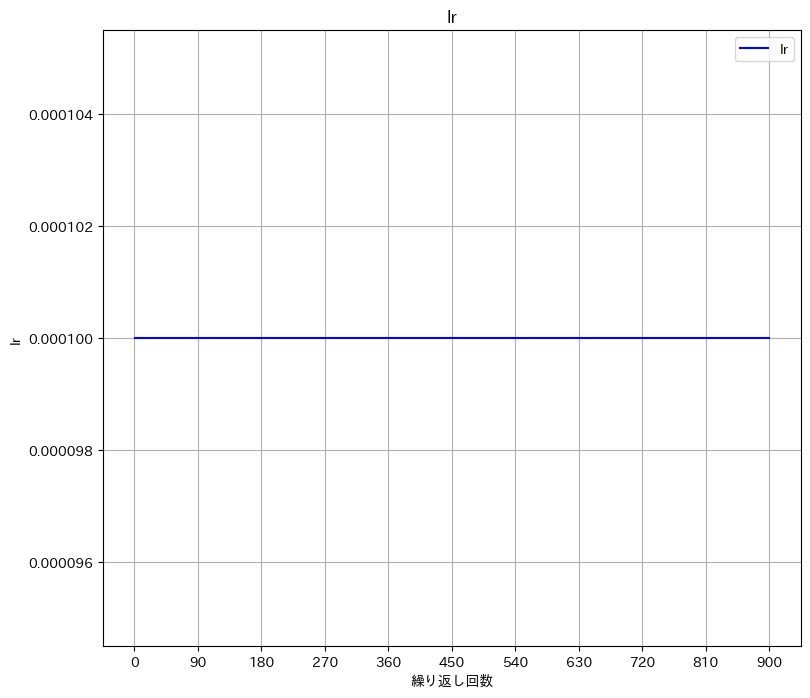

In [100]:
import pandas as pd

# 学習ログ解析
def evaluate_history(history, history_val):
    #損失と精度の確認
    print(f'decoder_out_loss: {history[0,2]:.5f}, postnet_out_loss: {history[0,3]:.5f}, dur_loss: {history[0,4]:.5f}, loss: {history[0,5]:.5f}, lr: {history[0,6]:.5f}') 
    print(f'decoder_out_loss: {history[-1,2]:.5f}, postnet_out_loss: {history[-1,3]:.5f}, dur_loss: {history[-1,4]:.5f}, loss: {history[-1,5]:.5f}, lr: {history[-1,6]:.5f}' )

    it_train = history[-1,0]
    print( it_train )
    if it_train < 10:
      unit = 1
    else:
      unit = it_train // 10

    # 学習曲線の表示 (損失) train
    plt.figure(figsize=(9,8))
    plt.plot(history[:,0], history[:,2], 'y', label='decoder_out_loss')
    plt.plot(history[:,0], history[:,3], 'k', label='postnet_out_loss')
    plt.plot(history[:,0], history[:,4], 'r', label='duration_loss')
    plt.plot(history[:,0], history[:,5], 'b', label='loss')
    plt.xticks(np.arange(0,it_train+1, unit))
    plt.xlabel('繰り返し回数')
    plt.ylabel('損失')
    plt.title('学習曲線(損失)')
    plt.legend()
    plt.show()

    it_dev = history_dev[-1,0]
    if it_dev < 10:
      unit = 1
    else:
      unit = it_dev // 10    
    
    # 学習曲線の表示 (損失) dev
    plt.figure(figsize=(9,8))
    plt.plot(history_dev[:,0], history_val[:,2], 'y', label='decoder_out_loss')
    plt.plot(history_dev[:,0], history_val[:,3], 'k', label='postnet_out_loss')
    plt.plot(history_dev[:,0], history_val[:,4], 'r', label='duration_loss')
    plt.plot(history_dev[:,0], history_val[:,5], 'b', label='loss')
    plt.xticks(np.arange(0,it_dev+1, unit))
    plt.xlabel('繰り返し回数')
    plt.ylabel('損失')
    plt.title('学習曲線(損失)')
    plt.legend()
    plt.show()

    # lr
    it_train = history[-1,0]
    print( it_train )
    if it_train < 10:
      unit = 1
    else:
      unit = it_train // 10
    plt.figure(figsize=(9,8))
    plt.plot(history[:,0], history[:,6], 'b', label='lr')
    plt.xticks(np.arange(0,it_train+1,unit))
    plt.xlabel('繰り返し回数')
    plt.ylabel('lr')
    plt.title('lr')
    plt.legend()
    plt.show()

evaluate_history( history, history_dev)

In [101]:
#最終的には、model.inference にしたいのだが、inference 関数を修正しながらメルスペクトルを見るので、ここの関数を使っている。

model.eval()

@torch.no_grad()
def inference(in_feats ):
    
    """Performs inference over one batch of inputs using greedy decoding."""
    in_feats = torch.unsqueeze( in_feats, axis = 0 )
    in_lens = []
    for feats in ( in_feats):
        in_lens.append( len( feats ))

    # エンコーダによるテキストに潜在する表現の獲得
    encoder_outs, att_ws_enc = model.encoder(in_feats.to(device), torch.tensor(in_lens).to(device))

    #decoder_target_length = 242

    duration_predict = model.duration_prediction( encoder_outs, is_inference = True )
    duration_predict = torch.round( duration_predict ).long()
    #duration_predict = torch.round( duration_predict * 1.2 ).long()
    print( "duration_predict:{}".format( duration_predict ))
    print( "sum of duration_predict:{}".format( torch.sum( duration_predict )))
    
    decoder_targets1 = model.length_regulator( encoder_outs, duration_predict )    
    
    outs, att_ws_dec = model.decoder(encoder_outs, decoder_targets1) 

    outs_fine = outs + model.postnet(outs)

    # (B, C, T) -> (B, T, C)
    outs = outs.transpose(2, 1)
    outs_fine = outs_fine.transpose(2, 1)
    
    att_ws = {}
    att_ws["enc"] = att_ws_enc
    att_ws["dec"] = att_ws_dec
    
    return outs[0], outs_fine[0], att_ws  


In [102]:
#自然音声のメルスペクトルと transtron で合成したメルスペクトルを比較するため inference の計算。

from ttslearn.util import find_lab, find_feats
from ttslearn.tacotron.frontend.openjtalk import text_to_sequence, pp_symbols
# 数値演算
import numpy as np
import torch
from torch import nn
# 音声波形の読み込み
from scipy.io import wavfile
# フルコンテキストラベル、質問ファイルの読み込み
from nnmnkwii.io import hts
# 音声分析
import pyworld
# 音声分析、可視化
import librosa
import librosa.display
import pandas as pd
# Pythonで学ぶ音声合成
import ttslearn
from tqdm.notebook import tqdm
from nnmnkwii.io import hts
from nnmnkwii.frontend import merlin as fe

#train_utt = "BASIC5000_0001"
test_utt = "BASIC5000_5000"
#test_utt = "BASIC5000_4999"

labels = hts.load(find_lab("downloads/jsut-label/", test_utt))
PP = pp_symbols(labels.contexts)
#labels = hts.load(find_lab("downloads/jsut-label/", train_utt))

#out_feats = fe.duration_features( labels )

#print( "out_feats of keizokuchou:{}".format( out_feats ))

phone_to_id = {'~': 0, '^': 1, 'm': 2, 'i[': 3, 'z': 4, 'u': 5, 'o#': 6, 'a[': 7, 'r': 8, 'e]': 9,\
               'e': 10, 'sh': 11, 'i': 12, 'a': 13, 'k': 14, 'a#': 15, 'w': 16, 'n': 17, 'a]': 18, 't': 19,\
               'o': 20, 'd': 21, 's': 22, '$': 23, 'o[': 24, 'y': 25, 'o]': 26, 'b': 27, '_': 28, 'e[': 29,\
               'N': 30, 'u[': 31, 'ry': 32, 'j': 33, 'g': 34, 'i]': 35, 'h': 36, 'ts': 37, 'cl': 38, 'u]': 39,\
               'ny': 40, 'i#': 41, 'p': 42, 'e#': 43, 'f': 44, 'gy': 45, 'ky': 46, 'ch': 47, 'N#': 48, 'u#': 49,\
               '?': 50, 'hy': 51, 'my': 52, 'N]': 53, 'by': 54, 'py': 55, 'cl[': 56, 'v': 57, 'dy': 58}
onso = ["m","i","z","u","o","a","r","e","sh","k","w","n","U","t","d","s","y","b","_","N","ry",\
        "I","j","g","h","ts","cl","ny","p","f","gy","ky","ch","hy","my","by","py","v","dy", "$", "^", "?"]

n = 0
Together_Prosody = []
for PPP in PP:
    #print( "n:{}, PPP:{}".format( n, PPP ) )
    if PPP in onso:
        #duration_PP.append( float( durations_orig[n] ) )
        Together_Prosody.append( PPP )
        #print( "n:{}, Together_Prosody[n]:{}".format( n, Together_Prosody[n] ))
        #last_PPP = PPP
        n += 1
    else:
        Together_Prosody[n-1] = Together_Prosody[n-1] + PPP
        #Together_Prosody[n-1] = last_PPP + PPP
        #print( "n-1:{}, Together_Prosody[n]:{}".format( n-1, Together_Prosody[n-1] ))
        #duration_PP.append( 0 )

in_feats = []
for Together in Together_Prosody:
    in_feats.append( phone_to_id[ Together ] )

in_feats_np = np.array( in_feats )


print( "pp_symbols:{}".format( pp_symbols( labels.contexts )))
#in_feats = text_to_sequence(pp_symbols(labels.contexts))
in_feats = torch.tensor(in_feats, dtype=torch.long)

dur_feats = np.load( "dump/jsut_sr22050/norm/eval/out_duration/" + test_utt + "-feats.npy")
print( "dur_feats:{}".format( dur_feats ))

with torch.no_grad():
    out_feats, out_feats_fine, alignment0 = inference( in_feats )
    
# 比較用に、自然音声から抽出された音響特徴量を読み込みむ
feats = np.load(find_feats("dump/jsut_sr22050/norm/", test_utt, typ="out_tacotron"))
print( "len of feats:{}".format( len( feats)))
#feats = np.load(find_feats("dump/jsut_sr22050/norm/", train_utt, typ="out_tacotron"))

pp_symbols:['^', 'a', ']', 't', 'o', '#', 's', 'a', '[', 'N', 'j', 'u', ']', 'cl', 'p', 'u', 'N', 'n', 'o', '#', 'y', 'u', ']', 'u', 'y', 'o', 'g', 'a', '#', 'a', '[', 't', 'a', 'e', 'r', 'a', 'r', 'e', 't', 'a', '$']
dur_feats:[ 4.3038   6.88608  4.3038   2.58228 11.18987  7.74684  5.16456  6.4557
  4.3038   6.02532 10.32911  5.16456  4.3038   6.02532  3.44304 10.32911
  4.3038   4.3038   6.88608  6.02532  6.02532  2.58228  8.60759  7.74684
  3.44304  7.74684  6.02532  5.16456  4.3038   6.88608  6.02532 10.75949
  8.60759]
duration_predict:tensor([[ 4,  7,  5,  3, 10,  7,  6,  7,  6,  5,  8,  4,  5,  4,  3, 10,  3,  3,
          6,  5,  5,  5,  7,  7,  8,  5,  5,  2,  5,  5,  6, 10,  8]])
sum of duration_predict:189
len of feats:204


(204, 80)


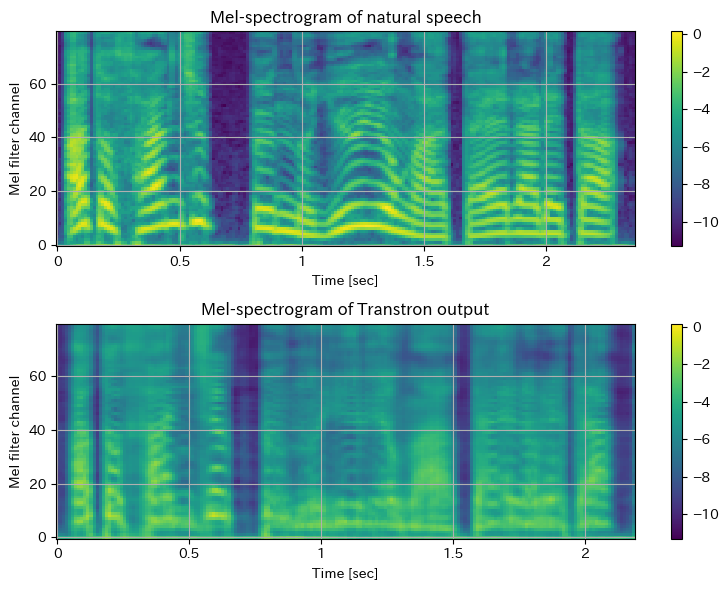

In [103]:
#自然音声のメルスペクトルの transtron で合成したメルスペクトルの可視化（自然音声と、inferecne のスペクトル）
from ttslearn.notebook import get_cmap, init_plot_style, savefig
cmap = get_cmap()
init_plot_style()

fig, ax = plt.subplots(2, 1, figsize=(8,6))
ax[0].set_title("Mel-spectrogram of natural speech")
ax[1].set_title("Mel-spectrogram of Transtron output")

sr = 22050

mindb = min(feats.min(), out_feats_fine.min())
maxdb = max(feats.max(), out_feats_fine.max())

#hop_length = int(sr * 0.0125)
#hop_length = int(sr * 0.0116100)
hop_length = 256
# 比較用に、自然音声から抽出された音響特徴量を読み込みむ
#feats = np.load(find_feats("dump/jsut_sr22050/norm/", train_utt, typ="out_tacotron"))
feats = np.load(find_feats("dump/jsut_sr22050/norm/", test_utt, typ="out_tacotron"))
print( feats.shape )
mesh = librosa.display.specshow(
    feats.T, sr=sr, x_axis="time", y_axis="frames", hop_length=hop_length, cmap=cmap, ax=ax[0])
mesh.set_clim(mindb, maxdb)
fig.colorbar(mesh, ax=ax[0])

mesh = librosa.display.specshow(
    out_feats_fine.data.numpy().T, sr=sr, x_axis="time", y_axis="frames", hop_length=hop_length, cmap=cmap, ax=ax[1])
mesh.set_clim(mindb, maxdb)
fig.colorbar(mesh, ax=ax[1])

for a in ax:
    a.set_xlabel("Time [sec]")
    a.set_ylabel("Mel filter channel")
fig.tight_layout()




In [104]:
#melspectrogram を ファイルに保存
np.save( "./hifi-gan-master/test_mel_files/test.npy", out_feats_fine.data.numpy().T)

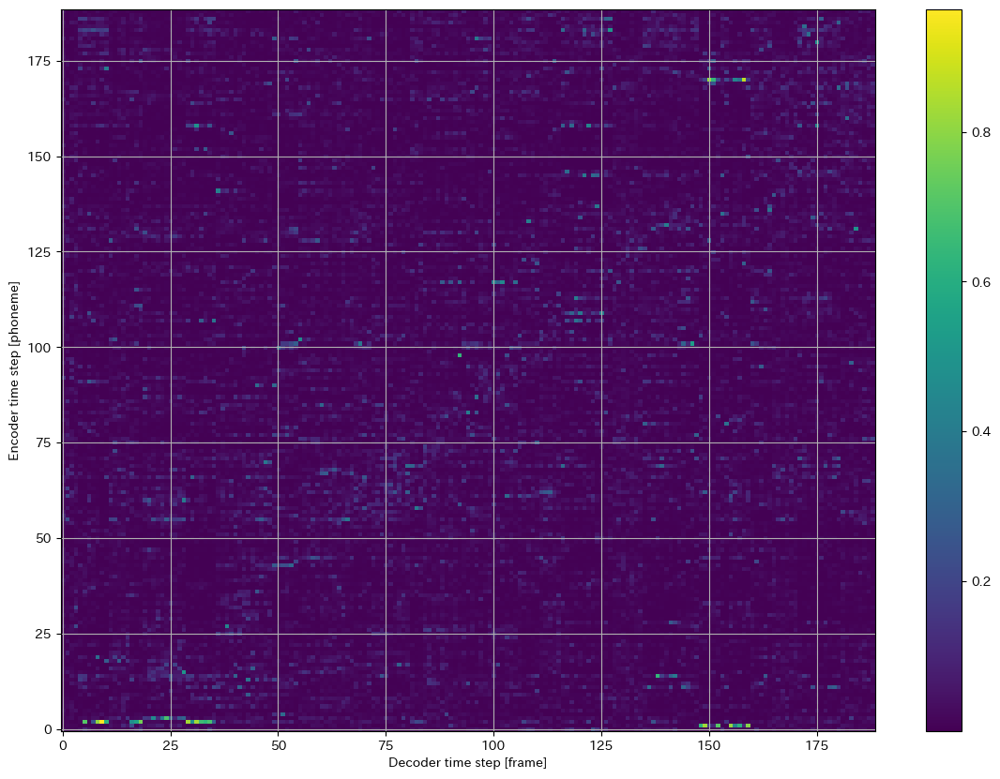

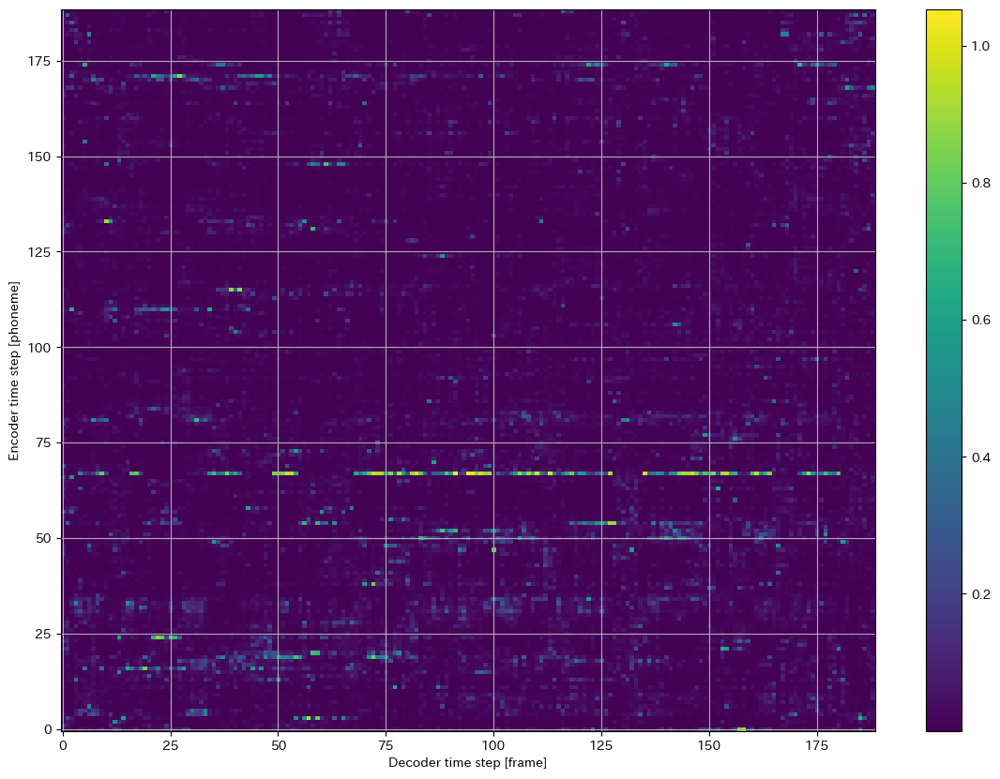

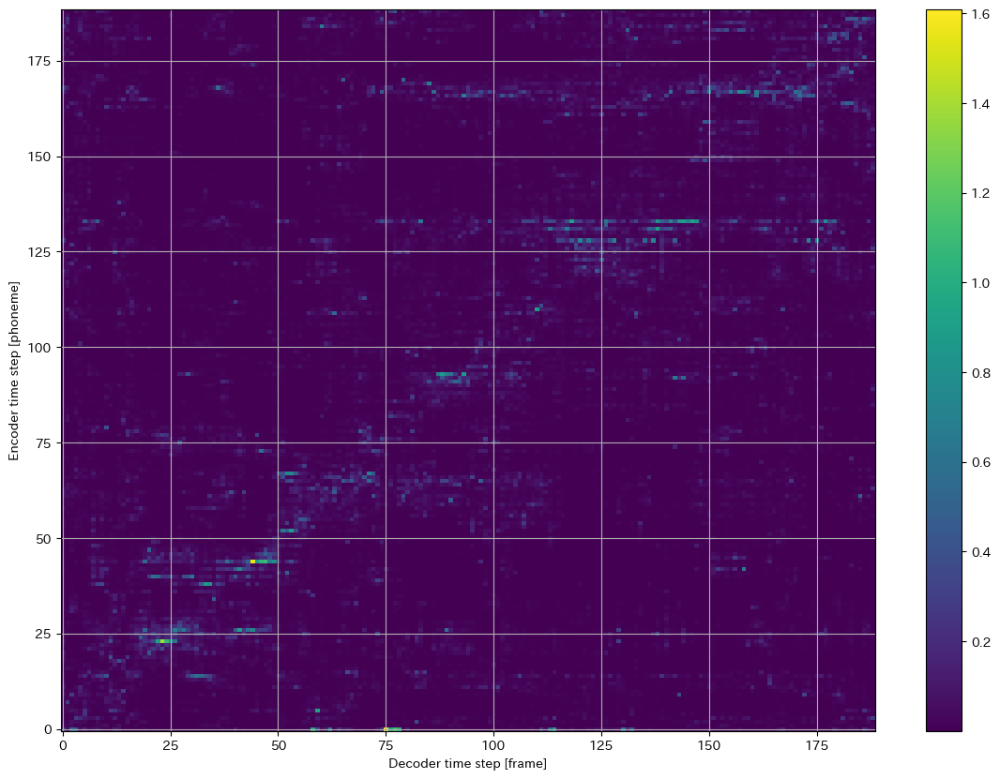

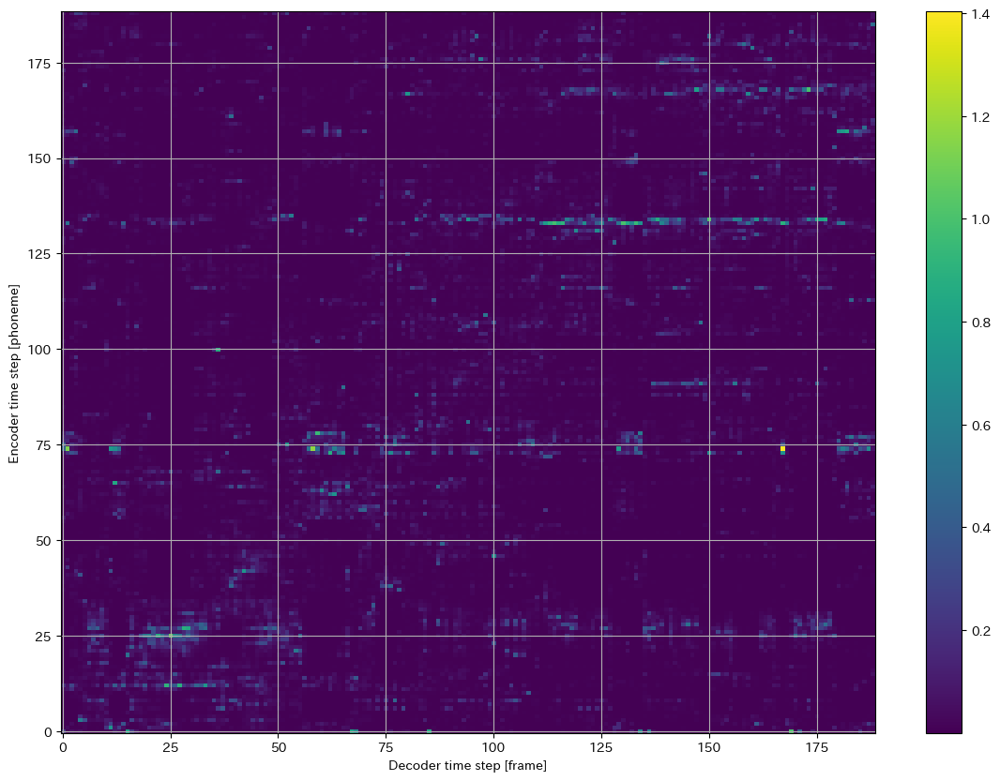

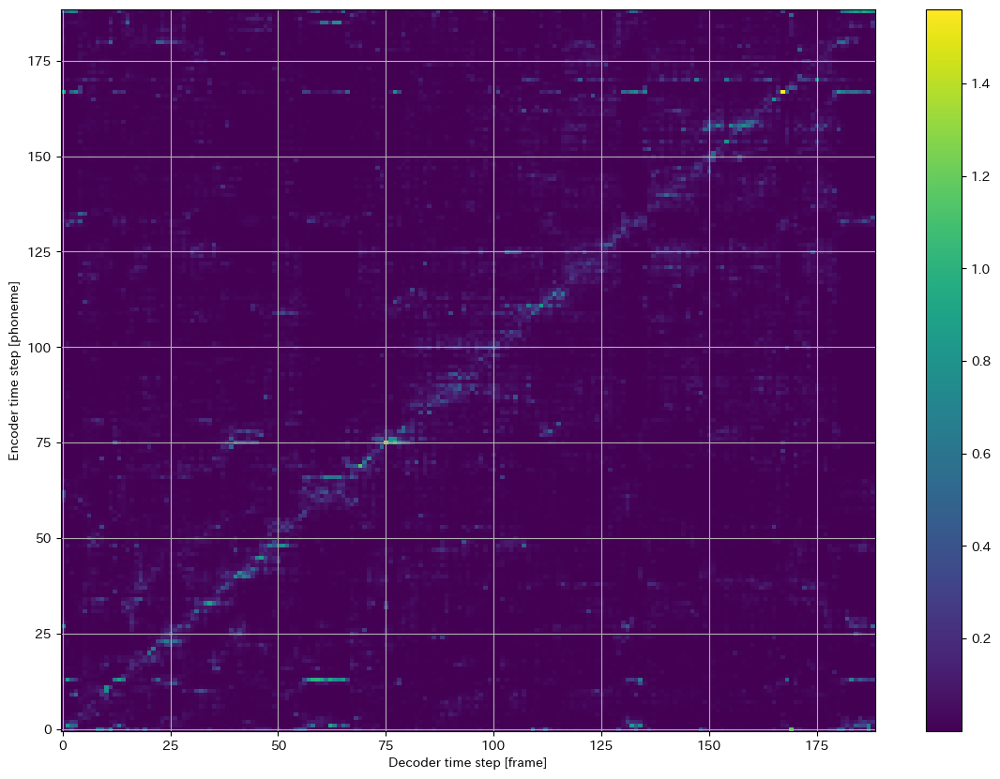

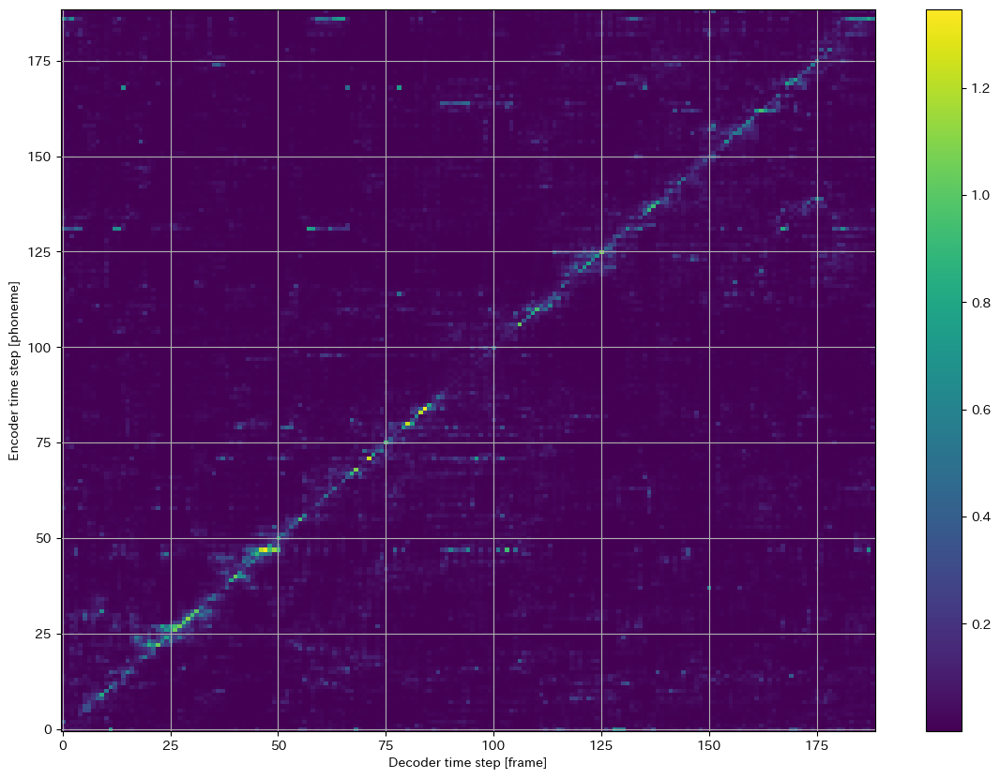

In [105]:
#アテンション重みの可視化　デコーダー
fig1, ax1 = plt.subplots(figsize=(14,10))
#fig2, ax2 = plt.subplots(figsize=(14,10))
fig3, ax3 = plt.subplots(figsize=(14,10))
#fig4, ax4 = plt.subplots(figsize=(14,10))
fig5, ax5 = plt.subplots(figsize=(14,10))
#fig6, ax6 = plt.subplots(figsize=(14,10))
fig7, ax7 = plt.subplots(figsize=(14,10))
#fig8, ax8 = plt.subplots(figsize=(14,10))
fig9, ax9 = plt.subplots(figsize=(14,10))
#fig10, ax10 = plt.subplots(figsize=(14,10))
fig11, ax11 = plt.subplots(figsize=(14,10))
#fig12, ax12 = plt.subplots(figsize=(14,10))


alignment1 = torch.sum( torch.sum( alignment0["dec"]["1"], axis=0 ), axis = 0 )
#alignment2 = torch.sum( torch.sum( alignment0["dec"]["2"], axis=0 ), axis = 0 )
alignment3 = torch.sum( torch.sum( alignment0["dec"]["3"], axis=0 ), axis = 0 )
#alignment4 = torch.sum( torch.sum( alignment0["dec"]["4"], axis=0 ), axis = 0 )
alignment5 = torch.sum( torch.sum( alignment0["dec"]["5"], axis=0 ), axis = 0 )
#alignment6 = torch.sum( torch.sum( alignment0["dec"]["6"], axis=0 ), axis = 0 )
alignment7 = torch.sum( torch.sum( alignment0["dec"]["7"], axis=0 ), axis = 0 )
#alignment8 = torch.sum( torch.sum( alignment0["dec"]["8"], axis=0 ), axis = 0 )
alignment9 = torch.sum( torch.sum( alignment0["dec"]["9"], axis=0 ), axis = 0 )
#alignment10 = torch.sum( torch.sum( alignment0["dec"]["10"], axis=0 ), axis = 0 )
alignment11 = torch.sum( torch.sum( alignment0["dec"]["11"], axis=0 ), axis = 0 )
#alignment12 = torch.sum( torch.sum( alignment0["dec"]["12"], axis=0 ), axis = 0 )

im1 = ax1.imshow(alignment1.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig1.colorbar(im1, ax=ax1)
ax1.set_xlabel("Decoder time step [frame]")
ax1.set_ylabel("Encoder time step [phoneme]");
#im2 = ax2.imshow(alignment2.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig2.colorbar(im2, ax=ax2)
#ax2.set_xlabel("Decoder time step [frame]")
#ax2.set_ylabel("Encoder time step [phoneme]");
im3 = ax3.imshow(alignment3.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig3.colorbar(im3, ax=ax3)
ax3.set_xlabel("Decoder time step [frame]")
ax3.set_ylabel("Encoder time step [phoneme]");
#im4 = ax4.imshow(alignment4.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig4.colorbar(im4, ax=ax4)
#ax4.set_xlabel("Decoder time step [frame]")
#ax4.set_ylabel("Encoder time step [phoneme]");
im5 = ax5.imshow(alignment5.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig5.colorbar(im5, ax=ax5)
ax5.set_xlabel("Decoder time step [frame]")
ax5.set_ylabel("Encoder time step [phoneme]");
#im6 = ax6.imshow(alignment6.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig6.colorbar(im4, ax=ax6)
#ax6.set_xlabel("Decoder time step [frame]")
#ax6.set_ylabel("Encoder time step [phoneme]");
im7 = ax7.imshow(alignment7.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig7.colorbar(im7, ax=ax7)
ax7.set_xlabel("Decoder time step [frame]")
ax7.set_ylabel("Encoder time step [phoneme]");
#im8 = ax8.imshow(alignment8.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig8.colorbar(im8, ax=ax8)
#ax8.set_xlabel("Decoder time step [frame]")
#ax8.set_ylabel("Encoder time step [phoneme]");
im9 = ax9.imshow(alignment9.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig9.colorbar(im9, ax=ax9)
ax9.set_xlabel("Decoder time step [frame]")
ax9.set_ylabel("Encoder time step [phoneme]");
#im10 = ax10.imshow(alignment10.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig10.colorbar(im10, ax=ax10)
#ax10.set_xlabel("Decoder time step [frame]")
#ax10.set_ylabel("Encoder time step [phoneme]");
im11 = ax11.imshow(alignment11.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig11.colorbar(im11, ax=ax11)
ax11.set_xlabel("Decoder time step [frame]")
ax11.set_ylabel("Encoder time step [phoneme]");
#im12 = ax12.imshow(alignment12.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig12.colorbar(im12, ax=ax12)
#ax12.set_xlabel("Decoder time step [frame]")
#ax12.set_ylabel("Encoder time step [phoneme]");

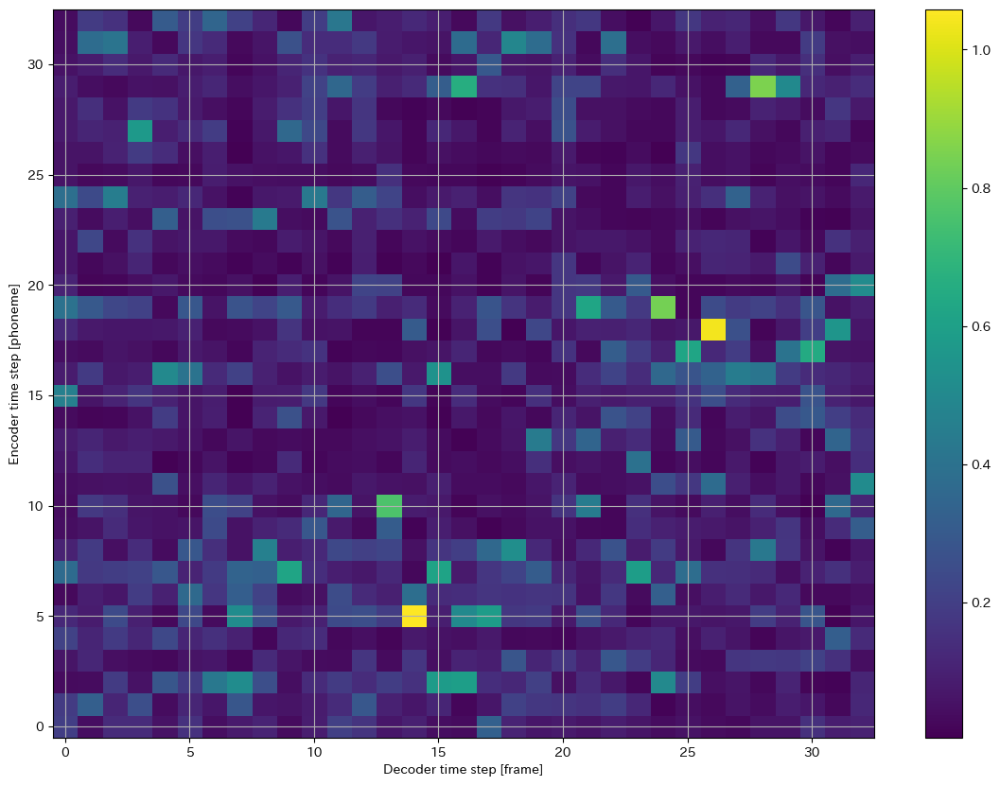

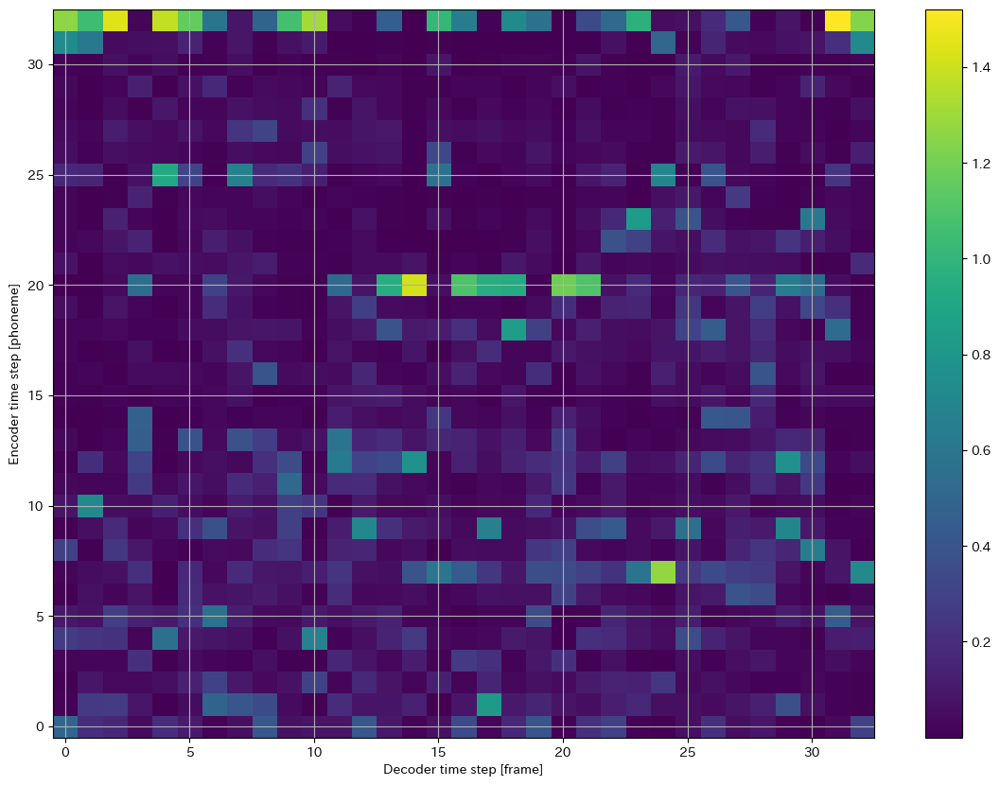

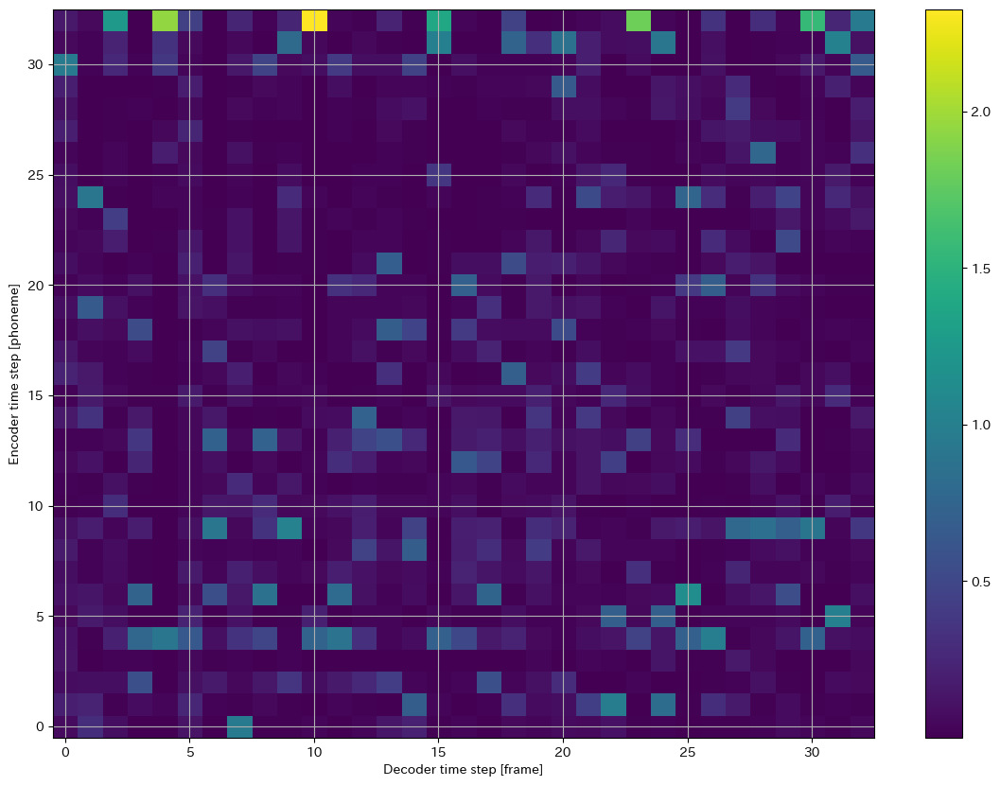

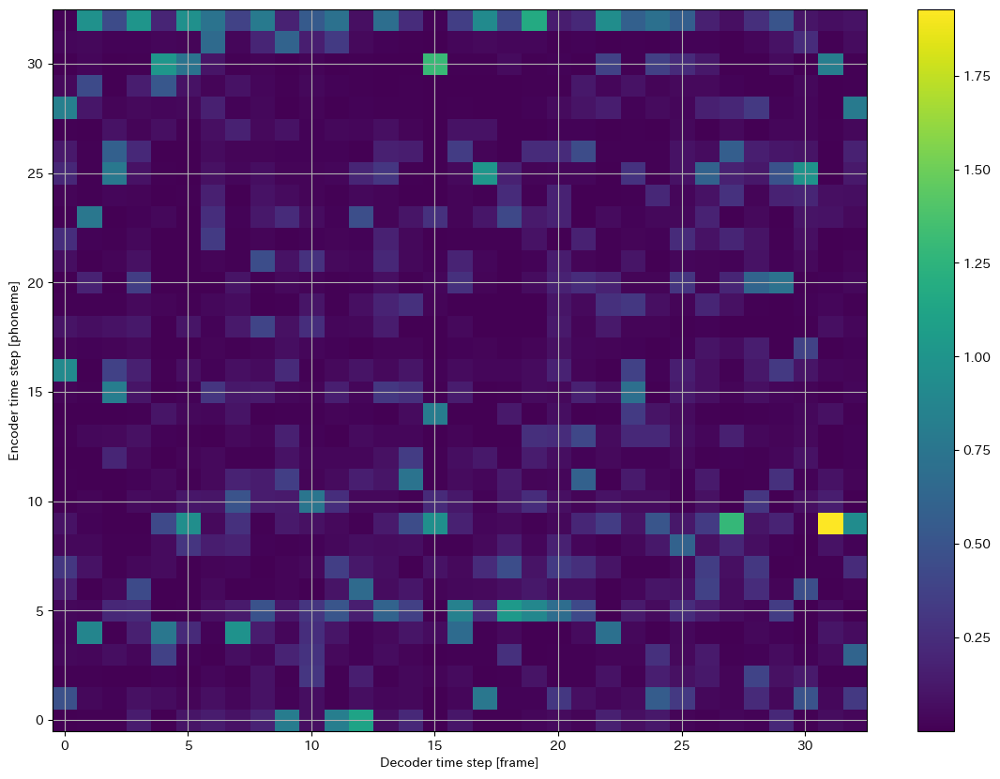

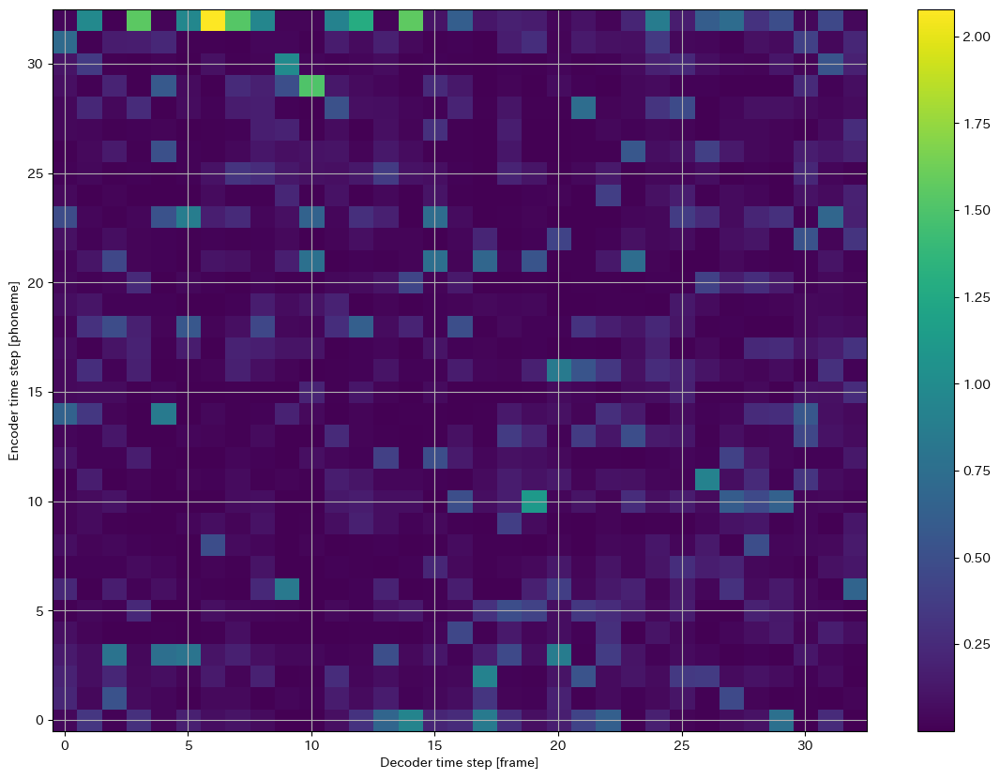

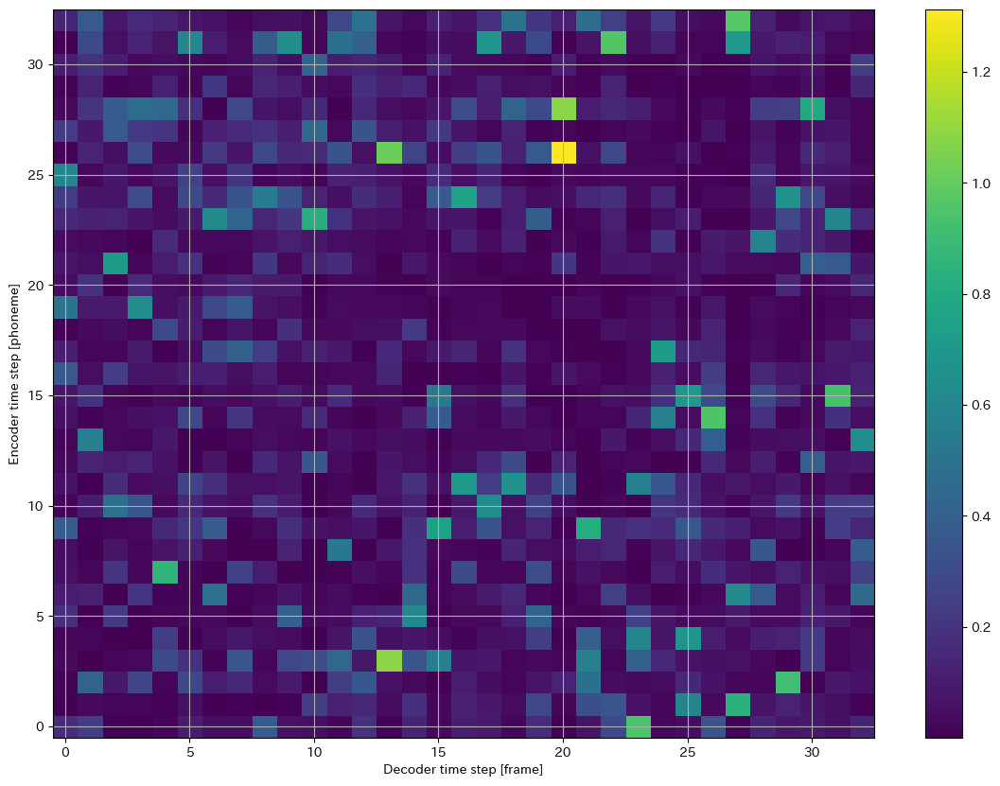

In [106]:
#アテンション重みの可視化　エンコーダー
fig1, ax1 = plt.subplots(figsize=(14,10))
#fig2, ax2 = plt.subplots(figsize=(14,10))
fig3, ax3 = plt.subplots(figsize=(14,10))
#fig4, ax4 = plt.subplots(figsize=(14,10))
fig5, ax5 = plt.subplots(figsize=(14,10))
#fig6, ax6 = plt.subplots(figsize=(14,10))
fig7, ax7 = plt.subplots(figsize=(14,10))
#fig8, ax8 = plt.subplots(figsize=(14,10))
fig9, ax9 = plt.subplots(figsize=(14,10))
#fig10, ax10 = plt.subplots(figsize=(14,10))
fig11, ax11 = plt.subplots(figsize=(14,10))
#fig12, ax12 = plt.subplots(figsize=(14,10))


alignment1 = torch.sum( torch.sum( alignment0["enc"]["1"], axis=0 ), axis = 0 )
#alignment2 = torch.sum( torch.sum( alignment0["enc"]["2"], axis=0 ), axis = 0 )
alignment3 = torch.sum( torch.sum( alignment0["enc"]["3"], axis=0 ), axis = 0 )
#alignment4 = torch.sum( torch.sum( alignment0["enc"]["4"], axis=0 ), axis = 0 )
alignment5 = torch.sum( torch.sum( alignment0["enc"]["5"], axis=0 ), axis = 0 )
#alignment6 = torch.sum( torch.sum( alignment0["enc"]["6"], axis=0 ), axis = 0 )
alignment7 = torch.sum( torch.sum( alignment0["enc"]["7"], axis=0 ), axis = 0 )
#alignment8 = torch.sum( torch.sum( alignment0["enc"]["8"], axis=0 ), axis = 0 )
alignment9 = torch.sum( torch.sum( alignment0["enc"]["9"], axis=0 ), axis = 0 )
#alignment10 = torch.sum( torch.sum( alignment0["enc"]["10"], axis=0 ), axis = 0 )
alignment11 = torch.sum( torch.sum( alignment0["enc"]["11"], axis=0 ), axis = 0 )
#alignment12 = torch.sum( torch.sum( alignment0["enc"]["12"], axis=0 ), axis = 0 )

im1 = ax1.imshow(alignment1.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig1.colorbar(im1, ax=ax1)
ax1.set_xlabel("Decoder time step [frame]")
ax1.set_ylabel("Encoder time step [phoneme]");
#im2 = ax2.imshow(alignment2.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig2.colorbar(im2, ax=ax2)
#ax2.set_xlabel("Decoder time step [frame]")
#ax2.set_ylabel("Encoder time step [phoneme]");
im3 = ax3.imshow(alignment3.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig3.colorbar(im3, ax=ax3)
ax3.set_xlabel("Decoder time step [frame]")
ax3.set_ylabel("Encoder time step [phoneme]");
#im4 = ax4.imshow(alignment4.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig4.colorbar(im4, ax=ax4)
#ax4.set_xlabel("Decoder time step [frame]")
#ax4.set_ylabel("Encoder time step [phoneme]");
im5 = ax5.imshow(alignment5.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig5.colorbar(im5, ax=ax5)
ax5.set_xlabel("Decoder time step [frame]")
ax5.set_ylabel("Encoder time step [phoneme]");
#im6 = ax6.imshow(alignment6.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig6.colorbar(im4, ax=ax6)
#ax6.set_xlabel("Decoder time step [frame]")
#ax6.set_ylabel("Encoder time step [phoneme]");
im7 = ax7.imshow(alignment7.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig7.colorbar(im7, ax=ax7)
ax7.set_xlabel("Decoder time step [frame]")
ax7.set_ylabel("Encoder time step [phoneme]");
#im8 = ax8.imshow(alignment8.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig8.colorbar(im8, ax=ax8)
#ax8.set_xlabel("Decoder time step [frame]")
#ax8.set_ylabel("Encoder time step [phoneme]");
im9 = ax9.imshow(alignment9.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig9.colorbar(im9, ax=ax9)
ax9.set_xlabel("Decoder time step [frame]")
ax9.set_ylabel("Encoder time step [phoneme]");
#im10 = ax10.imshow(alignment10.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig10.colorbar(im10, ax=ax10)
#ax10.set_xlabel("Decoder time step [frame]")
#ax10.set_ylabel("Encoder time step [phoneme]");
im11 = ax11.imshow(alignment11.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
fig11.colorbar(im11, ax=ax11)
ax11.set_xlabel("Decoder time step [frame]")
ax11.set_ylabel("Encoder time step [phoneme]");
#im12 = ax12.imshow(alignment12.cpu().data.numpy().T, aspect="auto", origin="lower", interpolation="nearest")
#fig12.colorbar(im12, ax=ax12)
#ax12.set_xlabel("Decoder time step [frame]")
#ax12.set_ylabel("Encoder time step [phoneme]");

In [107]:
!python hifi-gan-master\inference_e2e.py --input_mels_dir hifi-gan-master/test_mel_files --output_dir hifi-gan-master/generated_files_from_mel --checkpoint_file hifi-gan-master\cp_hifigan\g_00087000

Initializing Inference Process..
Loading 'hifi-gan-master\cp_hifigan\g_00087000'
Complete.
Removing weight norm...
hifi-gan-master/generated_files_from_mel\BASIC5000_0001_generated_e2e.wav
hifi-gan-master/generated_files_from_mel\BASIC5000_5000_generated_e2e.wav
hifi-gan-master/generated_files_from_mel\test_generated_e2e.wav


C:\Users\toshi\anaconda3\envs\OpneCV_Face\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\toshi\anaconda3\envs\OpneCV_Face\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
C:\Users\toshi\anaconda3\envs\OpneCV_Face\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [108]:
from IPython.display import Audio
import IPython
import librosa

gen_wav, sr = librosa.load( "hifi-gan-master/generated_files_from_mel/test_generated_e2e.wav")

sr = 22050
IPython.display.display(Audio(gen_wav, rate=sr))

from scipy.io.wavfile import read, write
writefilename = "./test_inference.wav"
write(writefilename, rate=22050, data=gen_wav)

In [57]:
gen_wav, sr = librosa.load( "hifi-gan-master/generated_files_from_mel/BASIC5000_5000_generated_e2e.wav")

sr = 22050
IPython.display.display(Audio(gen_wav, rate=sr))

In [ ]:
import pyopenjtalk
# この実装は後述します
from ttslearn.tacotron.frontend.openjtalk import pp_symbols
from ttslearn.tacotron.frontend.openjtalk import text_to_sequence, pp_symbols
from ttslearn.util import find_lab, find_feats
from ttslearn.dsp import logmelspectrogram_to_audio
from IPython.display import Audio
import IPython

text = "今日の天気は？"

# テキストからフルコンテキストを抽出
labels = pyopenjtalk.extract_fullcontext(text)
# フルコンテキストから、韻律記号付き音素列に変換
PP = pp_symbols(labels)

print("入力文字列:", text)
print("音素列:", pyopenjtalk.g2p(text))
print("韻律記号付き音素列:", " ".join(PP))

in_feats = np.array(text_to_sequence(PP), dtype=np.int64)

with torch.no_grad():

    out_feats, out_feats_fine, alignment0 = inference( in_feats )
    # WaveNet ボコーダによる音声波形の生成
    gen_wav = gen_waveform(wavenet_model, out_feats_fine)
    
sr = 22050
IPython.display.display(Audio(gen_wav, rate=sr))

In [ ]:
# 比較用に元音声の読み込み
from scipy.io import wavfile
_sr, ref_wav = wavfile.read(f"./downloads/jsut_ver1.1/basic5000/wav/{test_utt}.wav")
ref_wav = (ref_wav / 32768.0).astype(np.float64)
ref_wav = librosa.resample(ref_wav, _sr, sr)

In [ ]:
#評価
import IPython
from IPython.display import Audio

fig, ax = plt.subplots(2, 1, figsize=(8,6))

#hop_length = int(sr * 0.005)
hop_length = 256
fft_size = pyworld.get_cheaptrick_fft_size(sr)

# Tacotronの出力と粗く揃えるために、自然音声の冒頭と末尾の無音区間を削除
ref_wav_trim = librosa.effects.trim(ref_wav, top_db=20)[0]

spec_ref = librosa.stft(ref_wav_trim, n_fft=fft_size, hop_length=hop_length, window="hann")
logspec_ref = np.log(np.abs(spec_ref))
spec_gen = librosa.stft(gen_wav, n_fft=fft_size, hop_length=hop_length, window="hann")
logspec_gen = np.log(np.abs(spec_gen))

mindb = min(logspec_ref.min(), logspec_gen.min())
maxdb = max(logspec_ref.max(), logspec_gen.max())

mesh = librosa.display.specshow(logspec_ref, hop_length=hop_length, sr=sr, cmap=cmap, x_axis="time", y_axis="hz", ax=ax[0])
mesh.set_clim(mindb, maxdb)
fig.colorbar(mesh, ax=ax[0], format="%+2.fdB")

mesh = librosa.display.specshow(logspec_gen, hop_length=hop_length, sr=sr, cmap=cmap, x_axis="time", y_axis="hz", ax=ax[1])
mesh.set_clim(mindb, maxdb)
fig.colorbar(mesh, ax=ax[1], format="%+2.fdB")

ax[0].set_title("Spectrogram of natural speech")
ax[1].set_title("Spectrogram of generated speech")

for a in ax:
    a.set_xlabel("Time [sec]")
    a.set_ylabel("Frequency [Hz]")

plt.tight_layout()

print("自然音声")
IPython.display.display(Audio(ref_wav_trim, rate=sr))
print("Transtron による合成音声")
IPython.display.display(Audio(gen_wav, rate=sr))

# 図10-9
savefig("./fig/e2etts_impl_tts_spec_comp")